# Prediction of the Box-Counting Dimension of Metal Nanoparticles: Models Training and Evaluation (Data-Driven Reduction)

This notebook contains the models training and evaluation results from the machine learning predictions of the box-counting dimensions, $D_B$, computed for monometallic gold, palladium, and platinum nanoparticles, in attempt to explore the possibility of using a machine learning model to compute the $D_B$ values to save computational costs. The feature importance profiles are also studied to investigate the most influential features in the prediction of the $D_B$ of metal nanoparticles.

The $D_B$ values are computed using [Sphractal](https://github.com/jon-ting/sphractal), a Python package for the estimation of the fractal dimension of the surfaces of atomistic objects via box-counting approaches.

## Outline

[Notebook Setups](#setup)

[Monometallic Nanoparticles](#mnps)

<a id='setup'></a>
## Notebook Setups

In [6]:
%load_ext autoreload
%autoreload 2

In [7]:
# Import relevant libraries
from os import chdir, listdir
from os.path import exists
import pickle
import warnings

import lightgbm
import scipy
import seaborn as sns
import sklearn

from lightgbm import LGBMRegressor
from natsort import natsorted
import numpy as np
from scipy import stats
# from sklearnex import patch_sklearn; 
# patch_sklearn()
from sklearn.ensemble import HistGradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR

from sklearn.linear_model import ElasticNetCV, LassoLarsCV, LinearRegression, RidgeCV  # To be removed after debugging

chdir('/scratch/q27/jt5911/metal-nanoparticle-causal-path-probability/strategicInf')
from trainEvalModels import *

# Print package versions for reproducibility
print('Versions of imported libraries:')
print(f"  lightgbm: {lightgbm.__version__}")
print(f"  matplotlib: {mpl.__version__}")
print(f"  numpy: {np.__version__}")
print(f"  pandas: {pd.__version__}")
print(f"  scipy: {scipy.__version__}")
print(f"  scikit-learn: {sklearn.__version__}")
print(f"  seaborn: {sns.__version__}")

Versions of imported libraries:
  lightgbm: 4.2.0
  matplotlib: 3.8.2
  numpy: 1.24.4
  pandas: 2.1.4
  scipy: 1.11.4
  scikit-learn: 1.4.0
  seaborn: 0.13.1


Below are some general settings for plotting figures:

In [8]:
# Settings for figures
sns.set_theme(context='paper', style='ticks', palette='colorblind', font='sans-serif', font_scale=1, color_codes=True, rc=None)  # Options are: {paper, notebook, talk, poster}
figSize, fontSize, labelSize = (3.5, 2.5), 'medium', 'small'
legendSize, lineWidth, markerSize = 'x-small', 1, 3
# SMALL_SIZE, MEDIUM_SIZE, LARGE_SIZE, TITLE_SIZE = 8, 10, 12, 14
# plt.rc('font', size=LARGE_SIZE)  # controls default text sizes
# plt.rc('axes', titlesize=TITLE_SIZE)  # fontsize of the axes title
# plt.rc('axes', labelsize=LARGE_SIZE)  # fontsize of the x and y labels
# plt.rc('xtick', labelsize=LARGE_SIZE)  # fontsize of the tick labels
# plt.rc('ytick', labelsize=LARGE_SIZE)  # fontsize of the tick labels
# plt.rc('legend', fontsize=LARGE_SIZE)  # legend fontsize
# plt.rc('figure', titlesize=TITLE_SIZE)  # fontsize of the figure title

In [9]:
# Global variables
SCALING = 'minmax'  # {None, 'minmax', 'standard', 'yeo-johnson'}
POLY_FEATS = False
NUM_JOBS = 48
VERBOSE = True
RANDOM_SEED = 42
NUM_RUNS = 10

DATA_DIR = '/scratch/q27/jt5911/metal-nanoparticle-causal-path-probability/data'
FIG_DIR = '/scratch/q27/jt5911/metal-nanoparticle-causal-path-probability/figs'

In [10]:
def rmNullFeats(featsDF, verbose=False):
    if verbose:
        print(f"Removing the features with null values...")
        print(f"  Original number of features: {len(featsDF.columns)}")
    featsToDrop = []
    for feat in featsDF.columns:
        if featsDF[feat].isnull().any():
            featsToDrop.append(feat)
    featsNoNullDF = featsDF.drop(featsToDrop, axis=1, inplace=False)
    if verbose:
        print(f"  Total number of features left: {len(featsNoNullDF.columns)}\n")
    return featsNoNullDF

In [11]:
def genModel(hpValDict, modelName):
    if modelName == 'RFR':
        kwargs = {'n_estimators': 100, 'criterion': 'squared_error', 
                  # Adjust to deal with overfitting and speed up training
                  'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 
                  'min_samples_split': 2, 'min_samples_leaf': 1, 'min_impurity_decrease': 0.0, 'ccp_alpha': 0.0, 
                  # Parameters to be fixed
                  'min_weight_fraction_leaf': 0.0, 'bootstrap': True, 'warm_start': False, 
                  'monotonic_cst': None, 'oob_score': False, 'n_jobs': NUM_JOBS, 'random_state': RANDOM_SEED, 'verbose': 0}
    elif modelName == 'LGB':
        kwargs = {'num_leaves': 31, 'min_child_samples': 20, 'learning_rate': 0.1, 'n_estimators': 100, 
                  # Adjust to deal with overfitting
                  'min_child_weight': 0.001, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 
                  'subsample': 1.0, 'subsample_freq': 0, 'colsample_bytree': 1.0, 
                  # Adjust to speed up training
                  'min_split_gain': 0.0, 'subsample_for_bin': 200000, 'max_bin': 255, 'max_depth': -1, 
                  # Parameters to be fixed
                  'boosting_type': 'gbdt', 'importance_type': 'gain', 'tree_learner': 'data', 
                  'objective': 'regression', 'class_weight': None, 'use_missing': True,
                  'random_state': RANDOM_SEED, 'n_jobs': NUM_JOBS, 'force_row_wise': True, 'verbose': -1}

    for hp in hpValDict.keys():
        kwargs[hp] = hpValDict[hp]
        
    if modelName == 'RFR':
        return RandomForestRegressor(**kwargs)
    elif modelName == 'LGB':
        return LGBMRegressor(**kwargs)

In [12]:
def getTrainTestScores(dataset, hpsValsDicts, modelName):
    Xtrain, Xtest, yTrain, yTest = dataset
    trainScores, testScores = [], []
    for hpsValsDict in hpsValsDicts:
        reg = genModel(hpsValsDict, modelName)
        reg.fit(Xtrain, yTrain)
        trainScores.append(reg.score(Xtrain, yTrain))
        testScores.append(reg.score(Xtest, yTest))
    return trainScores, testScores

In [13]:
def hpVSr2(xVals, scores, xlabel, figSize=(7, 2.5)):
    mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=['#303F9F', '#FF5252', '#D32F2F'])
    if len(scores) == 1:
        trainScores, testScores = scores[0]
        plt.figure(figsize=figSize)
        if all(isinstance(xVal, str) for xVal in xVals):
            plt.bar(xVals, trainScores)
            plt.bar(xVals, testScores)
        else:
            plt.plot(xVals, trainScores)
            plt.plot(xVals, testScores)
            plt.xlabel(xlabel)
        plt.grid(linestyle='dotted')
        plt.ylabel('R2 score')
        plt.legend(['Train', 'Test']);
    else:
        fig, axes = plt.subplots(1, len(scores), figsize=figSize)
        for i, (trainScores, testScores) in enumerate(scores):
            if all(isinstance(xVal, str) for xVal in xVals):
                axes[i].bar(xVals, trainScores)
                axes[i].bar(xVals, testScores)
            else:
                axes[i].plot(xVals, trainScores)
                axes[i].plot(xVals, testScores)
            axes[i].grid(linestyle='dotted')
            axes[i].legend(['Train', 'Test'])
        fig.text(0.5, -0.03, xlabel, ha='center')
        fig.text(0.05, 0.5, 'R2 score', va='center', rotation='vertical');

<a id='mnps'></a>
## Monometallic Nanoparticles

Here we attempt to train a machine learning model that aims to predict the $D_B$ values of a set of simulated monometallic nanoparticles (either gold, palladium, or platinum), study the feature importance profile to understand the influential features in the prediction of the $D_B$ values, and investigate the conditions that give rise to rougher nanoparticles.

### Random Instances

Removing the features with null values...
  Original number of features: 46
  Total number of features left: 46

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.638
    Cross-validation score: 0.356 +/- 0.180
    Testing score:
      Mean absolute error: 0.018067
      Mean squared error: 0.001216
      Root mean squared error: 0.034865
      Coefficient of determination: -0.510


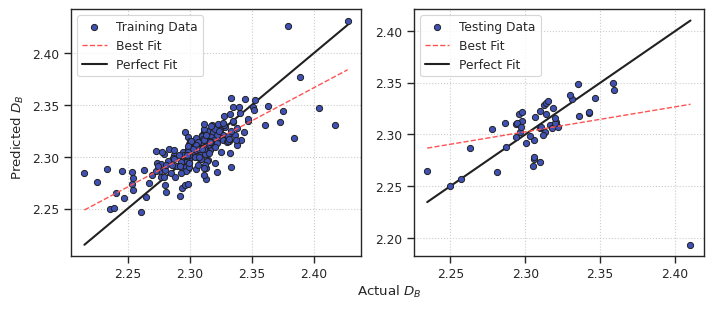

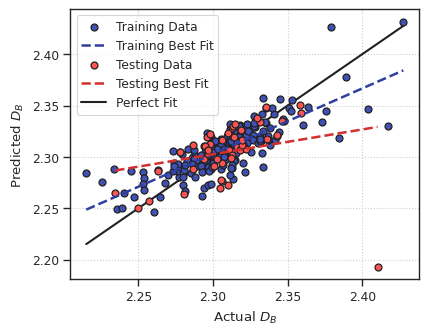

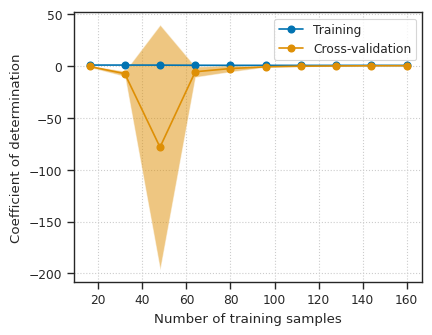

  Feature coefficients:
    time: 0.007
    q6q6_avg_surf: 0.014
    S_111: 0.100
    S_110: 0.032
    R_diff: 0.005
    R_min: 0.045
    MM_BCN_avg: 0.049
    MMM_BA1_avg: 0.015
    DECA: 0.013
    Curve_11-20: 0.076
    MM_SCN_8: 0.188
    MM_SCN_12: 0.043
    MM_SCN_13: 0.013
    q6q6_S_4: 0.010
    q6q6_S_13: 0.003
    MM_BCN_6: 0.009
    MM_BCN_7: 0.004
    MM_BCN_9: 0.039

Dataset: MNP
Best score: 0.594
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 8, 'max_features': 0.7319314865636465, 'max_leaf_nodes': 69, 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 15}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.884
    Cross-validation score: 0.594 +/- 0.098
    Testing score:
      Mean absolute error: 0.014959
      Mean squared error: 0.000662
      Root mean squared error: 0.025724
      Coefficient of determination: 0.178


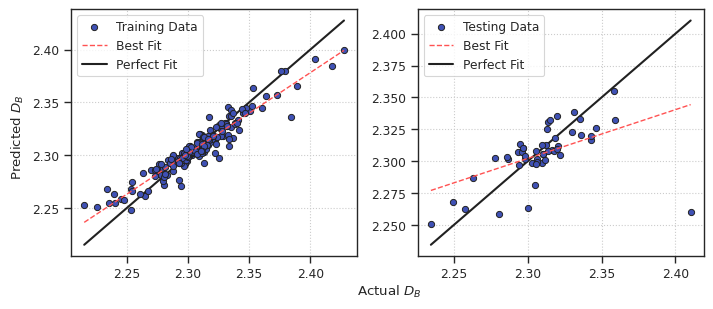

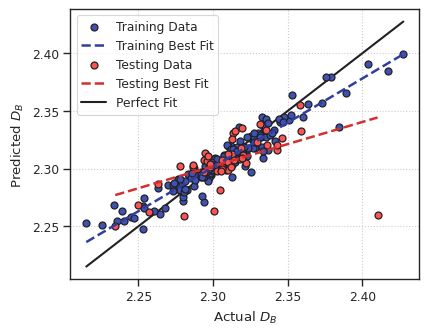

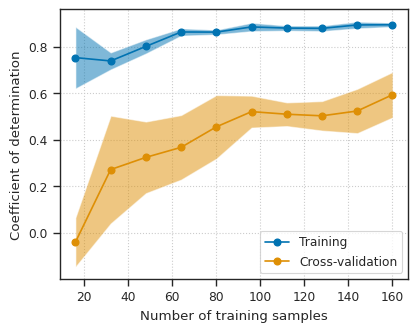

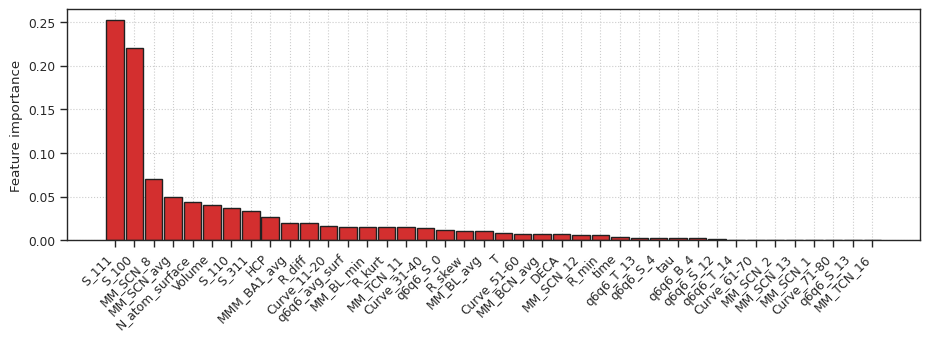

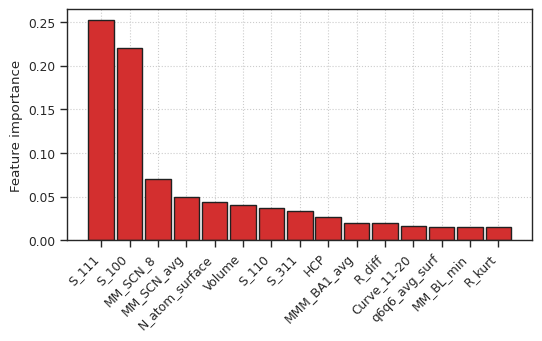

Removing the features with null values...
  Original number of features: 49
  Total number of features left: 49

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.748
    Cross-validation score: 0.348 +/- 0.242
    Testing score:
      Mean absolute error: 0.018036
      Mean squared error: 0.000644
      Root mean squared error: 0.025381
      Coefficient of determination: 0.336


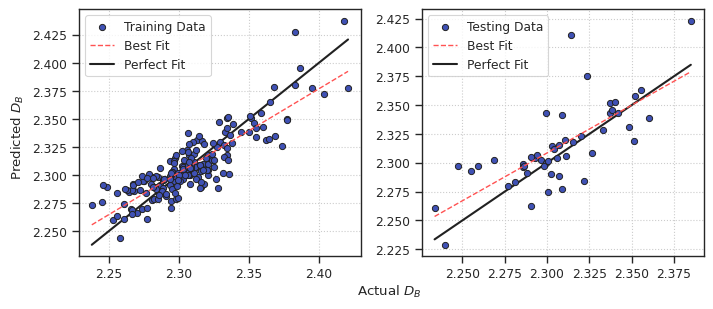

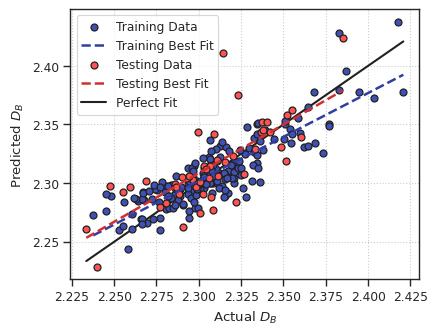

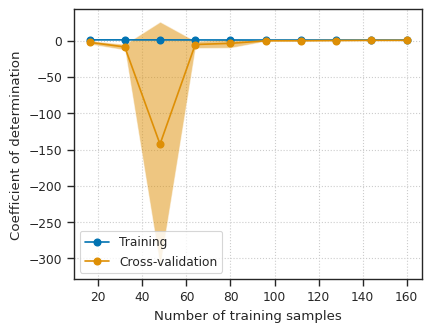

  Feature coefficients:
    MM_SCN_avg: 0.006
    S_100: 0.089
    S_111: 0.192
    S_110: 0.007
    S_311: 0.160
    R_diff: 0.059
    MM_BCN_avg: 0.025
    MM_BL_avg: 0.012
    MMM_BA1_avg: 0.045
    HCP: 0.027
    Curve_11-20: 0.152
    Curve_31-40: 0.258
    MM_SCN_14: 0.001
    q6q6_S_0: 0.079
    q6q6_S_3: 0.042
    q6q6_S_8: 0.140
    MM_TCN_14: 0.014
    q6q6_T_13: 0.029
    MM_BCN_7: 0.005
    MM_BCN_9: 0.033

Dataset: MNP
Best score: 0.700
Best parameter combination: {'criterion': 'poisson', 'max_depth': 6, 'max_features': 0.5880134849426635, 'max_leaf_nodes': 65, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 65}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.932
    Cross-validation score: 0.700 +/- 0.115
    Testing score:
      Mean absolute error: 0.014335
      Mean squared error: 0.000332
      Root mean squared error: 0.018222
      Coefficient of determination: 0.658


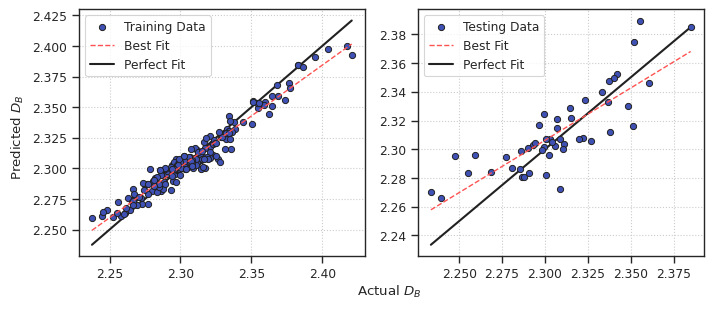

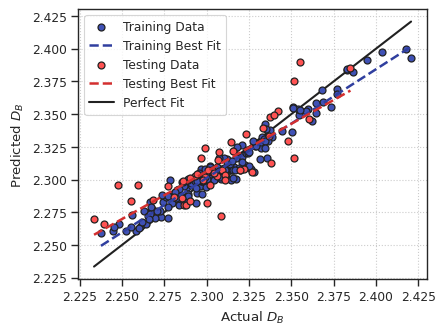

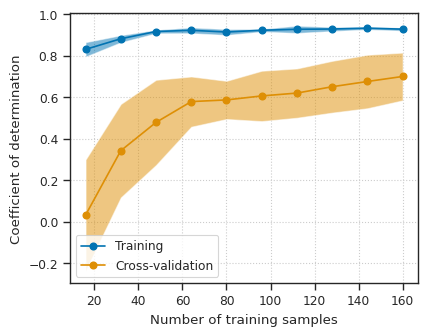

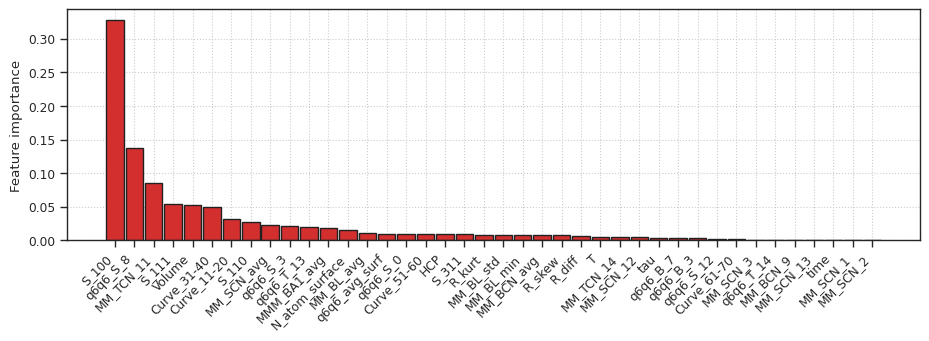

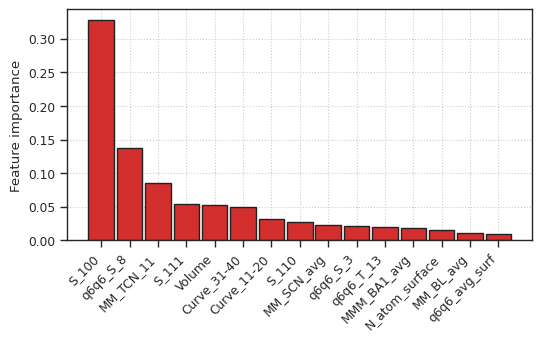

Removing the features with null values...
  Original number of features: 47
  Total number of features left: 47

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.625
    Cross-validation score: 0.116 +/- 0.357
    Testing score:
      Mean absolute error: 0.020606
      Mean squared error: 0.000645
      Root mean squared error: 0.025388
      Coefficient of determination: 0.334


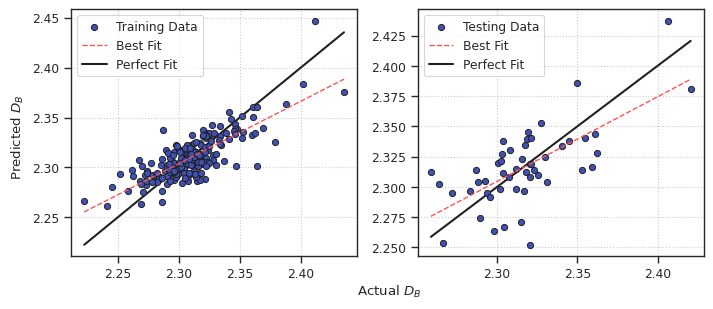

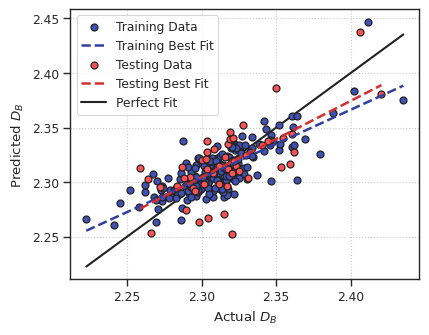

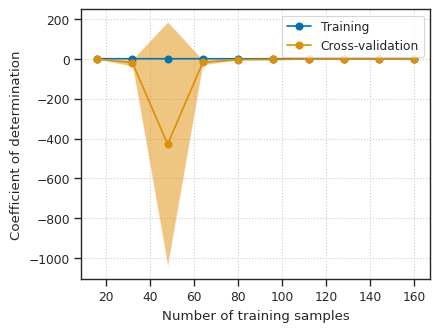

  Feature coefficients:
    time: 0.008
    S_100: 0.160
    S_111: 0.168
    S_110: 0.220
    S_311: 0.025
    R_skew: 0.018
    MM_BCN_avg: 0.051
    HCP: 0.104
    Curve_11-20: 0.032
    Curve_51-60: 0.004
    MM_SCN_2: 0.010
    MM_SCN_3: 0.017
    q6q6_S_3: 0.030
    q6q6_S_8: 0.025
    q6q6_S_12: 0.002
    q6q6_S_13: 0.026
    MM_TCN_11: 0.051
    MM_TCN_16: 0.004
    q6q6_T_11: 0.086
    q6q6_T_14: 0.010
    MM_BCN_7: 0.010
    MM_BCN_8: 0.007
    MM_BCN_9: 0.031

Dataset: MNP
Best score: 0.378
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 6, 'max_features': 0.4029438503745285, 'max_leaf_nodes': 14, 'min_samples_leaf': 5, 'min_samples_split': 11, 'n_estimators': 46}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.674
    Cross-validation score: 0.378 +/- 0.055
    Testing score:
      Mean absolute error: 0.016685
      Mean squared error: 0.000531
      Root mean squared error: 0.023046
      Coefficient of 

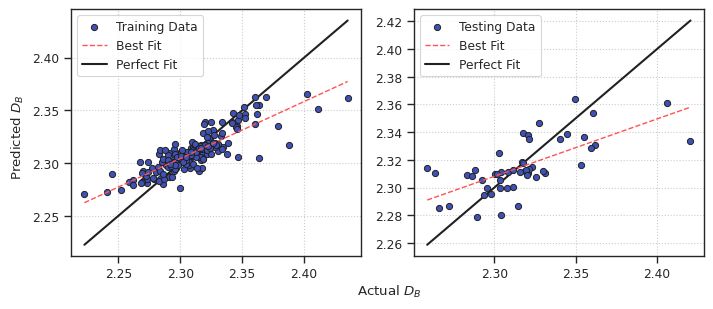

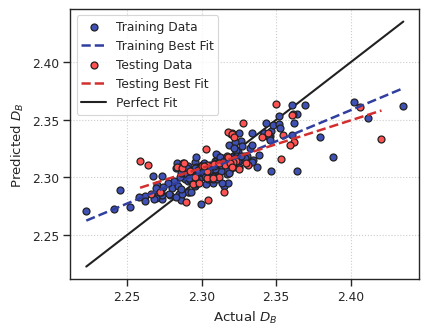

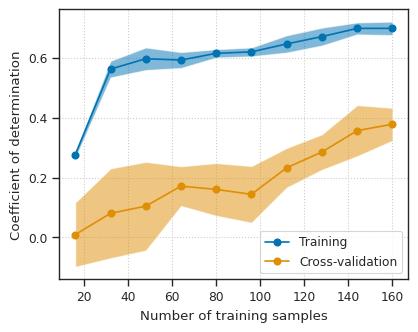

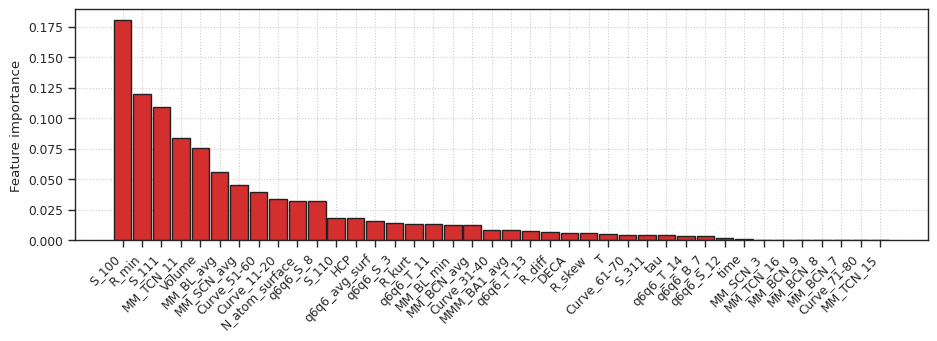

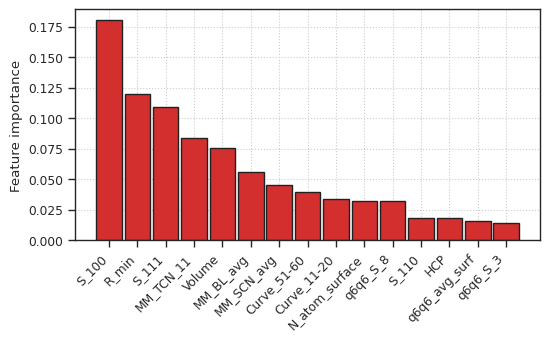

Removing the features with null values...
  Original number of features: 46
  Total number of features left: 46

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.665
    Cross-validation score: -1.040 +/- 2.383
    Testing score:
      Mean absolute error: 0.012632
      Mean squared error: 0.000297
      Root mean squared error: 0.017235
      Coefficient of determination: 0.319


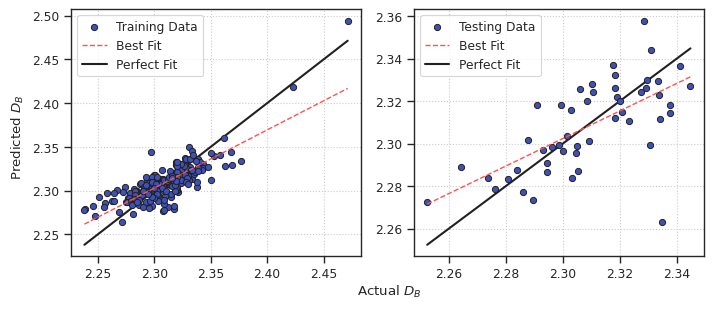

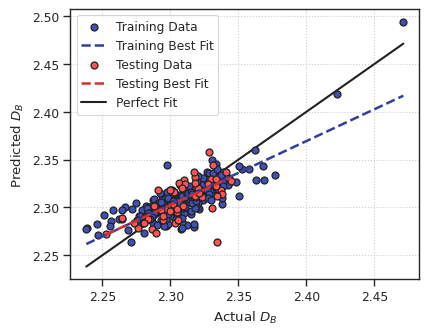

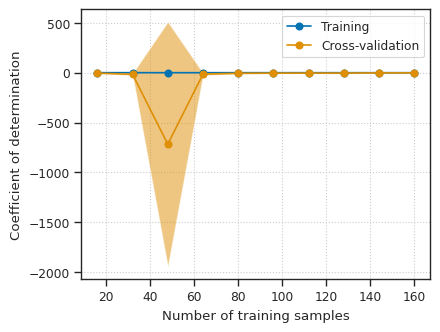

  Feature coefficients:
    T: 0.004
    MM_SCN_avg: 0.022
    q6q6_avg_surf: 0.013
    S_100: 0.422
    S_111: 0.147
    S_311: 0.035
    R_diff: 0.039
    MM_BCN_avg: 0.010
    MM_BL_avg: 0.002
    MMM_BA1_avg: 0.019
    HCP: 0.045
    ICOS: 0.002
    Curve_11-20: 0.345
    Curve_31-40: 0.178
    MM_SCN_1: 0.017
    MM_SCN_3: 0.020
    q6q6_S_12: 0.020
    q6q6_S_13: 0.004
    MM_TCN_16: 0.010
    MM_BCN_8: 0.042
    q6q6_B_7: 0.023

Dataset: MNP
Best score: 0.514
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 6, 'max_features': 0.8197468875683751, 'max_leaf_nodes': 43, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 56}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.883
    Cross-validation score: 0.514 +/- 0.089
    Testing score:
      Mean absolute error: 0.010907
      Mean squared error: 0.000218
      Root mean squared error: 0.014753
      Coefficient of determination: 0.501


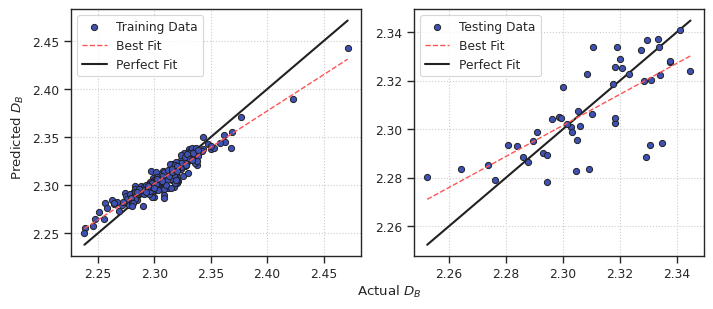

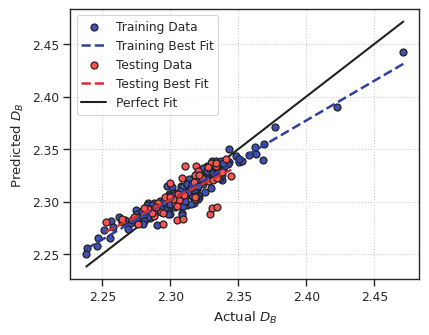

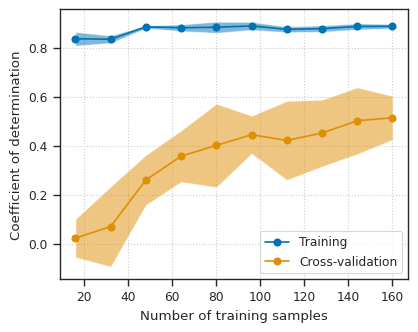

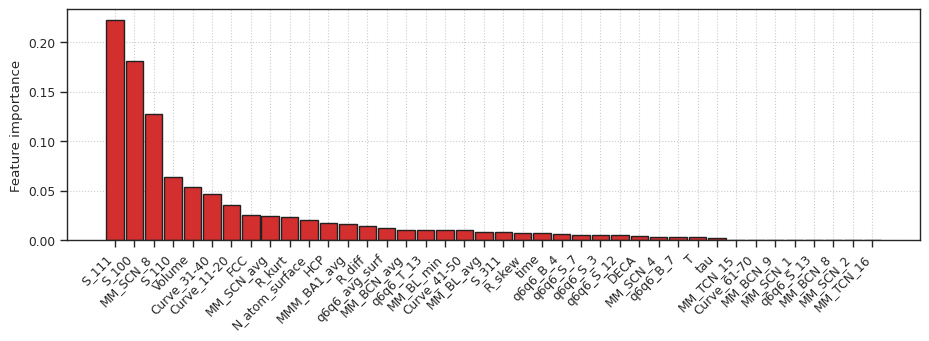

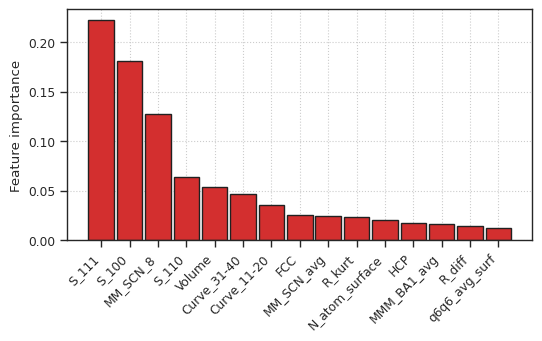

Removing the features with null values...
  Original number of features: 47
  Total number of features left: 47

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.718
    Cross-validation score: 0.386 +/- 0.170
    Testing score:
      Mean absolute error: 0.017829
      Mean squared error: 0.000521
      Root mean squared error: 0.022818
      Coefficient of determination: 0.295


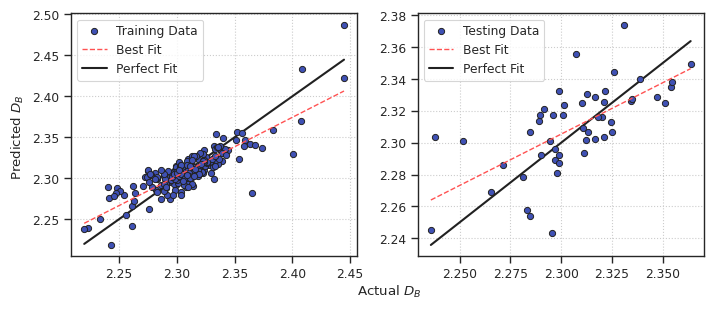

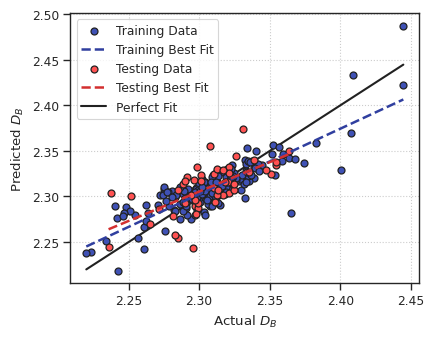

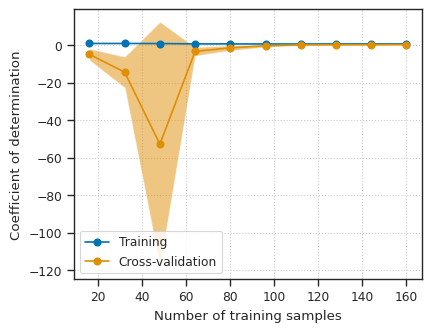

  Feature coefficients:
    T: 0.002
    time: 0.007
    S_100: 0.110
    S_111: 0.031
    S_110: 0.211
    S_311: 0.059
    N_atom_surface: 0.057
    R_skew: 0.001
    R_kurt: 0.004
    MM_BCN_avg: 0.053
    MM_BL_min: 0.044
    MMM_BA1_avg: 0.028
    HCP: 0.039
    ICOS: 0.010
    DECA: 0.011
    Curve_11-20: 0.135
    MM_SCN_2: 0.008
    MM_SCN_3: 0.041
    MM_SCN_8: 0.025
    q6q6_S_3: 0.004
    q6q6_S_12: 0.006
    q6q6_S_13: 0.006
    MM_TCN_16: 0.011
    q6q6_T_14: 0.057
    MM_BCN_8: 0.014
    q6q6_B_7: 0.036

Dataset: MNP
Best score: 0.633
Best parameter combination: {'criterion': 'poisson', 'max_depth': 7, 'max_features': 0.7424042093697933, 'max_leaf_nodes': 36, 'min_samples_leaf': 3, 'min_samples_split': 7, 'n_estimators': 99}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.871
    Cross-validation score: 0.633 +/- 0.065
    Testing score:
      Mean absolute error: 0.012985
      Mean squared error: 0.000288
      Root mean squa

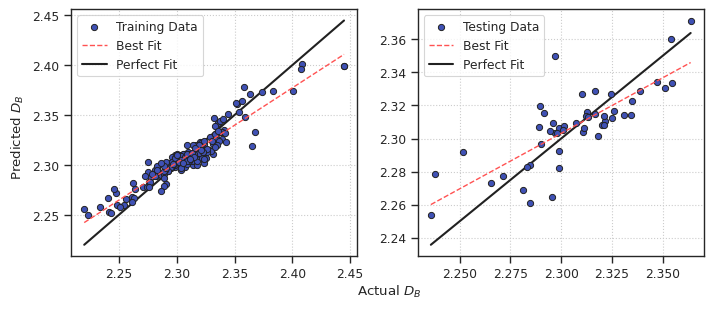

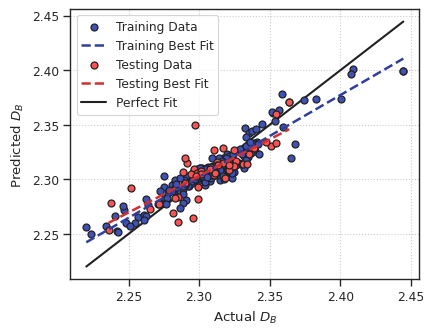

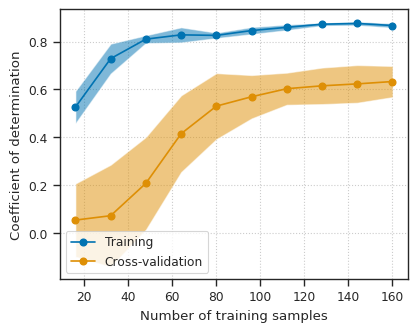

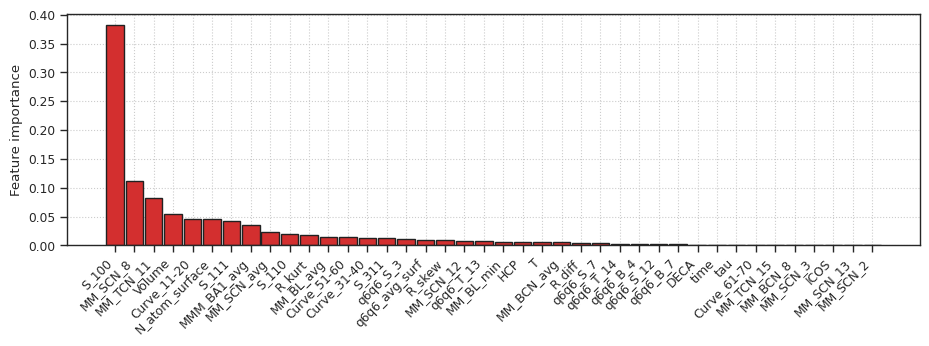

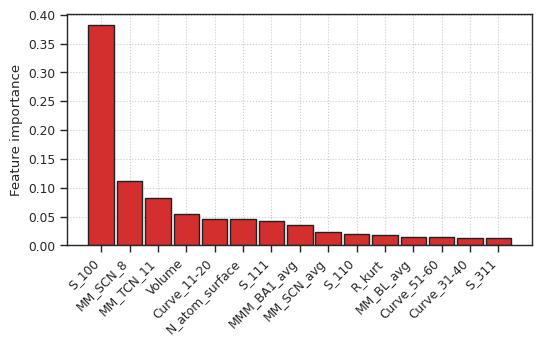

Removing the features with null values...
  Original number of features: 47
  Total number of features left: 47

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.612
    Cross-validation score: -0.603 +/- 1.360
    Testing score:
      Mean absolute error: 0.017443
      Mean squared error: 0.000492
      Root mean squared error: 0.022171
      Coefficient of determination: 0.566


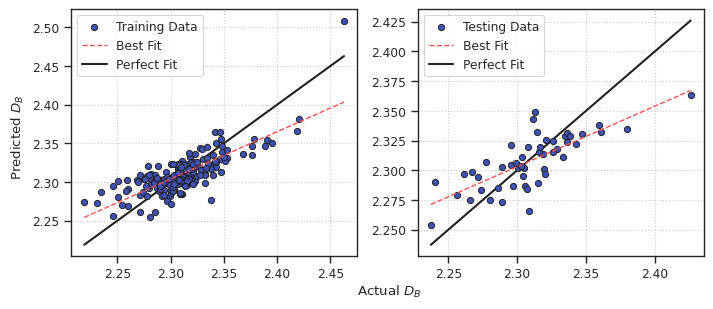

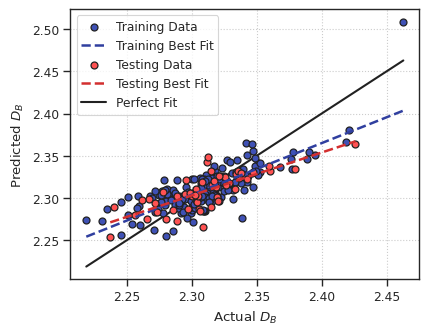

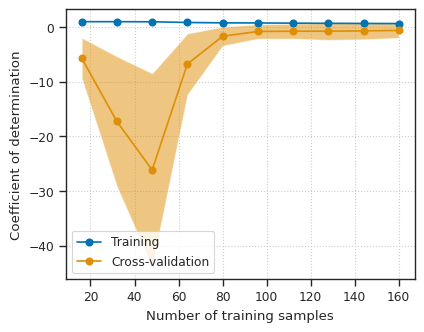

  Feature coefficients:
    T: 0.010
    q6q6_avg_surf: 0.057
    S_100: 0.014
    S_111: 0.089
    S_110: 0.181
    S_311: 0.131
    N_atom_surface: 0.058
    MM_BCN_avg: 0.061
    MM_BL_min: 0.033
    HCP: 0.022
    ICOS: 0.002
    Curve_11-20: 0.232
    Curve_31-40: 0.027
    Curve_71-80: 0.043
    MM_SCN_1: 0.039
    MM_SCN_3: 0.018
    MM_SCN_8: 0.152
    q6q6_S_13: 0.010
    MM_TCN_16: 0.013
    q6q6_T_14: 0.024
    MM_BCN_6: 0.041
    MM_BCN_7: 0.003
    MM_BCN_8: 0.008

Dataset: MNP
Best score: 0.522
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 9, 'max_features': 0.6149106673499857, 'max_leaf_nodes': 23, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 82}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.900
    Cross-validation score: 0.522 +/- 0.136
    Testing score:
      Mean absolute error: 0.015169
      Mean squared error: 0.000431
      Root mean squared error: 0.020757
      Coefficien

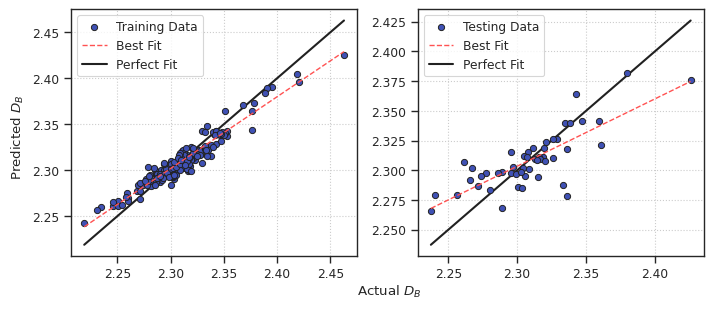

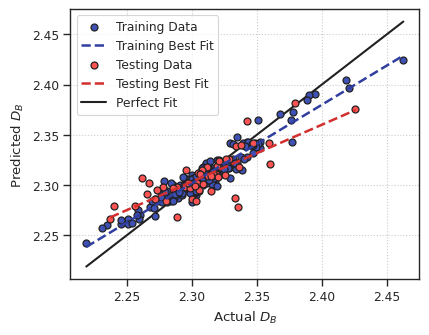

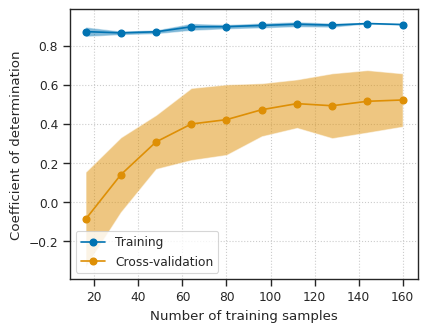

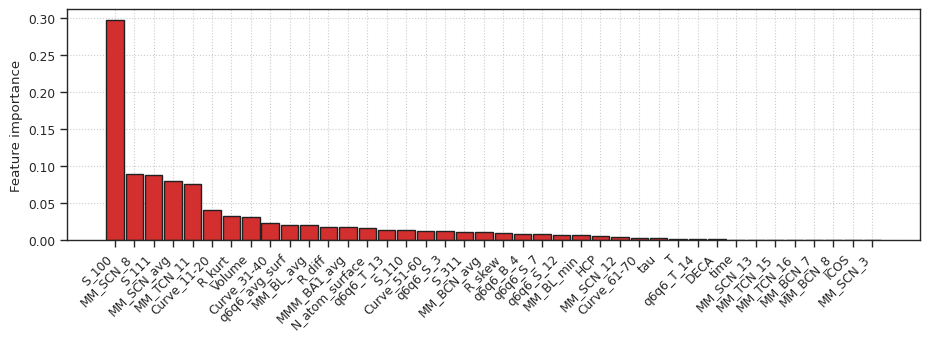

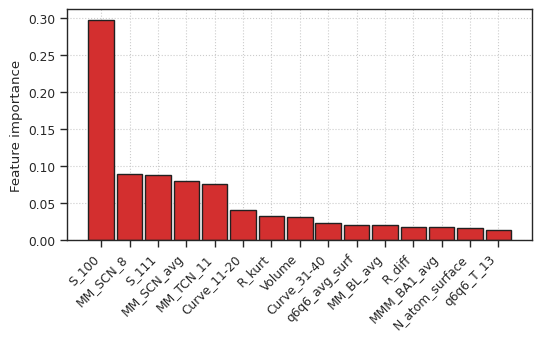

Removing the features with null values...
  Original number of features: 48
  Total number of features left: 48

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.649
    Cross-validation score: 0.035 +/- 0.208
    Testing score:
      Mean absolute error: 0.017324
      Mean squared error: 0.000474
      Root mean squared error: 0.021768
      Coefficient of determination: 0.575


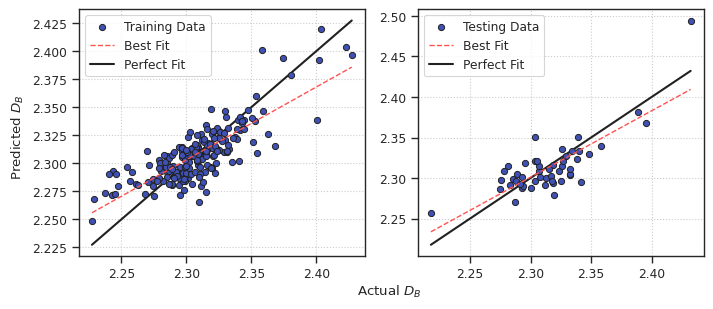

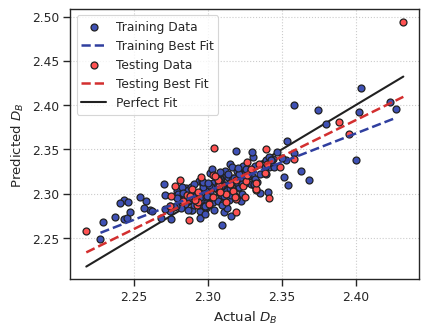

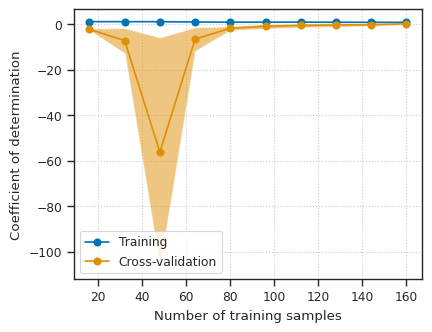

  Feature coefficients:
    T: 0.001
    time: 0.003
    q6q6_avg_surf: 0.012
    S_100: 0.104
    S_111: 0.134
    S_110: 0.162
    S_311: 0.028
    R_diff: 0.031
    R_skew: 0.029
    MM_BCN_avg: 0.047
    MM_BL_avg: 0.003
    MM_BL_min: 0.010
    FCC: 0.018
    HCP: 0.045
    Curve_11-20: 0.271
    Curve_31-40: 0.049
    Curve_71-80: 0.001
    MM_SCN_1: 0.013
    MM_SCN_3: 0.032
    MM_SCN_14: 0.014
    q6q6_S_3: 0.003
    q6q6_S_6: 0.082
    q6q6_S_8: 0.061
    MM_TCN_16: 0.003
    MM_BCN_7: 0.010
    MM_BCN_8: 0.003

Dataset: MNP
Best score: 0.483
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 7, 'max_features': 0.3386876832971462, 'max_leaf_nodes': 84, 'min_samples_leaf': 1, 'min_samples_split': 13, 'n_estimators': 26}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.781
    Cross-validation score: 0.483 +/- 0.126
    Testing score:
      Mean absolute error: 0.014445
      Mean squared error: 0.000342
      Root

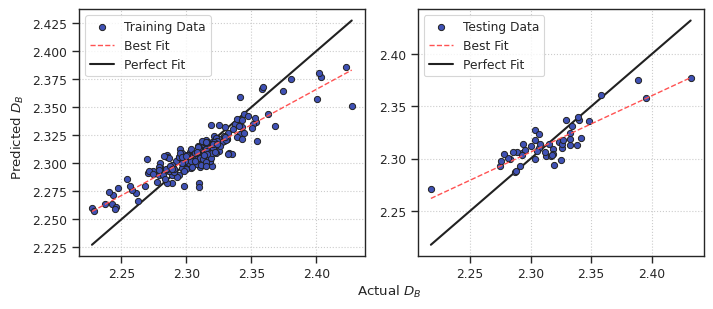

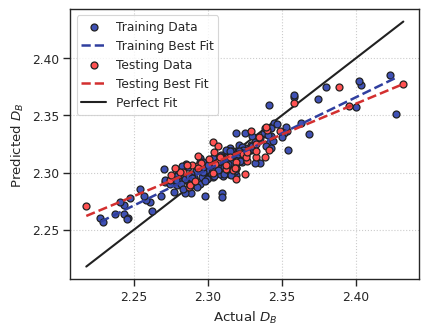

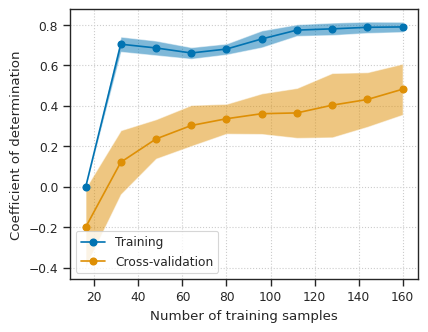

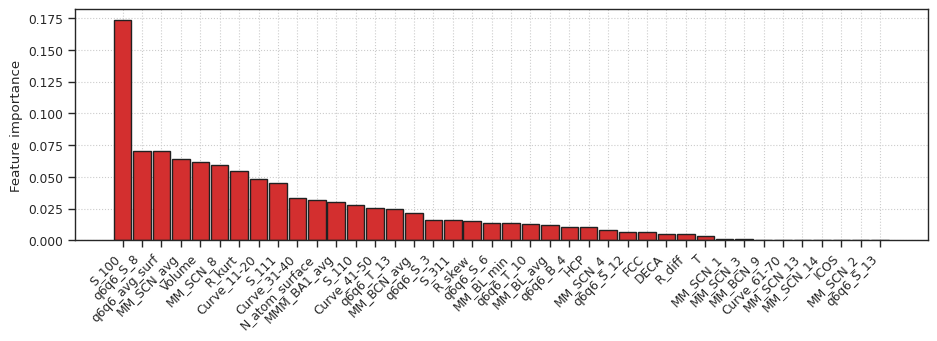

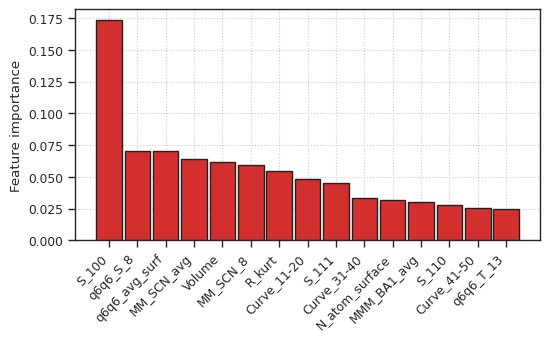

Removing the features with null values...
  Original number of features: 52
  Total number of features left: 52

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.764
    Cross-validation score: 0.327 +/- 0.305
    Testing score:
      Mean absolute error: 0.020787
      Mean squared error: 0.000759
      Root mean squared error: 0.027547
      Coefficient of determination: 0.483


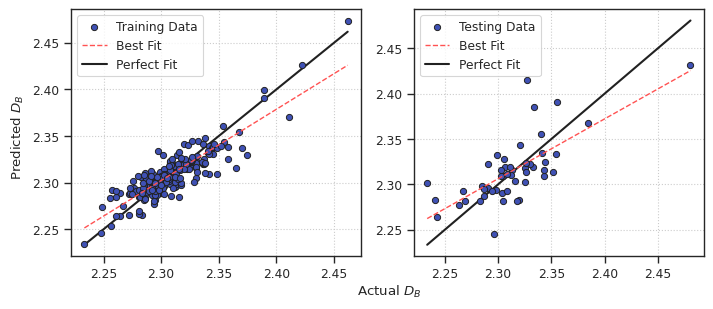

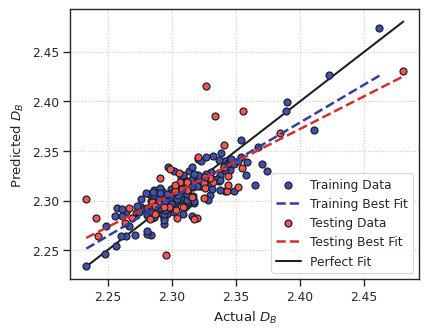

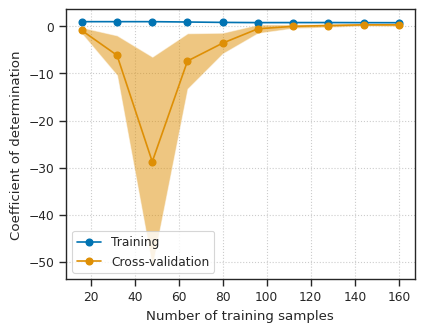

  Feature coefficients:
    T: 0.049
    time: 0.004
    MM_SCN_avg: 0.027
    q6q6_avg_surf: 0.013
    S_100: 0.015
    N_atom_surface: 0.223
    R_diff: 0.045
    R_min: 0.042
    MM_BCN_avg: 0.051
    MM_BL_avg: 0.024
    MM_BL_min: 0.004
    HCP: 0.073
    ICOS: 0.008
    Curve_11-20: 0.033
    MM_SCN_2: 0.002
    MM_SCN_3: 0.032
    MM_SCN_13: 0.031
    q6q6_S_12: 0.007
    MM_TCN_11: 0.003
    MM_TCN_14: 0.040
    MM_TCN_16: 0.013
    q6q6_T_13: 0.025
    MM_BCN_8: 0.042
    q6q6_B_3: 0.010
    q6q6_B_11: 0.009

Dataset: MNP
Best score: 0.559
Best parameter combination: {'criterion': 'poisson', 'max_depth': 7, 'max_features': 0.7560452800946414, 'max_leaf_nodes': 82, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 19}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.887
    Cross-validation score: 0.559 +/- 0.116
    Testing score:
      Mean absolute error: 0.014018
      Mean squared error: 0.000383
      Root mean squa

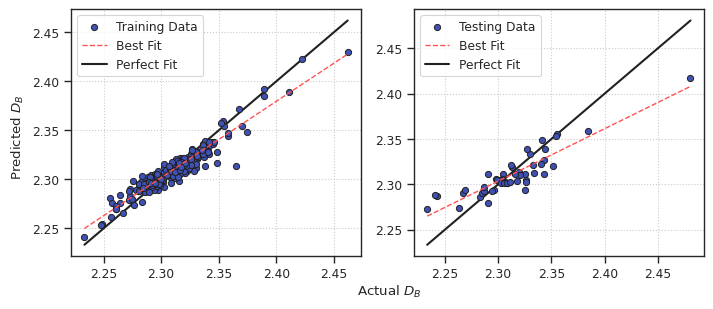

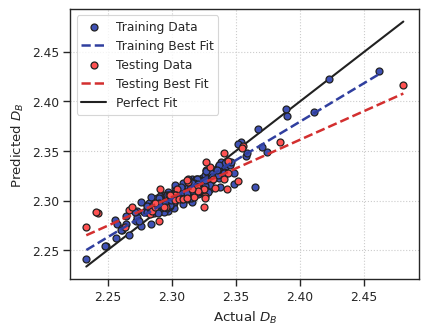

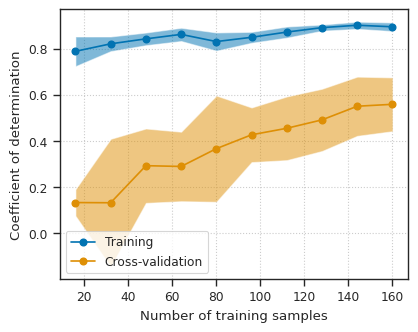

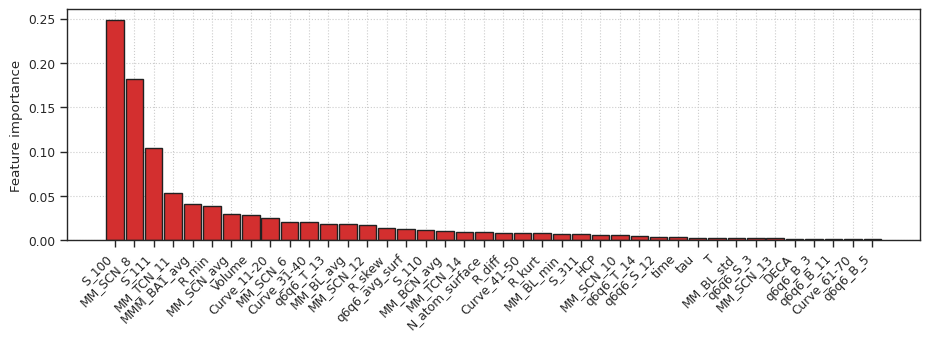

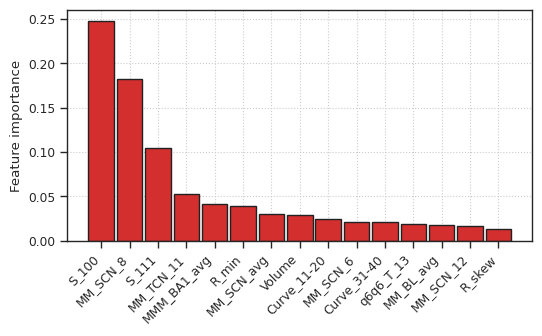

Removing the features with null values...
  Original number of features: 49
  Total number of features left: 49

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.693
    Cross-validation score: 0.262 +/- 0.099
    Testing score:
      Mean absolute error: 0.017368
      Mean squared error: 0.000598
      Root mean squared error: 0.024444
      Coefficient of determination: 0.460


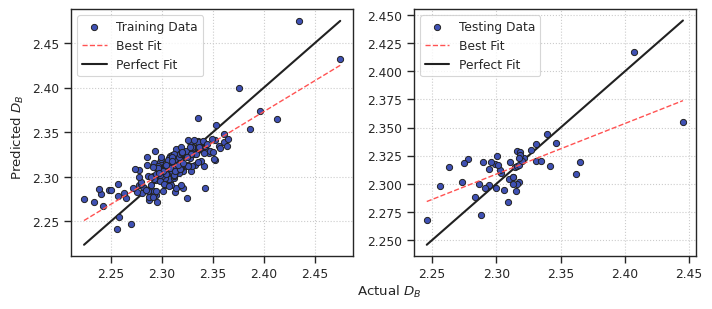

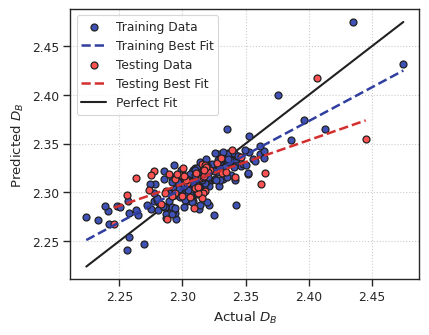

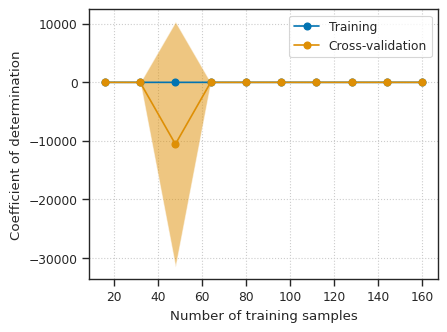

  Feature coefficients:
    T: 0.002
    MM_SCN_avg: 0.025
    q6q6_avg_surf: 0.034
    S_100: 0.137
    S_110: 0.199
    S_311: 0.117
    N_atom_surface: 0.258
    R_kurt: 0.006
    MM_BCN_avg: 0.010
    MM_BL_min: 0.011
    DECA: 0.009
    Curve_11-20: 0.099
    Curve_61-70: 0.018
    Curve_71-80: 0.014
    MM_SCN_1: 0.007
    MM_SCN_2: 0.004
    MM_SCN_13: 0.016
    q6q6_S_3: 0.005
    q6q6_S_12: 0.009
    q6q6_S_13: 0.003
    MM_TCN_11: 0.064
    MM_TCN_16: 0.002
    MM_BCN_7: 0.020
    MM_BCN_8: 0.005
    q6q6_B_7: 0.020

Dataset: MNP
Best score: 0.482
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 7, 'max_features': 0.7757839610123476, 'max_leaf_nodes': 93, 'min_samples_leaf': 3, 'min_samples_split': 10, 'n_estimators': 32}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.767
    Cross-validation score: 0.482 +/- 0.158
    Testing score:
      Mean absolute error: 0.017876
      Mean squared error: 0.000600
    

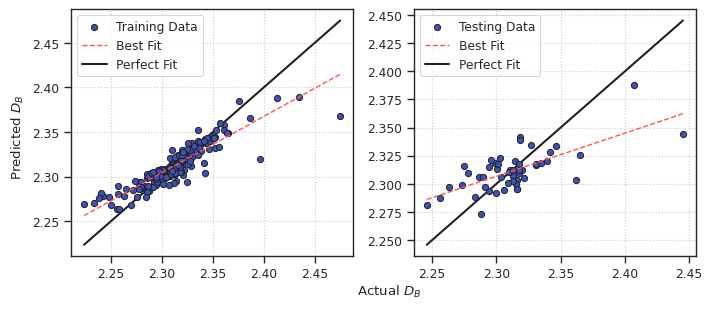

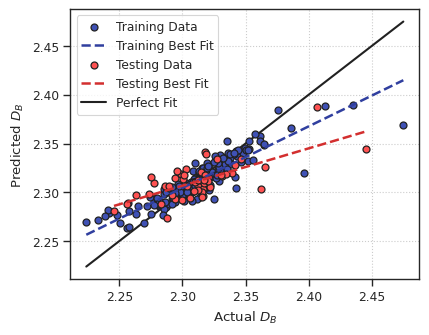

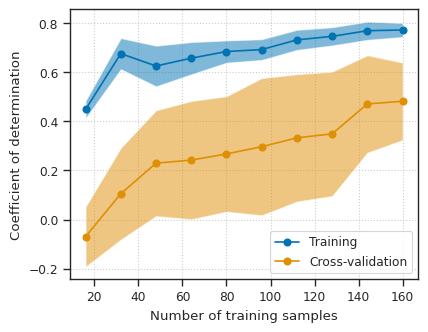

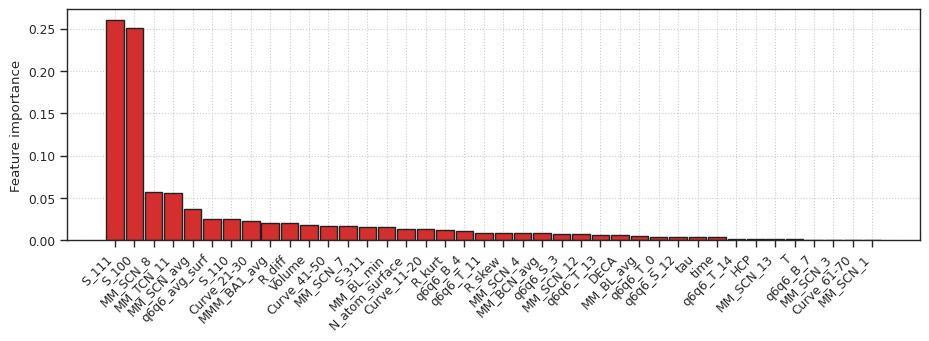

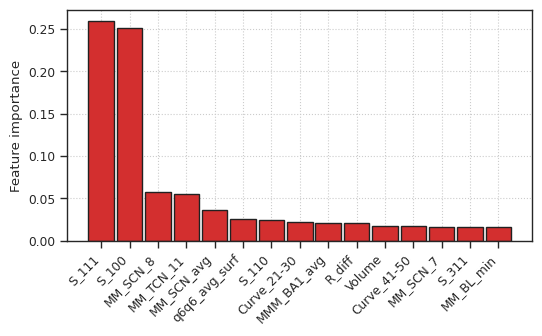

Removing the features with null values...
  Original number of features: 46
  Total number of features left: 46

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.727
    Cross-validation score: -0.426 +/- 1.185
    Testing score:
      Mean absolute error: 0.017337
      Mean squared error: 0.000560
      Root mean squared error: 0.023670
      Coefficient of determination: -0.004


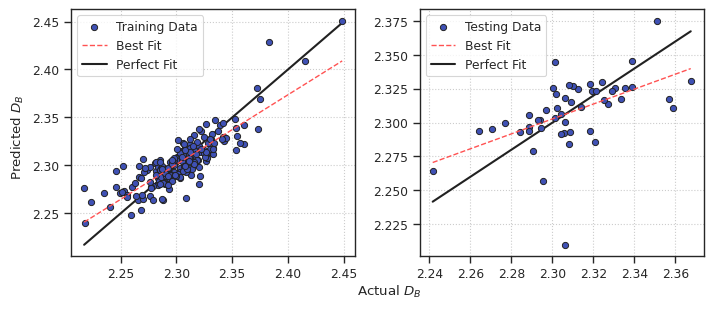

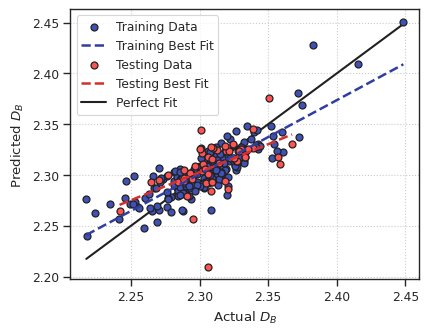

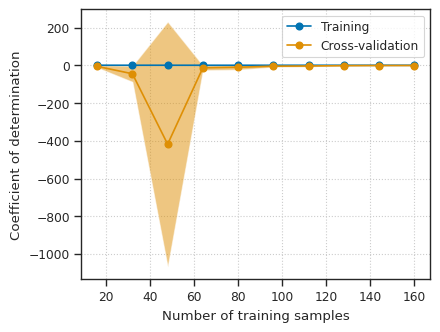

  Feature coefficients:
    T: 0.008
    q6q6_avg_surf: 0.037
    S_111: 0.068
    S_110: 0.109
    N_atom_surface: 0.086
    R_kurt: 0.011
    MM_BCN_avg: 0.010
    MM_BL_avg: 0.007
    MM_BL_min: 0.006
    ICOS: 0.001
    DECA: 0.043
    Curve_11-20: 0.148
    MM_SCN_1: 0.005
    MM_SCN_2: 0.025
    MM_SCN_8: 0.219
    MM_SCN_12: 0.003
    MM_SCN_14: 0.002
    q6q6_S_13: 0.039
    MM_TCN_16: 0.009
    q6q6_T_14: 0.013
    q6q6_B_9: 0.042

Dataset: MNP
Best score: 0.637
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 7, 'max_features': 0.5092658700704732, 'max_leaf_nodes': 47, 'min_samples_leaf': 2, 'min_samples_split': 13, 'n_estimators': 40}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.863
    Cross-validation score: 0.637 +/- 0.056
    Testing score:
      Mean absolute error: 0.011545
      Mean squared error: 0.000255
      Root mean squared error: 0.015984
      Coefficient of determination: 0.542


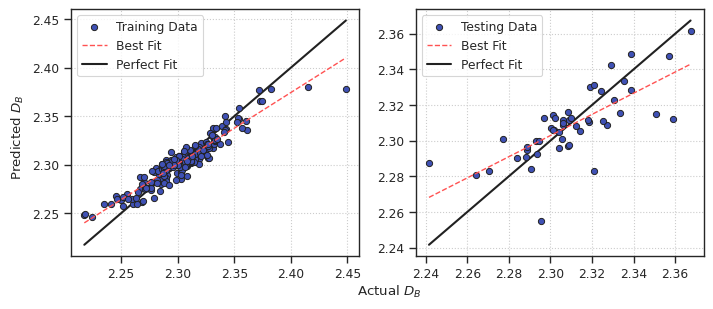

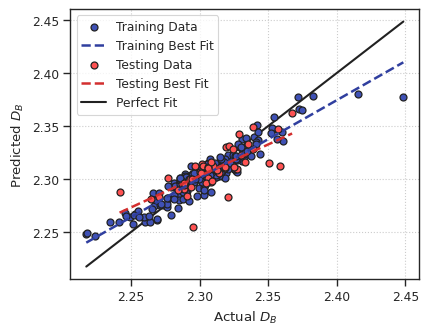

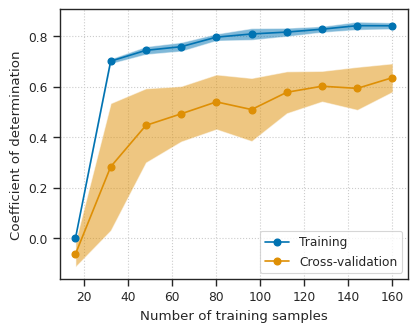

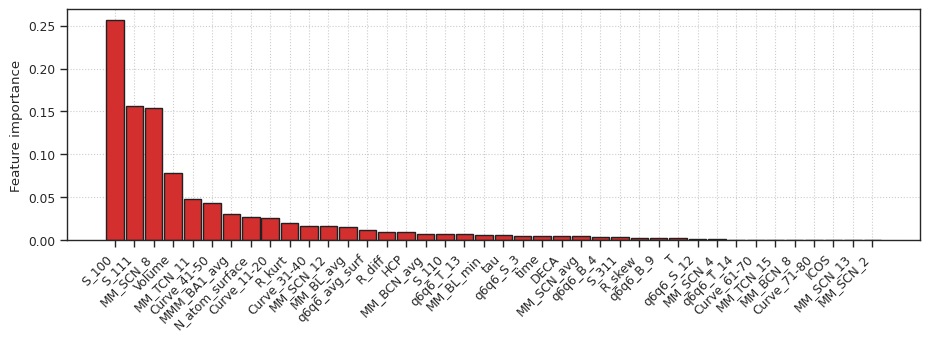

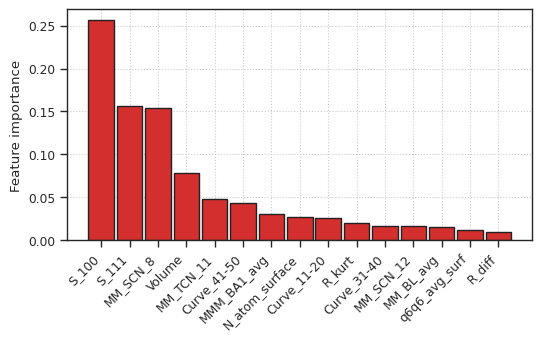

In [16]:
CORR_THRESH = 0.8

for i in range(NUM_RUNS):
    FIG_NAME_APPENDIX = f"minmax_random_{i}"
    # Data loading
    MNPDF = pd.read_pickle(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}_250.pickle")
    
    MNPNoNullDF = rmNullFeats(featsDF=MNPDF, verbose=VERBOSE)
    
    XtrainMNP, XtestMNP, yTrainMNP, yTestMNP = splitScaleData(df=MNPDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull = splitScaleData(df=MNPNoNullDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    
    X_Y_MNPS = {'WithNull': {'MNP': (XtrainMNP, XtestMNP, yTrainMNP, yTestMNP)}, 
                'NoNull': {'MNP': (XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull)}}

    # Linear Regression
    hasMissingVals, modelName = 'NoNull', 'LRR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
        
        linReg = LinearRegression(positive=False, fit_intercept=True, 
                                  copy_X=True, n_jobs=NUM_JOBS)  # No speedup from n_jobs here as n_target=1 and positive=False
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        yPredTrainLinR, yPredTestLinR, linReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                         model=linReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                         numFeat=20, isReg=True, showFeatCoef=True, plotFeatImp=False, verbose=True, showFig=True)

    # Random Forest
    hasMissingVals, modelName = 'WithNull', 'RFR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        # if exists(f"{DATA_DIR}/hpTune{mnp}{modelName}.pickle"):
        #     print('Already done, skipping...')
        #     continue
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
    
        rfReg = RandomForestRegressor(n_estimators=40, criterion='squared_error', max_depth=None, 
                                      max_features=1.0, max_leaf_nodes=None, min_samples_split=2, min_samples_leaf=1, 
                                      min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0, n_jobs=NUM_JOBS, random_state=RANDOM_SEED, verbose=0, 
                                      bootstrap=True, oob_score=False, warm_start=False, ccp_alpha=0.0, max_samples=None, monotonic_cst=None)
        paramGrid = {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'], 
                     'n_estimators': stats.randint(low=3, high=100), 
                     'max_depth' : stats.randint(low=1, high=10), 
                     'max_features': stats.uniform(loc=0.1, scale=0.9), 
                     'max_leaf_nodes': stats.randint(low=5, high=100),
                     'min_samples_split': stats.randint(low=2, high=20), 
                     'min_samples_leaf': stats.randint(low=1, high=10)}
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        searchResults = hyperparamTune(rfReg, paramGrid, Xtrain, yTrain, scoringMetric='r2', cv=cv, numIter=1000)
        with open(f"{DATA_DIR}/hpTune{mnp}{modelName}run{i}.pickle", 'wb') as f:
            pickle.dump(searchResults, f)
    
        rfReg = searchResults.best_estimator_
        yPredTrainRFR, yPredTestRFR, rfReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                      model=rfReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                      numFeat=15, showFeatCoef=False, plotFeatImp=True, verbose=True, showFig=True)
        # # Note: Set 'showFig' to False for cluster jobs!

Removing the features with null values...
  Original number of features: 46
  Total number of features left: 46

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.987
    Cross-validation score: 0.951 +/- 0.010
    Testing score:
      Mean absolute error: 1982.424217
      Mean squared error: 7209740.650090
      Root mean squared error: 2685.096023
      Coefficient of determination: 0.959


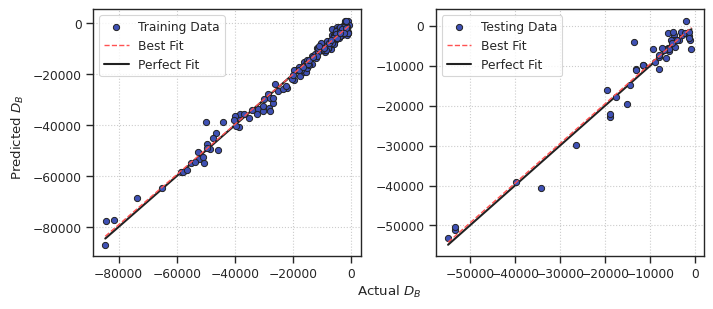

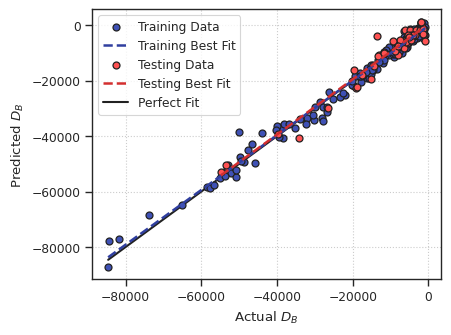

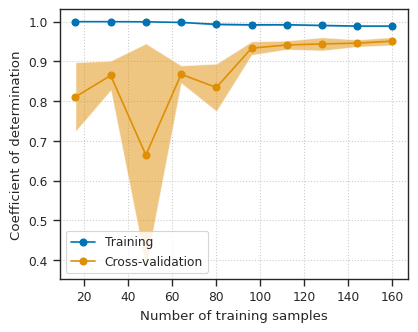

  Feature coefficients:
    time: 2633.438
    MM_SCN_avg: 509.981
    q6q6_avg_surf: 1575.331
    S_110: 11722.984
    R_diff: 3236.403
    R_skew: 7004.368
    ICOS: 1962.282
    Curve_51-60: 3046.845
    Curve_61-70: 1419.013
    Curve_71-80: 977.033
    q6q6_S_0: 21256.370
    q6q6_S_12: 4204.362
    q6q6_T_13: 6783.272
    MM_BCN_7: 5545.993
    MM_BCN_8: 9864.875
    MM_BCN_9: 13343.253
    q6q6_B_4: 8993.759

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.960
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 6, 'max_features': 0.3696091101584865, 'max_leaf_nodes': 44, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 18}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.991
    Cross-validation score: 0.960 +/- 0.010
    Testing score:
      Mean absolute error: 1068.047242
      Mean squared error: 2655130.399840
      Root mean squared error: 1629.457087
      Coefficient of determination: 0.985


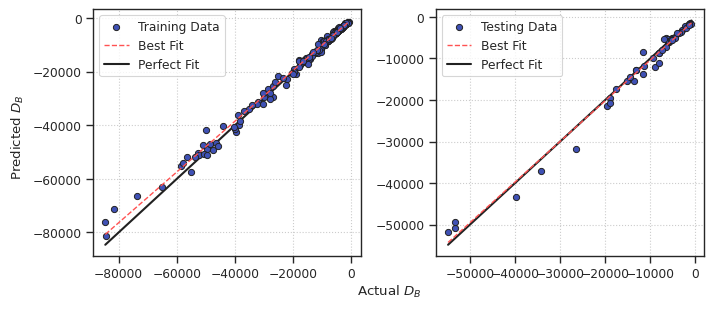

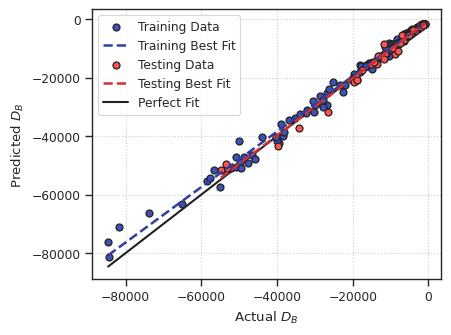

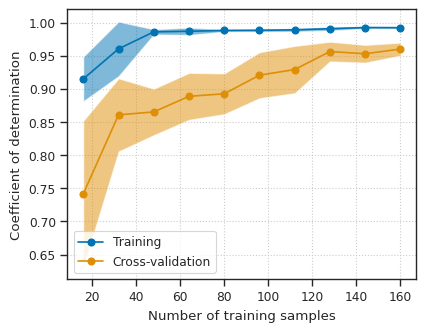

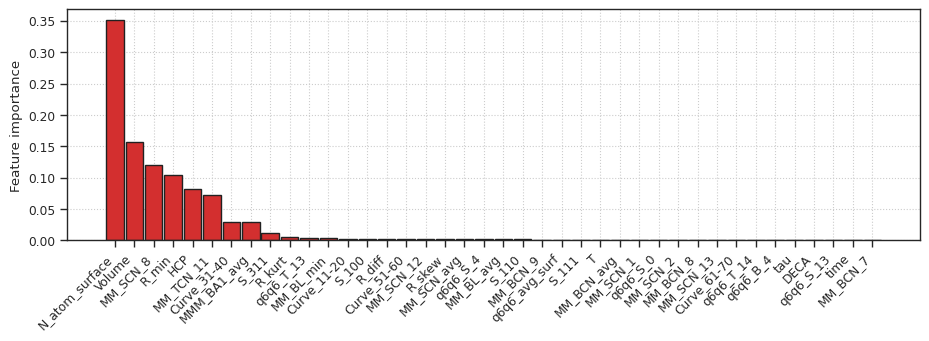

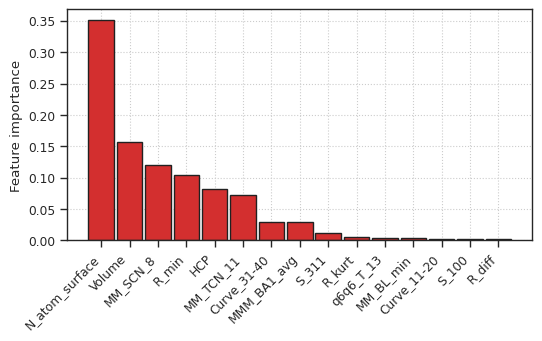

Removing the features with null values...
  Original number of features: 49
  Total number of features left: 49

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.989
    Cross-validation score: 0.941 +/- 0.020
    Testing score:
      Mean absolute error: 2081.154858
      Mean squared error: 17682538.307387
      Root mean squared error: 4205.061035
      Coefficient of determination: 0.934


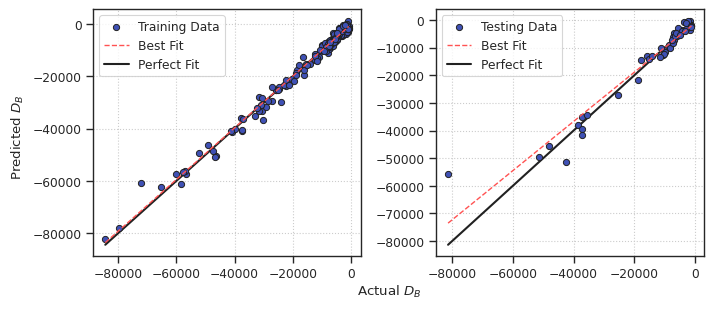

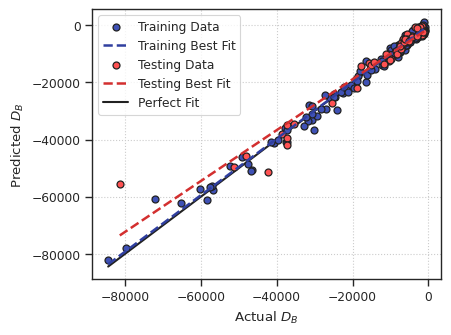

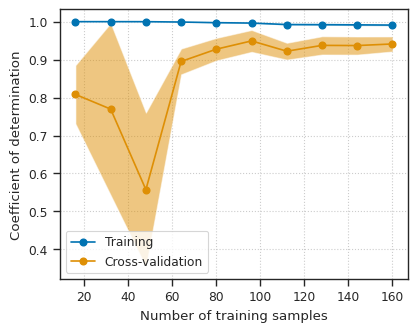

  Feature coefficients:
    time: 435.294
    q6q6_avg_surf: 5682.727
    S_110: 14915.167
    R_diff: 12234.002
    MM_BL_std: 19711.017
    MMM_BA1_avg: 10682.223
    Curve_11-20: 9115.513
    Curve_51-60: 5586.312
    MM_SCN_1: 119.448
    MM_SCN_13: 495.635
    MM_SCN_14: 221.918
    q6q6_S_0: 14486.319
    q6q6_S_8: 6122.433
    q6q6_S_12: 2643.447
    q6q6_T_13: 3969.510
    MM_BCN_7: 1621.498
    MM_BCN_8: 2031.333
    MM_BCN_9: 668.746
    q6q6_B_3: 3977.629

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.943
Best parameter combination: {'criterion': 'absolute_error', 'max_depth': 9, 'max_features': 0.5780525752009288, 'max_leaf_nodes': 24, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 72}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.989
    Cross-validation score: 0.943 +/- 0.024
    Testing score:
      Mean absolute error: 1828.428927
      Mean squared error: 11670440.218193
      Root mean squared error: 3416.202602
      Coefficient of determination: 0.956


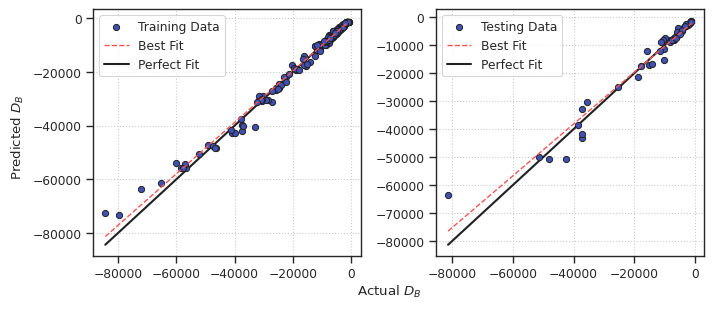

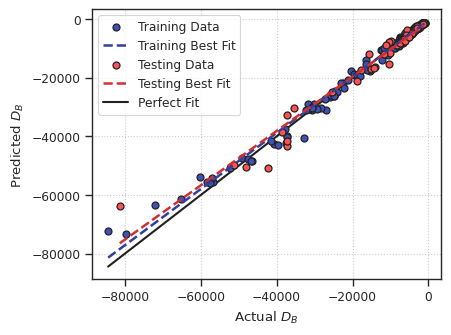

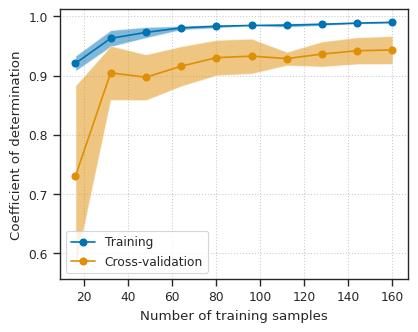

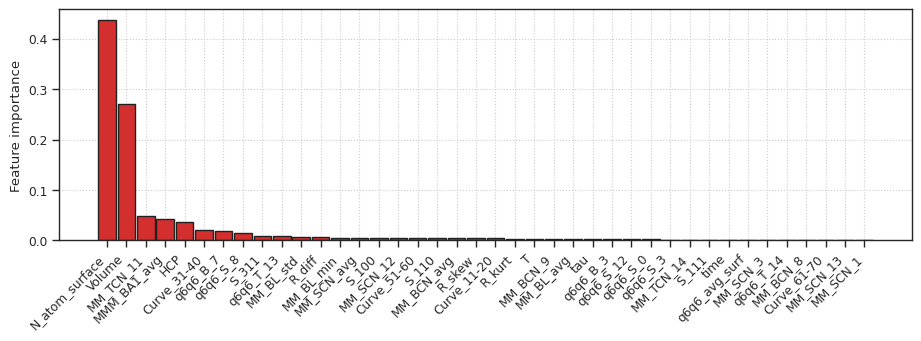

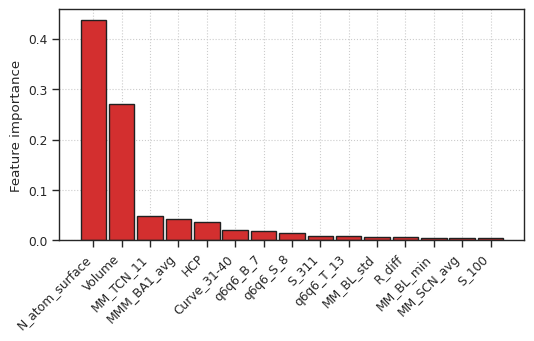

Removing the features with null values...
  Original number of features: 47
  Total number of features left: 47

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.991
    Cross-validation score: 0.956 +/- 0.024
    Testing score:
      Mean absolute error: 1761.314032
      Mean squared error: 10632043.304998
      Root mean squared error: 3260.681417
      Coefficient of determination: 0.945


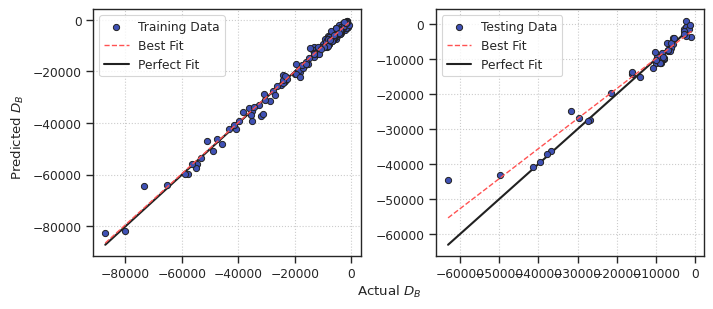

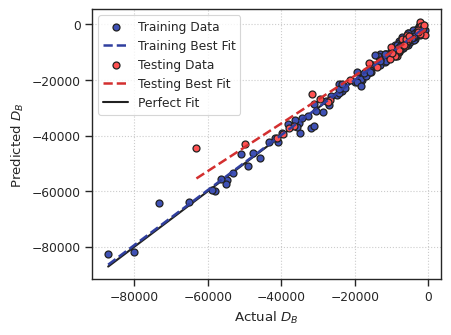

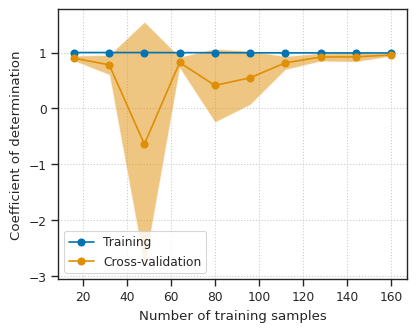

  Feature coefficients:
    time: 2431.362
    q6q6_avg_surf: 2127.289
    S_110: 19438.393
    R_diff: 6780.642
    R_min: 3275.146
    R_kurt: 664.942
    Curve_11-20: 12403.491
    Curve_51-60: 1988.450
    MM_SCN_3: 1937.623
    q6q6_S_3: 10417.082
    q6q6_S_12: 2399.408
    MM_TCN_15: 629.225
    MM_TCN_16: 431.362
    q6q6_T_13: 5152.505
    MM_BCN_8: 5456.766
    MM_BCN_9: 5158.615

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.961
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 6, 'max_features': 0.2932262987170199, 'max_leaf_nodes': 77, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 62}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.992
    Cross-validation score: 0.961 +/- 0.013
    Testing score:
      Mean absolute error: 2091.425377
      Mean squared error: 21980071.329856
      Root mean squared error: 4688.290875
      Coefficient of determination: 0.885


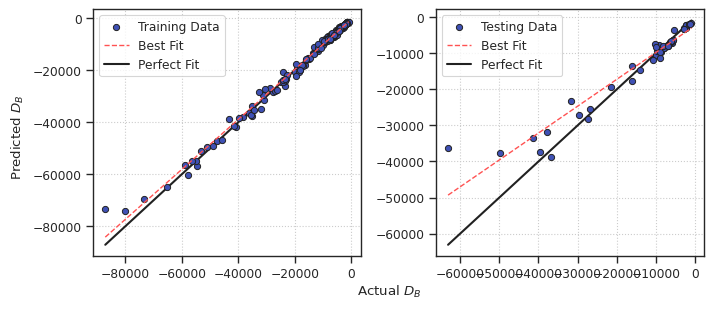

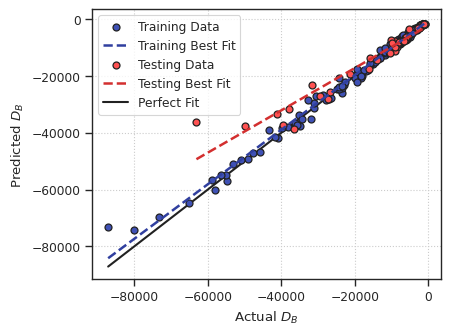

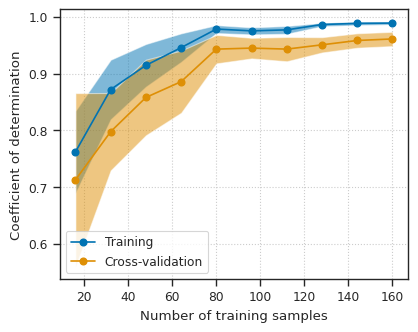

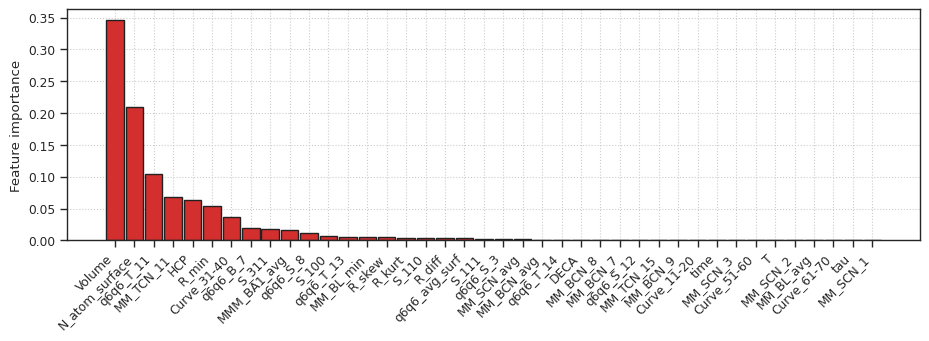

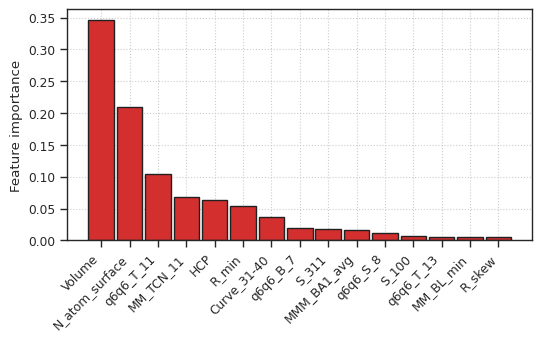

Removing the features with null values...
  Original number of features: 46
  Total number of features left: 46

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.993
    Cross-validation score: 0.954 +/- 0.028
    Testing score:
      Mean absolute error: 1157.611387
      Mean squared error: 2868867.859280
      Root mean squared error: 1693.773261
      Coefficient of determination: 0.983


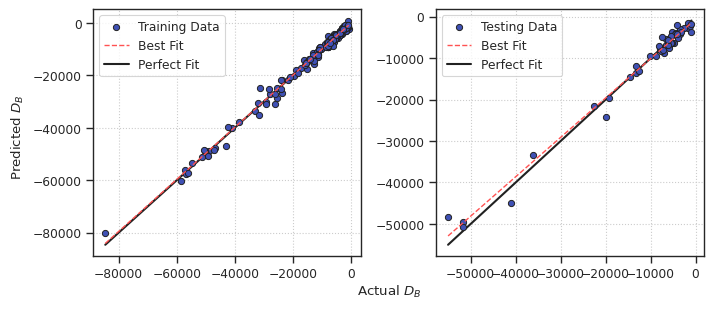

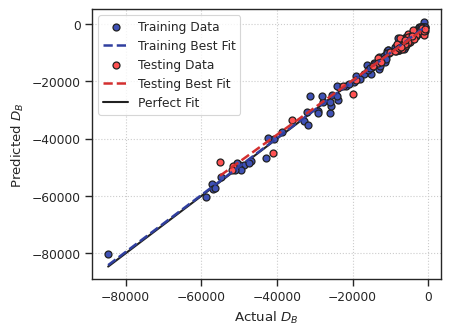

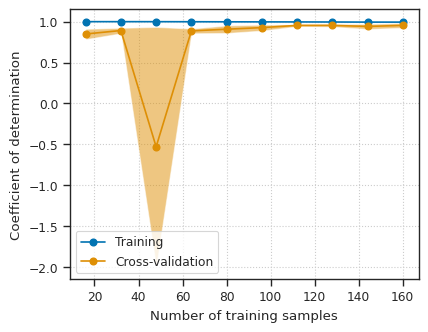

  Feature coefficients:
    MM_SCN_avg: 2125.595
    S_100: 20884.585
    S_110: 907.521
    R_diff: 7735.165
    MMM_BA1_avg: 2310.694
    DECA: 5874.704
    Curve_61-70: 598.928
    MM_SCN_1: 4511.533
    MM_SCN_2: 671.374
    q6q6_S_3: 7169.185
    q6q6_S_12: 3082.486
    MM_TCN_16: 5.097
    MM_BCN_7: 1560.219
    MM_BCN_8: 7360.955

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.965
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 9, 'max_features': 0.6149106673499857, 'max_leaf_nodes': 23, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 82}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.992
    Cross-validation score: 0.965 +/- 0.028
    Testing score:
      Mean absolute error: 1151.751290
      Mean squared error: 3415222.828294
      Root mean squared error: 1848.032150
      Coefficient of determination: 0.980


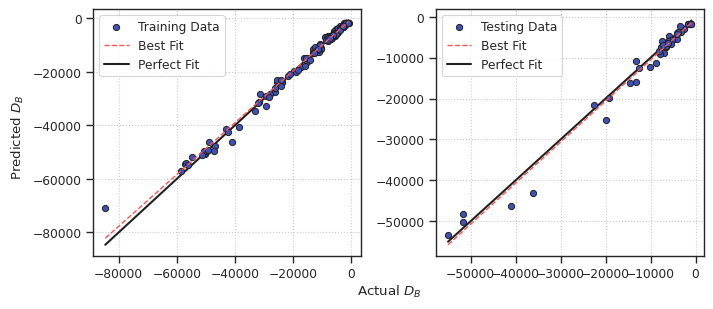

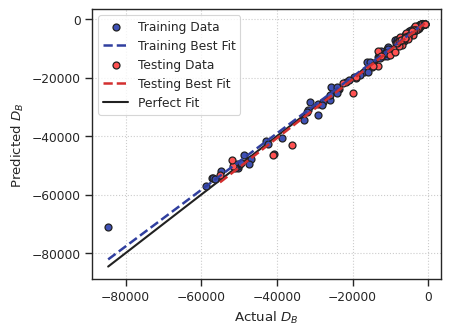

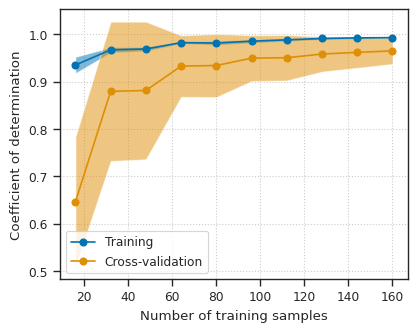

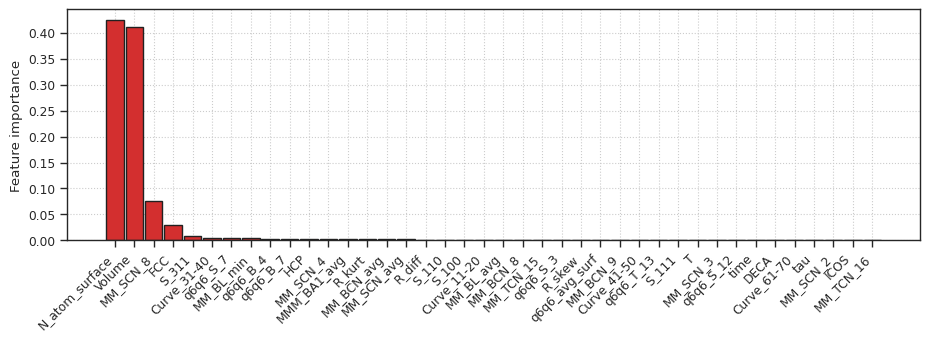

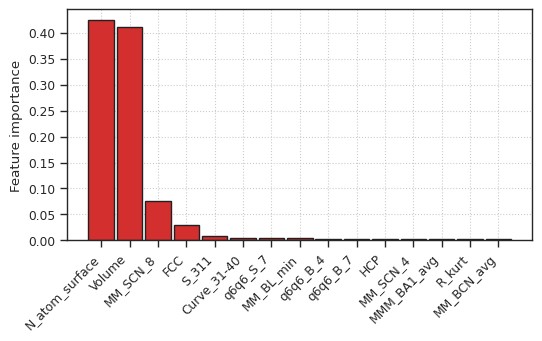

Removing the features with null values...
  Original number of features: 47
  Total number of features left: 47

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.989
    Cross-validation score: 0.958 +/- 0.011
    Testing score:
      Mean absolute error: 2091.762310
      Mean squared error: 10636108.576196
      Root mean squared error: 3261.304735
      Coefficient of determination: 0.971


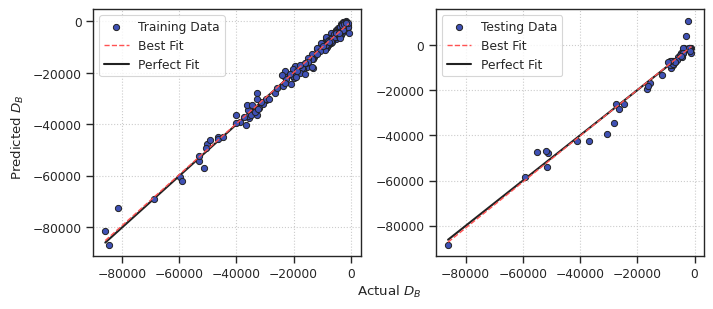

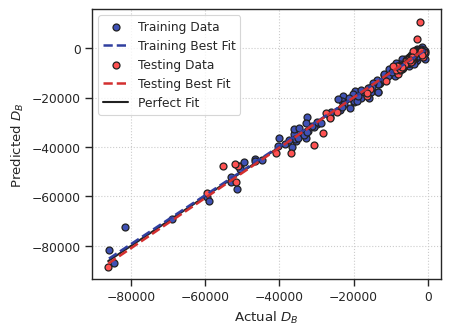

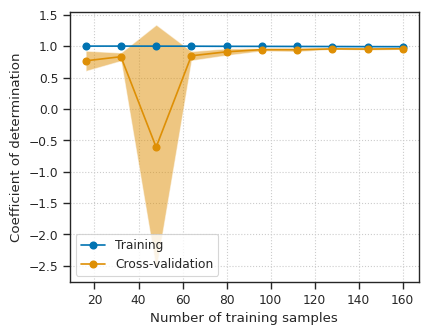

  Feature coefficients:
    time: 1655.142
    MM_SCN_avg: 1076.993
    S_110: 6308.628
    R_diff: 8625.479
    R_skew: 6241.383
    MMM_BA1_avg: 1199.904
    ICOS: 190.990
    Curve_11-20: 1985.304
    Curve_51-60: 275.544
    Curve_61-70: 3484.337
    Curve_71-80: 3340.330
    MM_SCN_3: 1121.115
    MM_SCN_13: 2618.728
    q6q6_S_3: 7874.666
    q6q6_S_7: 1361.208
    q6q6_S_12: 2828.743
    MM_TCN_15: 20685.949
    MM_BCN_7: 6342.016
    MM_BCN_8: 2829.438
    q6q6_B_4: 506.715

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.971
Best parameter combination: {'criterion': 'absolute_error', 'max_depth': 9, 'max_features': 0.9823318668479666, 'max_leaf_nodes': 94, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 8}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.994
    Cross-validation score: 0.971 +/- 0.008
    Testing score:
      Mean absolute error: 1946.723684
      Mean squared error: 19184148.902589
      Root mean squared error: 4379.971336
      Coefficient of determination: 0.947


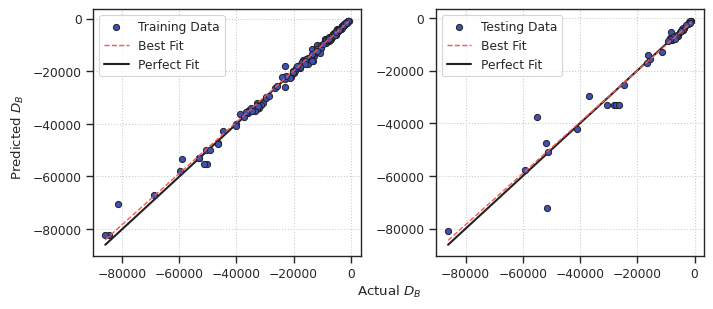

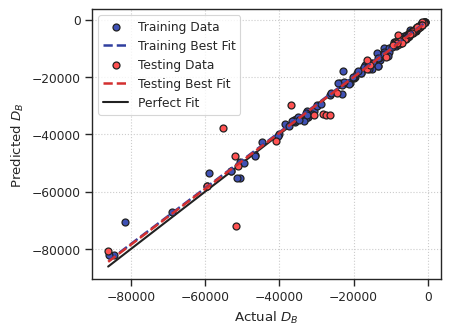

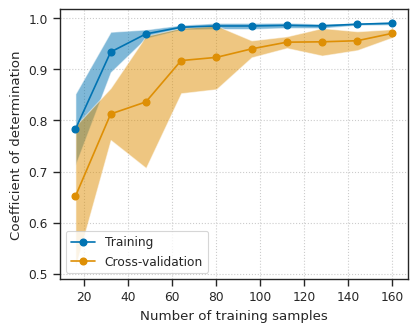

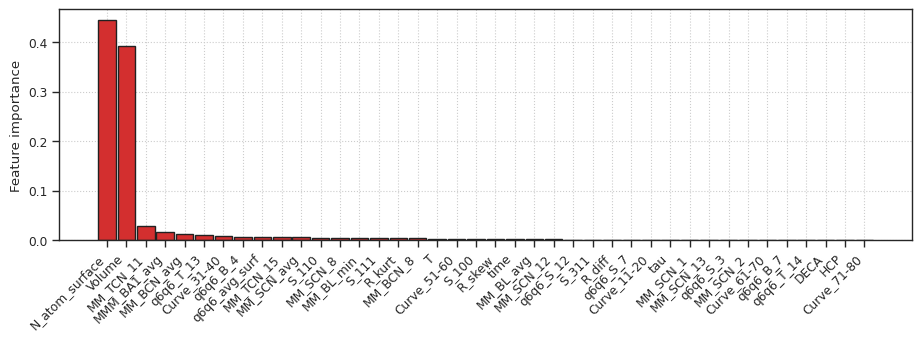

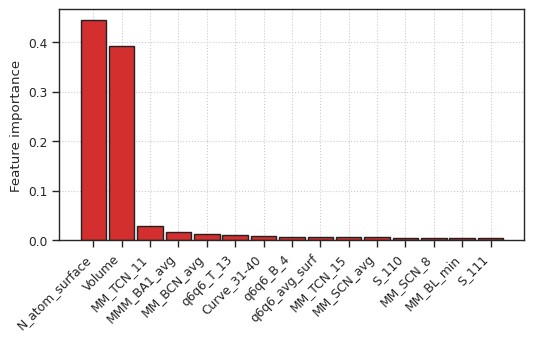

Removing the features with null values...
  Original number of features: 47
  Total number of features left: 47

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.991
    Cross-validation score: 0.966 +/- 0.012
    Testing score:
      Mean absolute error: 1393.886711
      Mean squared error: 4343598.172422
      Root mean squared error: 2084.130076
      Coefficient of determination: 0.988


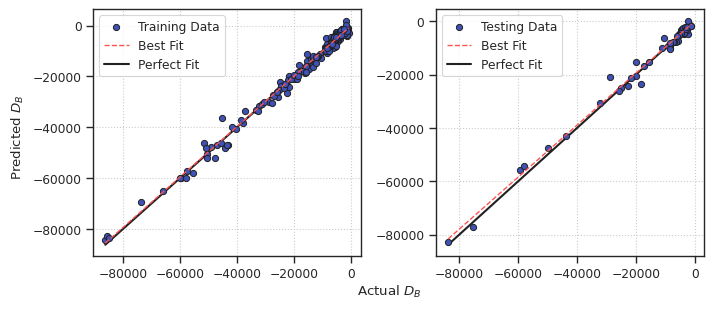

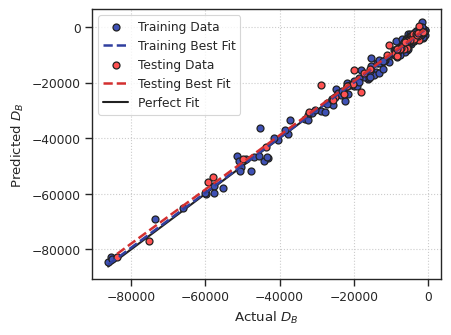

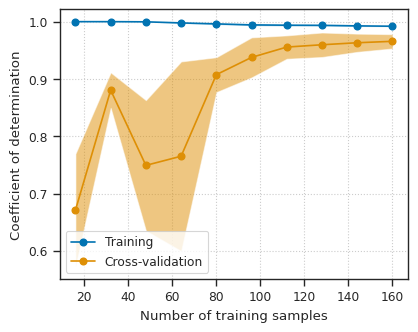

  Feature coefficients:
    time: 954.666
    q6q6_avg_surf: 3038.814
    S_110: 20148.880
    R_diff: 7438.334
    Curve_11-20: 15977.186
    Curve_51-60: 2644.452
    Curve_71-80: 8495.738
    MM_SCN_3: 2416.532
    MM_SCN_12: 247.981
    MM_SCN_13: 5297.111
    q6q6_S_12: 704.890
    MM_TCN_15: 19858.175
    MM_TCN_16: 2858.774
    MM_BCN_7: 2083.588
    MM_BCN_8: 4158.144
    q6q6_B_4: 4858.643

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.966
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 6, 'max_features': 0.3696091101584865, 'max_leaf_nodes': 44, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 18}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.992
    Cross-validation score: 0.966 +/- 0.023
    Testing score:
      Mean absolute error: 1502.179501
      Mean squared error: 5360295.202396
      Root mean squared error: 2315.231134
      Coefficient of determination: 0.985


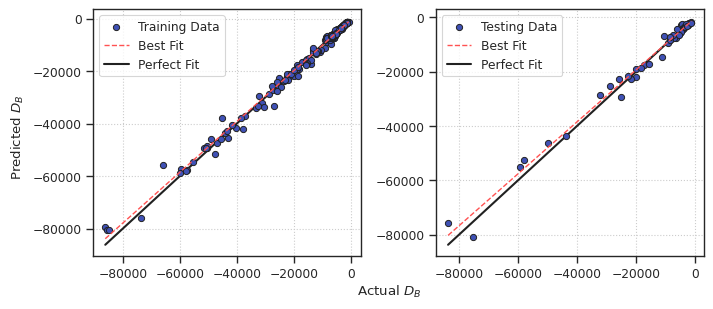

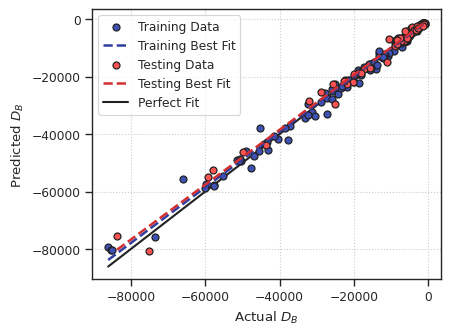

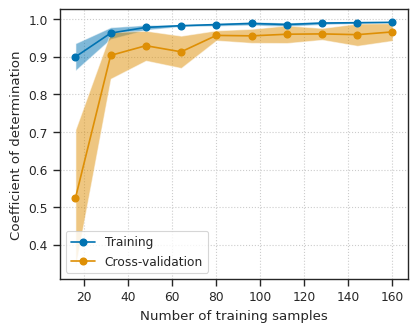

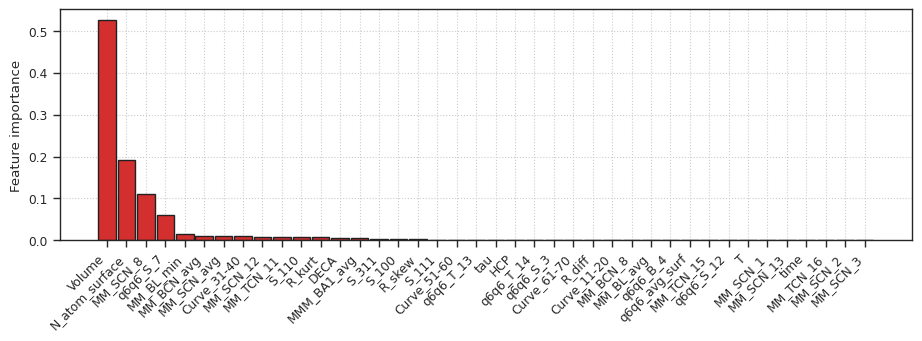

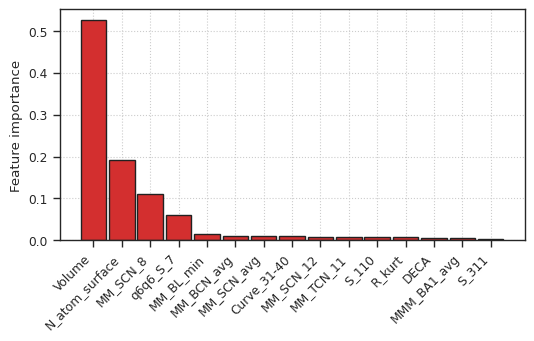

Removing the features with null values...
  Original number of features: 48
  Total number of features left: 48

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.989
    Cross-validation score: 0.952 +/- 0.021
    Testing score:
      Mean absolute error: 2596.149201
      Mean squared error: 43892526.393383
      Root mean squared error: 6625.143500
      Coefficient of determination: 0.868


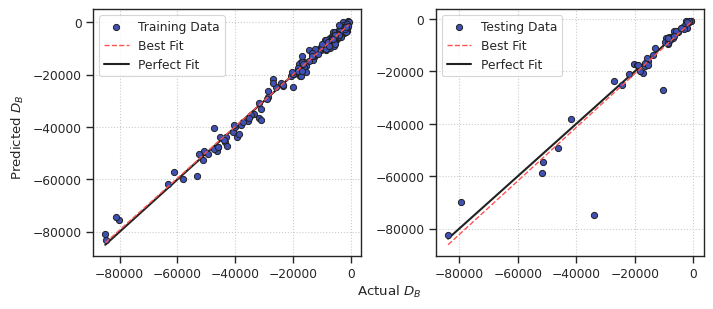

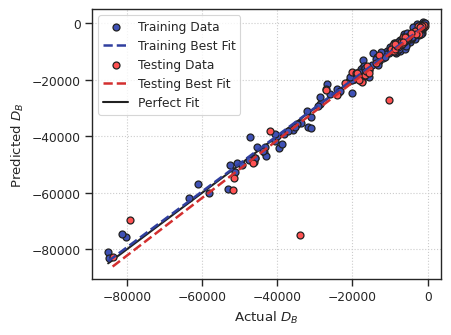

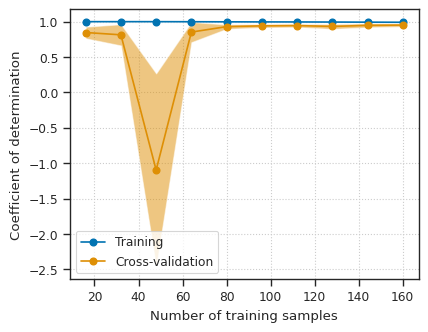

  Feature coefficients:
    time: 1613.561
    MM_SCN_avg: 3223.029
    N_atom_surface: 42272.005
    R_diff: 2290.383
    R_kurt: 3119.851
    DECA: 2369.671
    Curve_61-70: 764.820
    MM_SCN_2: 2777.770
    MM_SCN_3: 228.725
    MM_SCN_14: 238.038
    q6q6_S_3: 2932.135
    q6q6_S_8: 6881.238
    q6q6_S_12: 7221.770
    MM_TCN_16: 695.141
    MM_BCN_7: 4788.085
    MM_BCN_8: 7495.413

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.963
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 7, 'max_features': 0.21261273142757225, 'max_leaf_nodes': 61, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 43}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.993
    Cross-validation score: 0.963 +/- 0.009
    Testing score:
      Mean absolute error: 1211.493337
      Mean squared error: 3782982.235648
      Root mean squared error: 1944.989007
      Coefficient of determination: 0.989


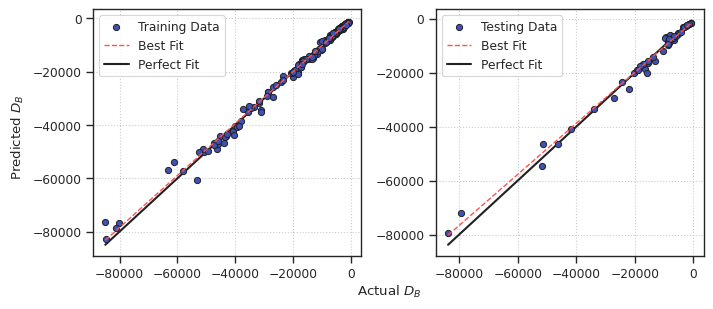

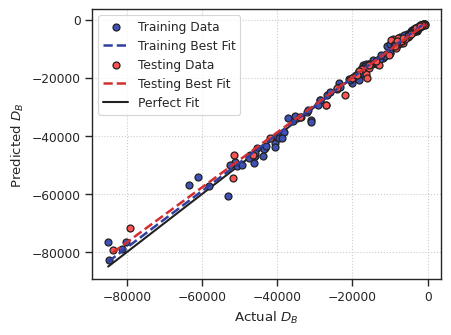

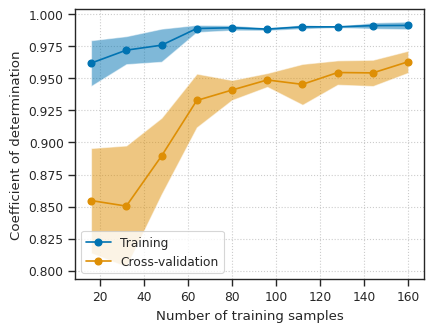

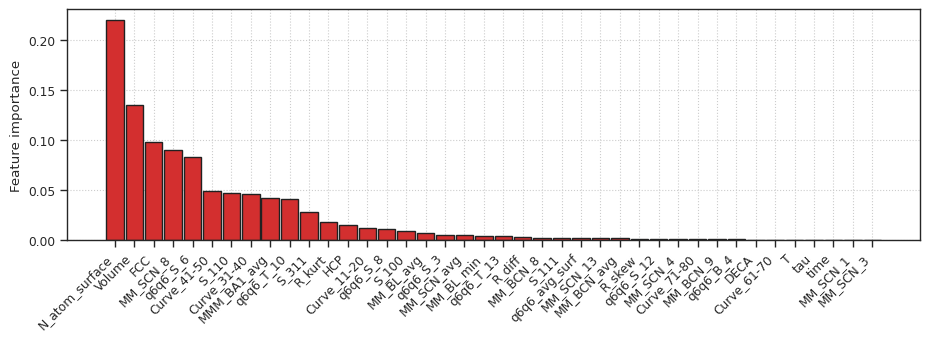

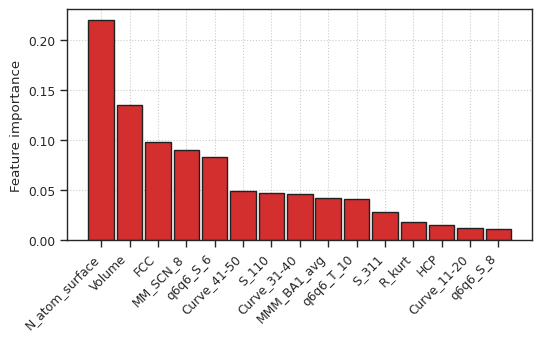

Removing the features with null values...
  Original number of features: 52
  Total number of features left: 52

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.993
    Cross-validation score: 0.967 +/- 0.021
    Testing score:
      Mean absolute error: 2009.893042
      Mean squared error: 16147400.727470
      Root mean squared error: 4018.382850
      Coefficient of determination: 0.937


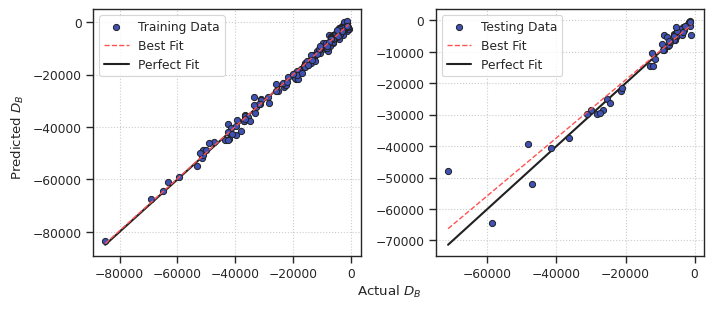

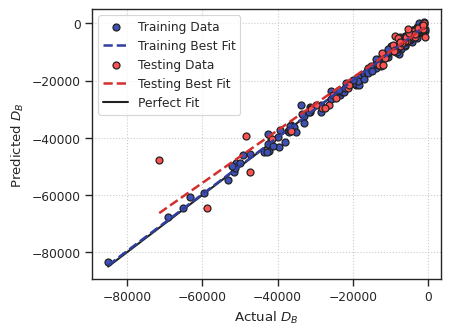

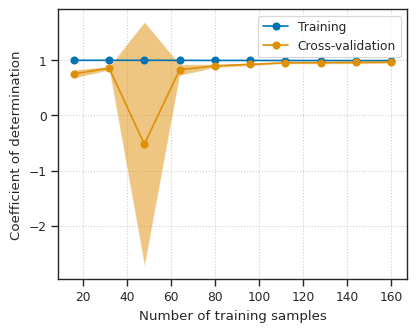

  Feature coefficients:
    time: 1366.900
    q6q6_avg_surf: 3929.380
    S_110: 13947.903
    Volume: 575.473
    R_diff: 5517.229
    R_skew: 568.964
    MM_BL_std: 24101.428
    MMM_BA1_avg: 14063.886
    Curve_11-20: 6641.202
    Curve_31-40: 1250.637
    Curve_41-50: 2534.971
    Curve_71-80: 1687.831
    MM_SCN_1: 550.374
    MM_SCN_6: 405.040
    MM_SCN_8: 7055.853
    MM_SCN_10: 2000.269
    q6q6_S_3: 6931.087
    q6q6_S_12: 7925.164
    MM_TCN_14: 7768.766
    q6q6_T_13: 5262.330
    MM_BCN_7: 1000.664
    MM_BCN_8: 261.493
    MM_BCN_9: 3585.173
    q6q6_B_3: 1931.721

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.954
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 6, 'max_features': 0.2932262987170199, 'max_leaf_nodes': 77, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 62}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.990
    Cross-validation score: 0.954 +/- 0.021
    Testing score:
      Mean absolute error: 2155.463755
      Mean squared error: 24817224.964764
      Root mean squared error: 4981.688967
      Coefficient of determination: 0.904


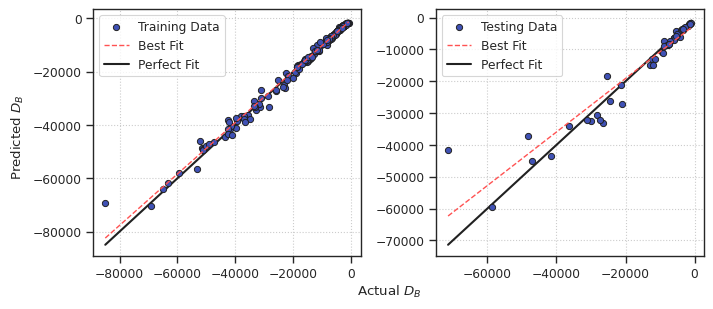

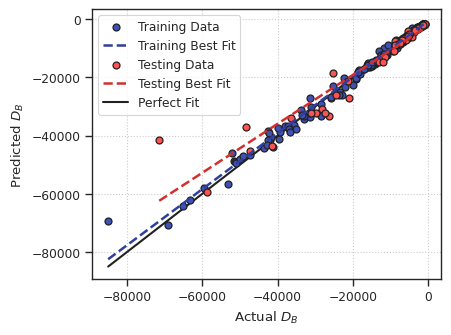

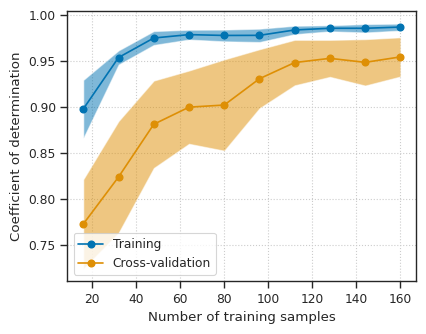

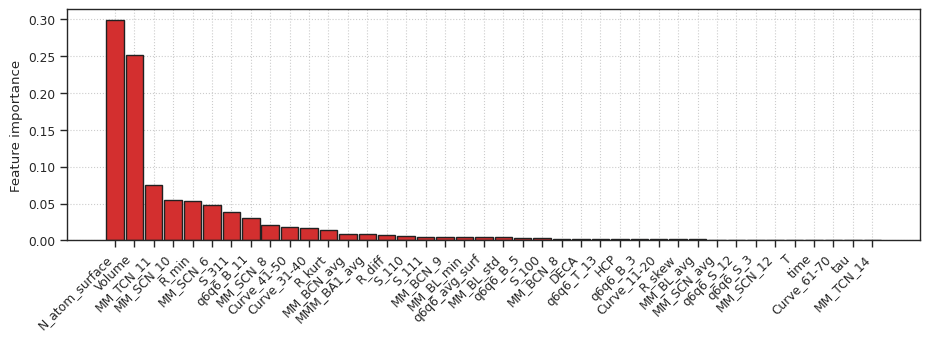

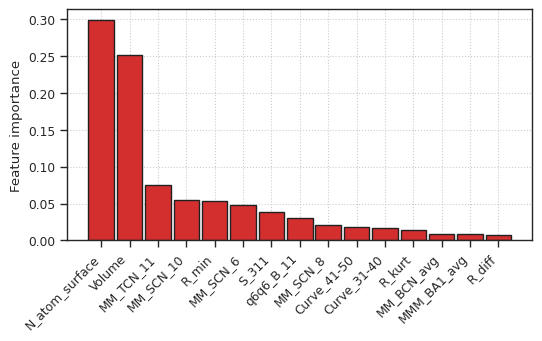

Removing the features with null values...
  Original number of features: 49
  Total number of features left: 49

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.982
    Cross-validation score: 0.940 +/- 0.015
    Testing score:
      Mean absolute error: 1936.683685
      Mean squared error: 6514946.114851
      Root mean squared error: 2552.439248
      Coefficient of determination: 0.969


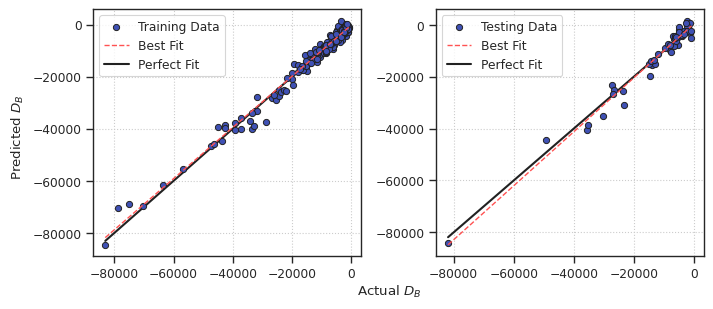

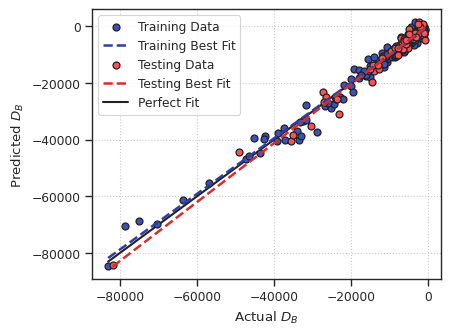

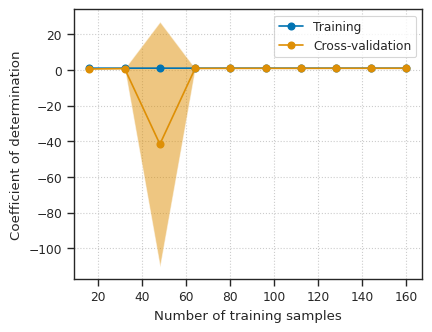

  Feature coefficients:
    time: 2486.376
    S_110: 15773.365
    R_diff: 9621.389
    R_skew: 2579.214
    Curve_11-20: 8254.205
    Curve_21-30: 9742.821
    Curve_41-50: 12392.729
    Curve_71-80: 4610.128
    MM_SCN_1: 363.276
    MM_SCN_2: 1068.708
    MM_SCN_8: 27864.946
    q6q6_S_3: 3680.425
    q6q6_S_12: 4293.715
    q6q6_T_0: 26206.831
    q6q6_T_13: 23906.295
    MM_BCN_8: 9181.469
    q6q6_B_4: 6557.169

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.938
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 6, 'max_features': 0.9674400479341159, 'max_leaf_nodes': 59, 'min_samples_leaf': 2, 'min_samples_split': 7, 'n_estimators': 81}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.980
    Cross-validation score: 0.938 +/- 0.022
    Testing score:
      Mean absolute error: 1111.961728
      Mean squared error: 4507884.505179
      Root mean squared error: 2123.177926
      Coefficient of determination: 0.979


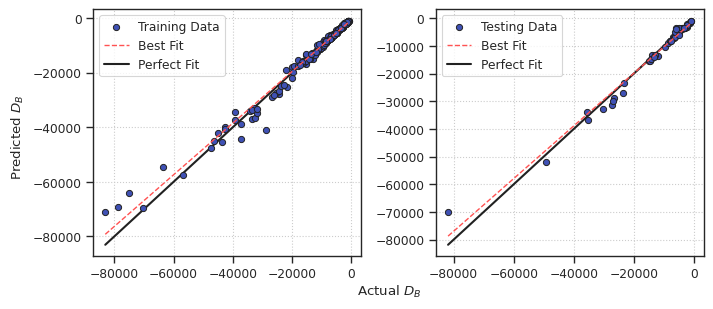

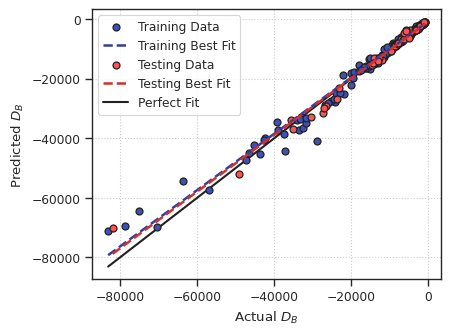

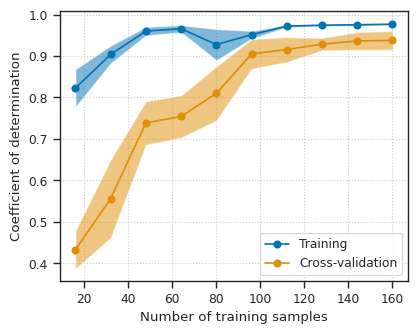

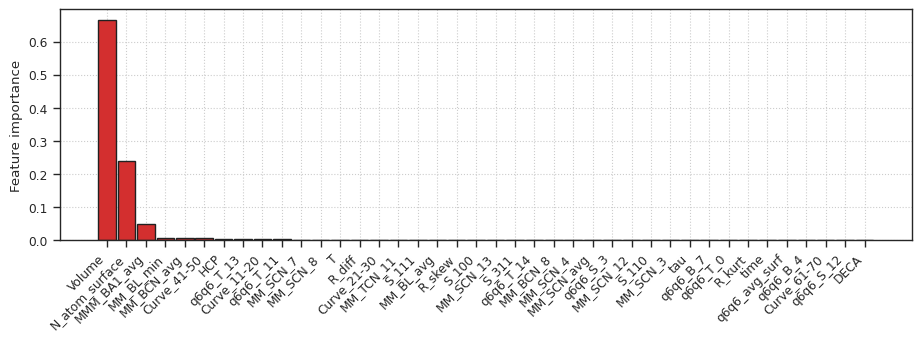

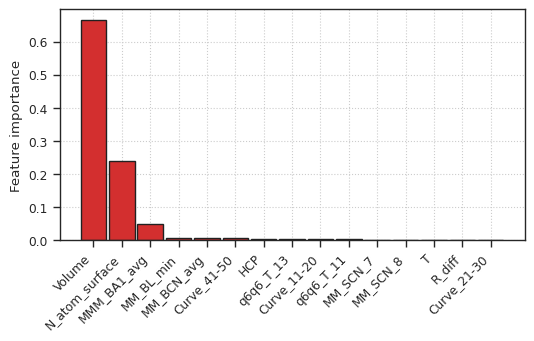

Removing the features with null values...
  Original number of features: 46
  Total number of features left: 46

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.987
    Cross-validation score: 0.926 +/- 0.042
    Testing score:
      Mean absolute error: 1973.968056
      Mean squared error: 9562575.764136
      Root mean squared error: 3092.341470
      Coefficient of determination: 0.963


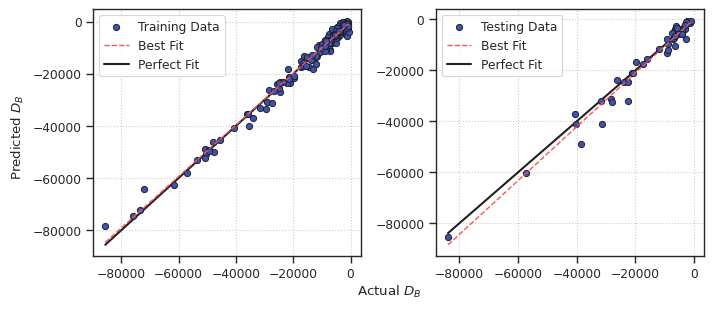

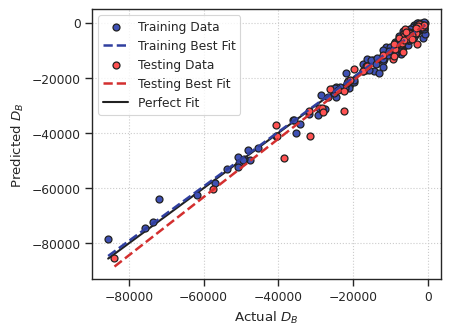

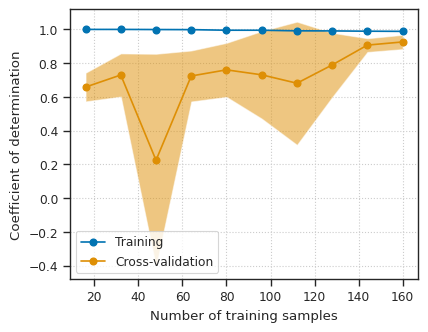

  Feature coefficients:
    time: 548.736
    q6q6_avg_surf: 1553.953
    S_110: 16145.855
    R_diff: 20114.212
    R_skew: 5155.596
    MM_BCN_avg: 663.177
    MMM_BA1_avg: 6882.061
    ICOS: 808.008
    DECA: 9184.845
    Curve_11-20: 2467.643
    Curve_41-50: 2238.695
    Curve_61-70: 6340.888
    MM_SCN_1: 1934.543
    MM_SCN_13: 7545.557
    q6q6_S_12: 3980.658
    q6q6_S_13: 8203.437
    MM_TCN_15: 10456.197
    MM_TCN_16: 747.984
    q6q6_T_13: 13370.209
    MM_BCN_7: 7031.000
    MM_BCN_8: 11718.744
    q6q6_B_4: 4279.285

Dataset: MNP


/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:542: FitFailedWarning: 
1260 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 890, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/base.py", line 1351, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/g/data/q27/jt5911/PythonEnvs/npfd/lib/python3.10/site-packages/sklearn/ensemble/_forest.py"

Best score: 0.943
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 9, 'max_features': 0.6149106673499857, 'max_leaf_nodes': 23, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 82}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.991
    Cross-validation score: 0.943 +/- 0.029
    Testing score:
      Mean absolute error: 1710.180144
      Mean squared error: 11263678.597163
      Root mean squared error: 3356.140432
      Coefficient of determination: 0.956


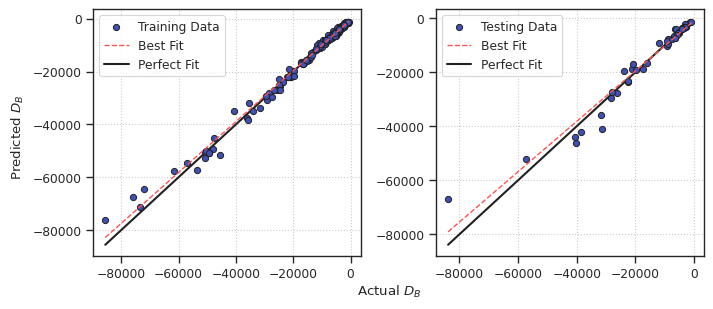

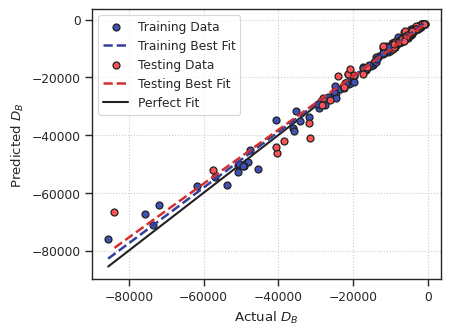

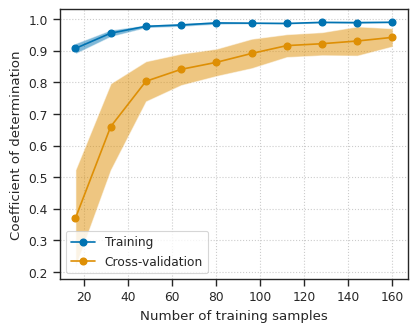

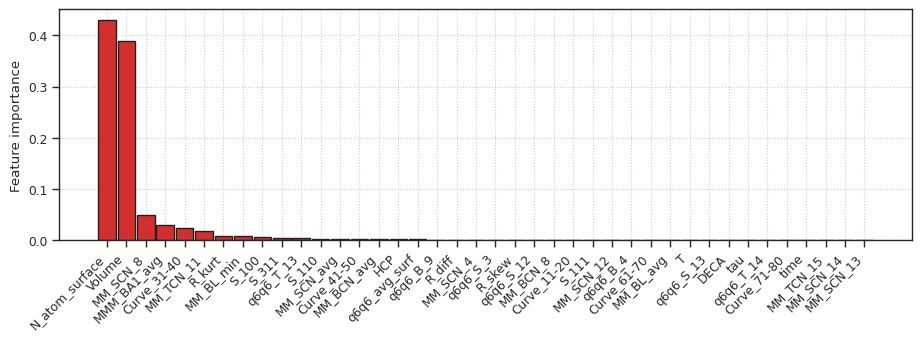

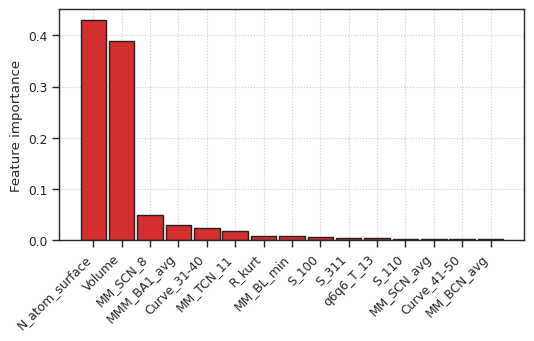

In [21]:
CORR_THRESH = 0.8

for i in range(NUM_RUNS):
    FIG_NAME_APPENDIX = f"_Etot_minmax_random_{i}"
    # Data loading
    # MNPDF = pd.read_pickle(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}_250.pickle")
    MNPDF = pd.read_pickle(f"{DATA_DIR}/processedMNPEdataNoC{int(CORR_THRESH * 100)}run{i+1}_250.pickle")
    MNPDF = MNPDF.drop(['Formation_E'], axis=1)  # Total_E
    
    MNPNoNullDF = rmNullFeats(featsDF=MNPDF, verbose=VERBOSE)
    
    XtrainMNP, XtestMNP, yTrainMNP, yTestMNP = splitScaleData(df=MNPDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull = splitScaleData(df=MNPNoNullDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    
    X_Y_MNPS = {'WithNull': {'MNP': (XtrainMNP, XtestMNP, yTrainMNP, yTestMNP)}, 
                'NoNull': {'MNP': (XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull)}}

    # Linear Regression
    hasMissingVals, modelName = 'NoNull', 'LRR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
        
        linReg = LinearRegression(positive=False, fit_intercept=True, 
                                  copy_X=True, n_jobs=NUM_JOBS)  # No speedup from n_jobs here as n_target=1 and positive=False
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        yPredTrainLinR, yPredTestLinR, linReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                         model=linReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                         numFeat=20, isReg=True, showFeatCoef=True, plotFeatImp=False, verbose=True, showFig=True)

    # Random Forest
    hasMissingVals, modelName = 'WithNull', 'RFR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        # if exists(f"{DATA_DIR}/hpTune{mnp}{modelName}.pickle"):
        #     print('Already done, skipping...')
        #     continue
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
    
        rfReg = RandomForestRegressor(n_estimators=40, criterion='squared_error', max_depth=None, 
                                      max_features=1.0, max_leaf_nodes=None, min_samples_split=2, min_samples_leaf=1, 
                                      min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0, n_jobs=NUM_JOBS, random_state=RANDOM_SEED, verbose=0, 
                                      bootstrap=True, oob_score=False, warm_start=False, ccp_alpha=0.0, max_samples=None, monotonic_cst=None)
        paramGrid = {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'], 
                     'n_estimators': stats.randint(low=3, high=100), 
                     'max_depth' : stats.randint(low=1, high=10), 
                     'max_features': stats.uniform(loc=0.1, scale=0.9), 
                     'max_leaf_nodes': stats.randint(low=5, high=100),
                     'min_samples_split': stats.randint(low=2, high=20), 
                     'min_samples_leaf': stats.randint(low=1, high=10)}
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        searchResults = hyperparamTune(rfReg, paramGrid, Xtrain, yTrain, scoringMetric='r2', cv=cv, numIter=1000)
        with open(f"{DATA_DIR}/hpTune{mnp}{modelName}run{i}.pickle", 'wb') as f:
            pickle.dump(searchResults, f)
    
        rfReg = searchResults.best_estimator_
        yPredTrainRFR, yPredTestRFR, rfReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                      model=rfReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                      numFeat=15, showFeatCoef=False, plotFeatImp=True, verbose=True, showFig=True)
        # # Note: Set 'showFig' to False for cluster jobs!

### Extra Instances

In [11]:
def loadFeats(pklFilePath):
    """
    Load feature dataframe saved in pickle file.
    """
    with open(pklFilePath, 'rb') as f:
        featsDF = pickle.load(f)
    return featsDF

Removing the features with null values...
  Original number of features: 77
  Total number of features left: 77

Removing the features with null values...
  Original number of features: 77
  Total number of features left: 77

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.531
    Cross-validation score: 0.223 +/- 0.210
    Testing score:
      Mean absolute error: 0.015850
      Mean squared error: 0.000528
      Root mean squared error: 0.022974
      Coefficient of determination: 0.344


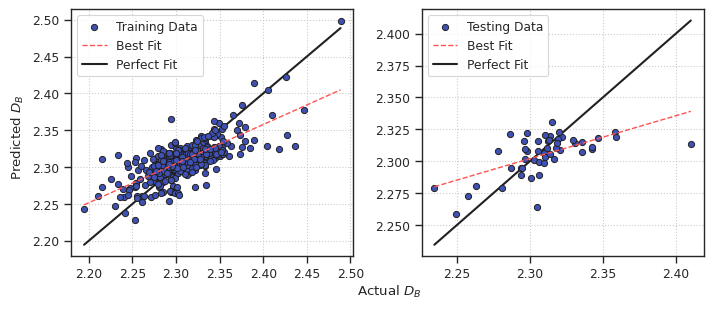

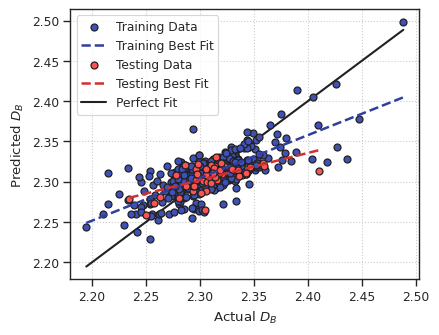

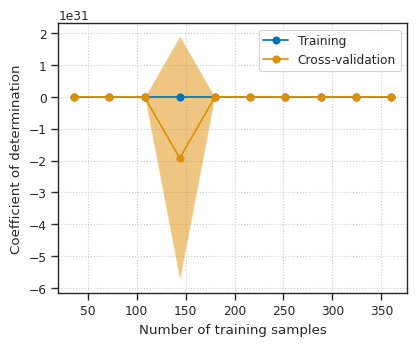

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.004
    R_skew: 0.029
    MM_TCN_avg: 0.065
    MM_BL_avg: 0.010
    MM_BL_min: 0.007
    Curve_61-70: 0.001
    MM_SCN_3: 0.001
    MM_SCN_15: 0.019
    q6q6_S_8: 0.059
    MM_TCN_16: 0.003
    MM_TCN_17: 0.016
    MM_BCN_5: 0.004
    MM_BCN_9: 0.001
    q6q6_B_8: 0.059

Dataset: MNP
Best score: 0.500
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.38547614508885875, 'max_leaf_nodes': 79, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 91}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.826
    Cross-validation score: 0.500 +/- 0.052
    Testing score:
      Mean absolute error: 0.014348
      Mean squared error: 0.000624
      Root mean squared error: 0.024978
      Coefficient of determination: 0.225


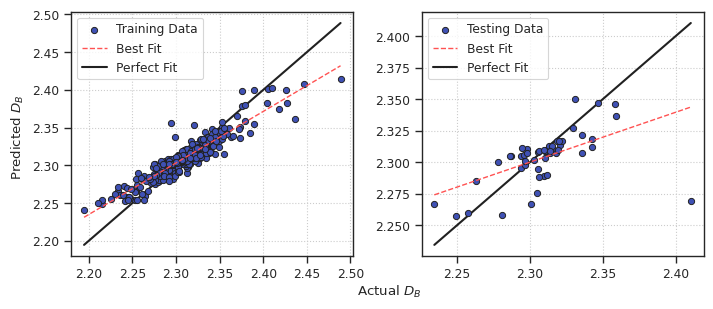

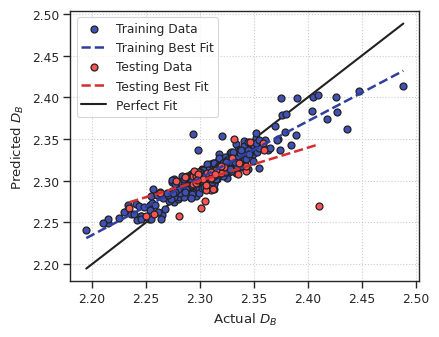

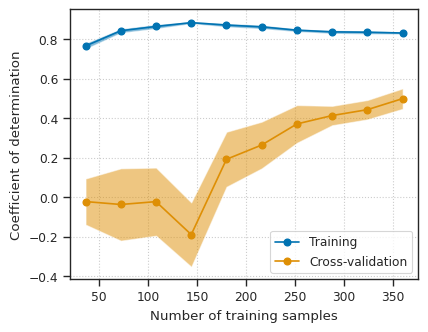

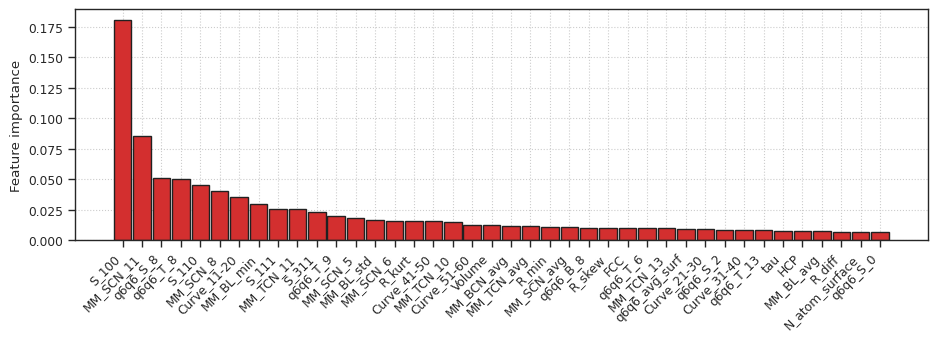

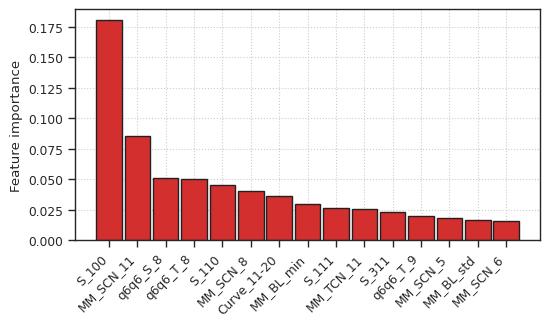

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.406
    Cross-validation score: 0.290 +/- 0.078
    Testing score:
      Mean absolute error: 0.019855
      Mean squared error: 0.000673
      Root mean squared error: 0.025943
      Coefficient of determination: 0.295


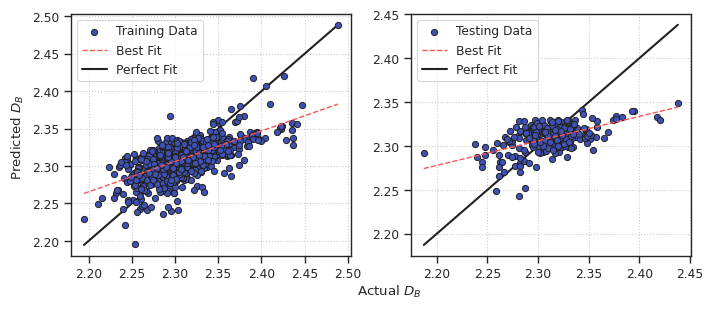

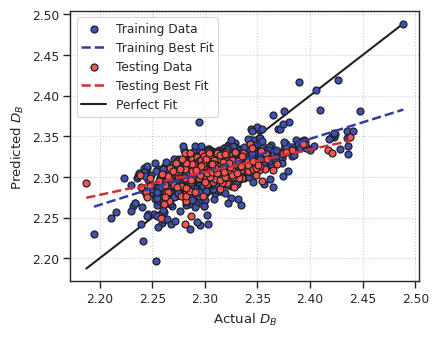

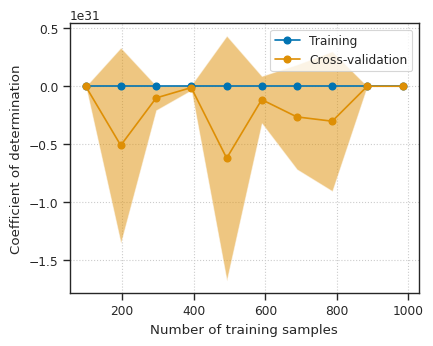

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.005
    R_diff: 0.008
    MM_TCN_avg: 0.111
    MM_BCN_avg: 0.006
    MM_BL_avg: 0.008
    MM_BL_min: 0.007
    Curve_51-60: 0.001
    Curve_61-70: 0.001
    MM_SCN_3: 0.001
    MM_SCN_14: 0.003
    MM_SCN_15: 0.015
    MM_TCN_16: 0.004
    MM_TCN_17: 0.003
    q6q6_T_8: 0.068

Dataset: MNP
Best score: 0.633
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9257887086883703, 'max_leaf_nodes': 75, 'min_samples_leaf': 6, 'min_samples_split': 3, 'n_estimators': 43}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.834
    Cross-validation score: 0.633 +/- 0.026
    Testing score:
      Mean absolute error: 0.013056
      Mean squared error: 0.000338
      Root mean squared error: 0.018375
      Coefficient of determination: 0.646


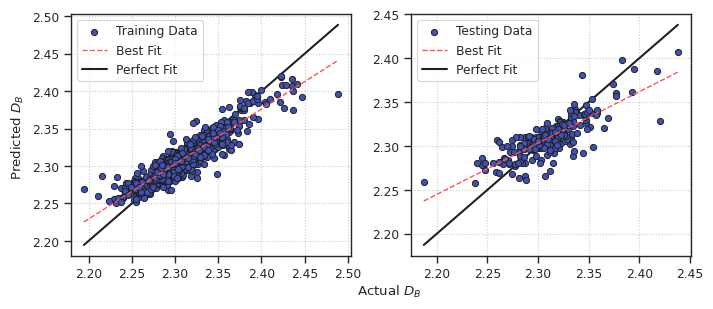

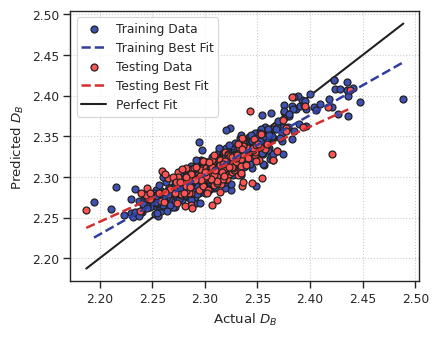

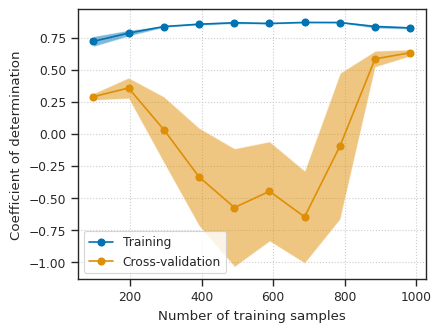

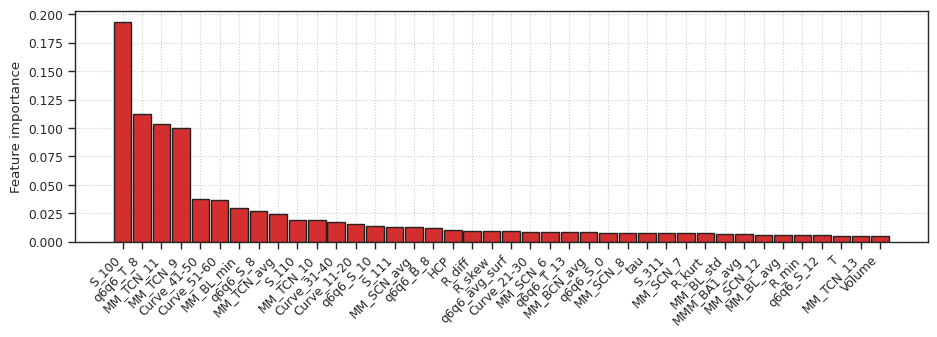

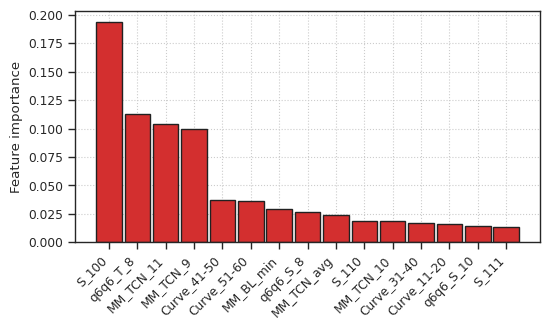

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.446
    Cross-validation score: 0.366 +/- 0.056
    Testing score:
      Mean absolute error: 0.017734
      Mean squared error: 0.000604
      Root mean squared error: 0.024570
      Coefficient of determination: 0.431


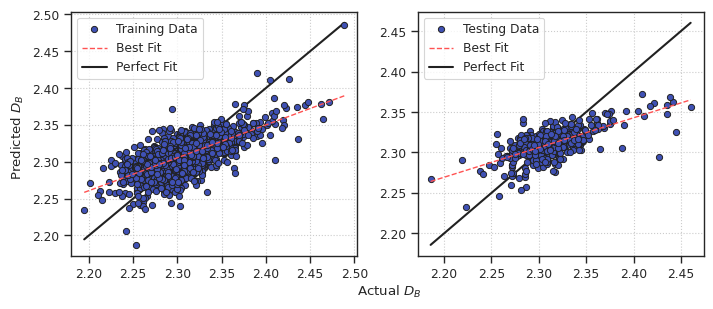

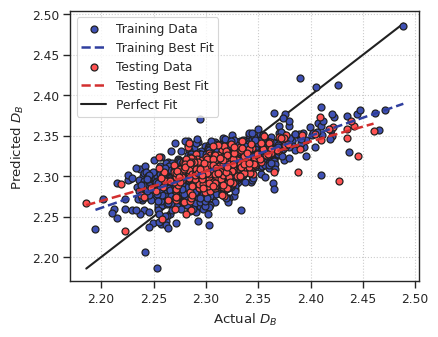

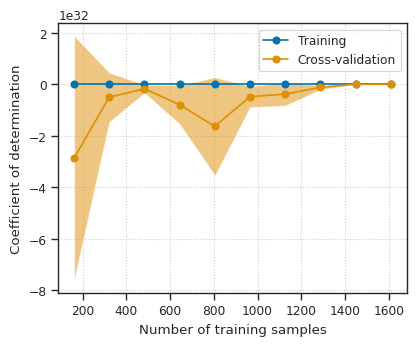

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.004
    N_atom_surface: 0.022
    R_diff: 0.038
    R_min: 0.015
    MM_TCN_avg: 0.111
    MM_BCN_avg: 0.001
    MM_BL_avg: 0.005
    MM_BL_std: 0.002
    MM_BL_min: 0.004
    ICOS: 0.002
    MM_SCN_12: 0.001
    MM_SCN_13: 0.002
    MM_SCN_15: 0.005
    MM_TCN_16: 0.007
    MM_TCN_17: 0.010
    q6q6_T_10: 0.091
    MM_BCN_5: 0.001
    MM_BCN_6: 0.001
    MM_BCN_7: 0.002
    MM_BCN_8: 0.001
    MM_BCN_9: 0.001

Dataset: MNP
Best score: 0.631
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.38547614508885875, 'max_leaf_nodes': 79, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 91}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.824
    Cross-validation score: 0.631 +/- 0.029
    Testing score:
      Mean absolute error: 0.012523
      Mean squared error: 0.000363
      Root mean squared error: 0.019056
      Coefficient of 

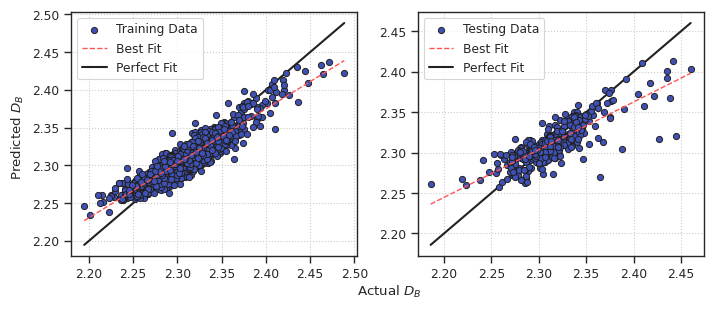

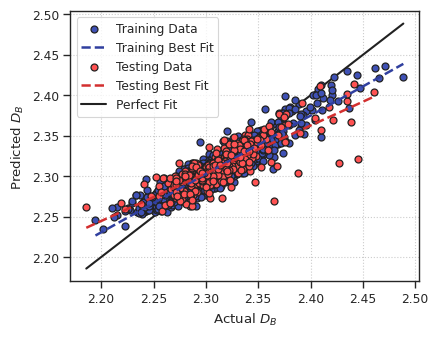

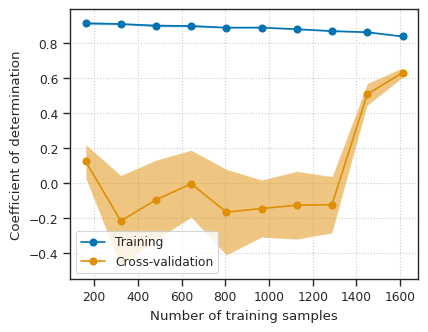

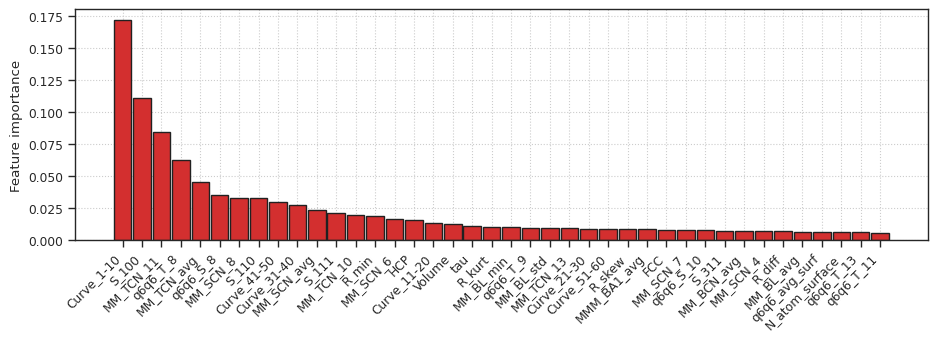

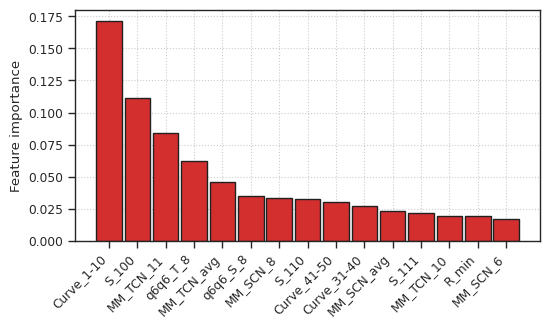

Removing the features with null values...
  Original number of features: 76
  Total number of features left: 76

Removing the features with null values...
  Original number of features: 76
  Total number of features left: 76

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.449
    Cross-validation score: 0.348 +/- 0.075
    Testing score:
      Mean absolute error: 0.017224
      Mean squared error: 0.000534
      Root mean squared error: 0.023108
      Coefficient of determination: 0.461


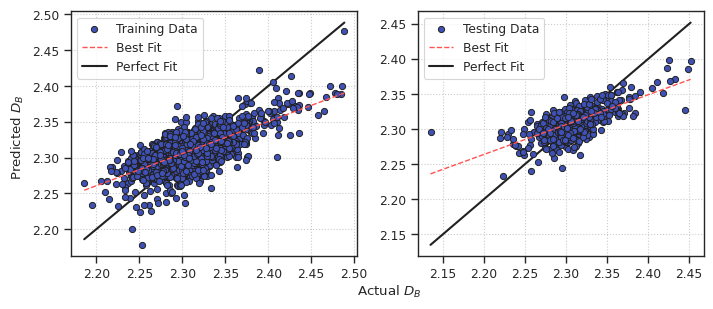

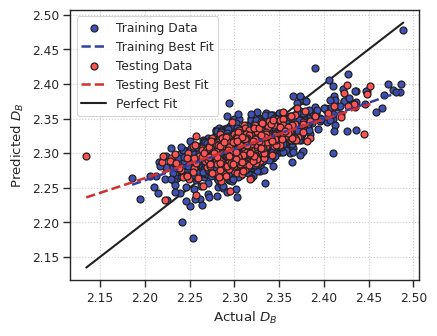

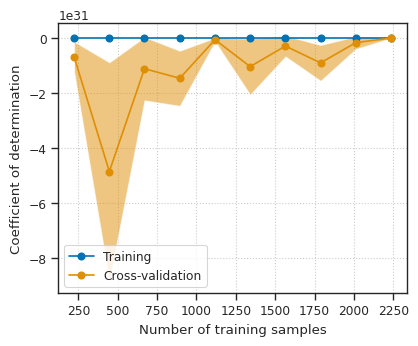

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.003
    N_atom_surface: 0.029
    R_diff: 0.057
    R_min: 0.050
    MM_TCN_avg: 0.118
    MM_BCN_avg: 0.013
    MM_BL_avg: 0.003
    MM_BL_std: 0.006
    MM_SCN_12: 0.001
    MM_SCN_13: 0.002
    MM_SCN_14: 0.004
    MM_SCN_15: 0.005
    q6q6_S_8: 0.149
    MM_TCN_16: 0.005
    MM_TCN_17: 0.001
    q6q6_T_10: 0.486
    MM_BCN_6: 0.005
    MM_BCN_7: 0.002
    MM_BCN_8: 0.001
    MM_BCN_9: 0.001
    q6q6_B_8: 0.149

Dataset: MNP
Best score: 0.660
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.38547614508885875, 'max_leaf_nodes': 79, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 91}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.813
    Cross-validation score: 0.660 +/- 0.036
    Testing score:
      Mean absolute error: 0.011955
      Mean squared error: 0.000280
      Root mean squared error: 0.016732
      Coefficient

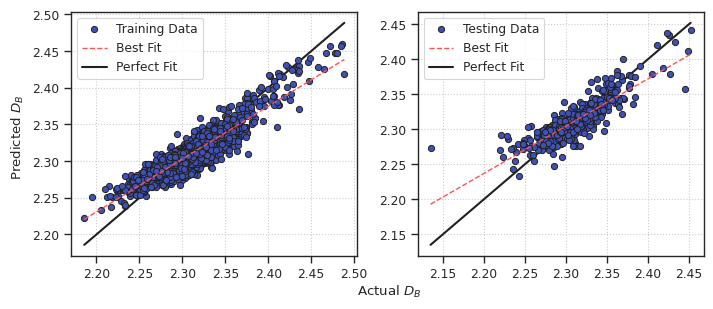

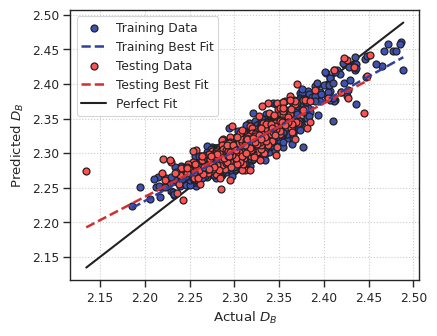

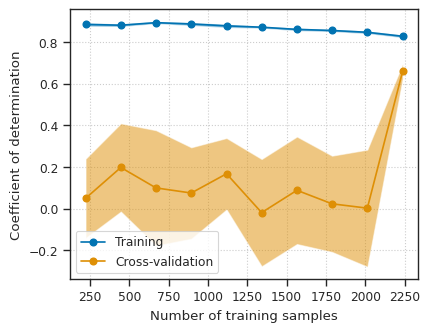

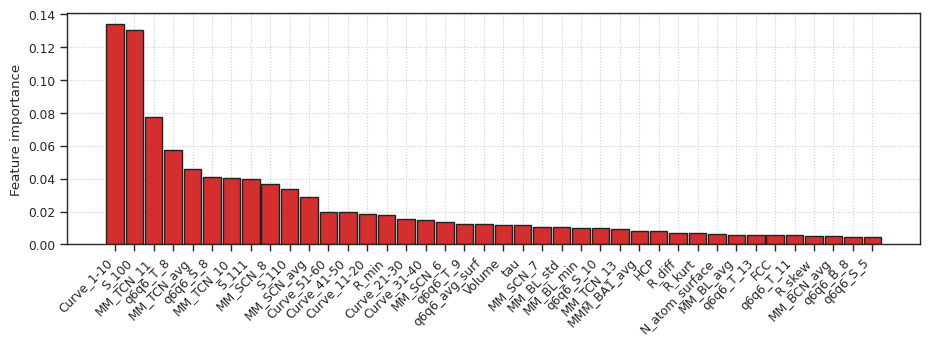

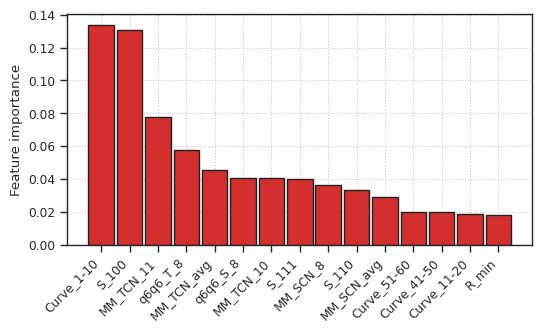

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.453
    Cross-validation score: 0.361 +/- 0.071
    Testing score:
      Mean absolute error: 0.017411
      Mean squared error: 0.000516
      Root mean squared error: 0.022710
      Coefficient of determination: 0.421


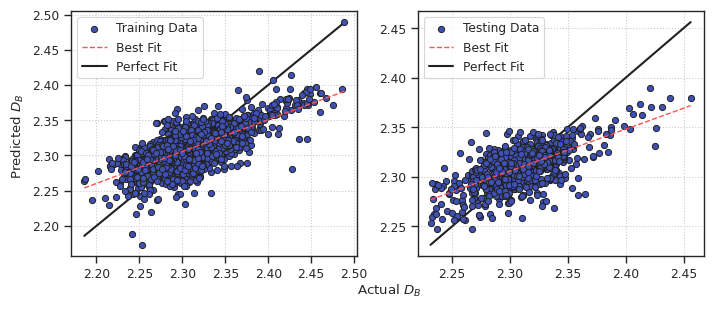

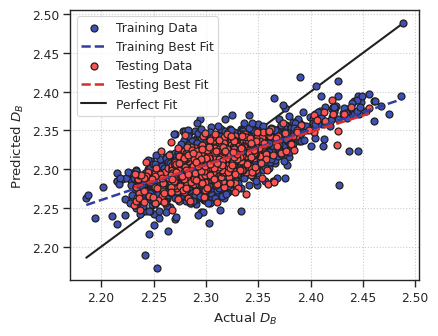

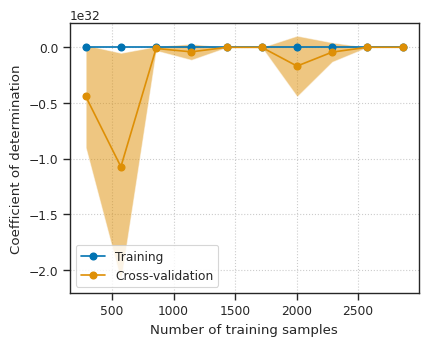

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.001
    N_atom_surface: 0.037
    R_diff: 0.053
    R_min: 0.017
    MM_TCN_avg: 0.143
    MM_BL_avg: 0.009
    MM_BL_min: 0.004
    ICOS: 0.003
    MM_SCN_12: 0.001
    MM_SCN_13: 0.002
    MM_SCN_14: 0.006
    MM_TCN_16: 0.009
    MM_TCN_17: 0.001
    MM_BCN_8: 0.004

Dataset: MNP
Best score: 0.695
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9274486641154054, 'max_leaf_nodes': 91, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.813
    Cross-validation score: 0.695 +/- 0.038
    Testing score:
      Mean absolute error: 0.011492
      Mean squared error: 0.000247
      Root mean squared error: 0.015727
      Coefficient of determination: 0.722


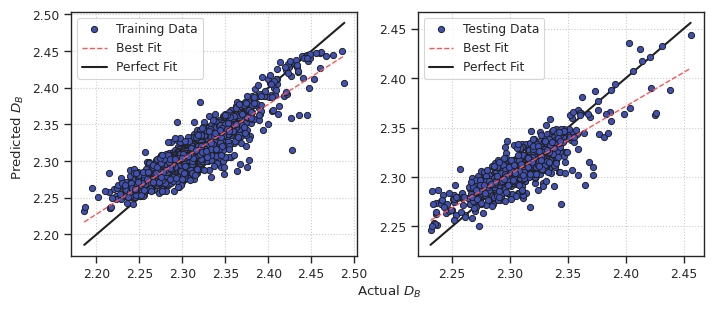

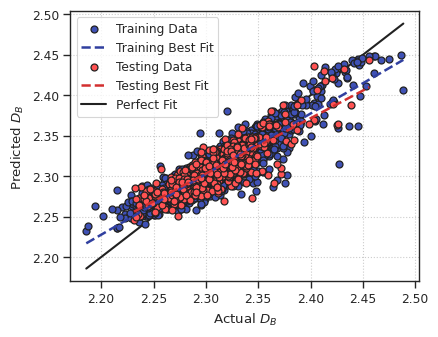

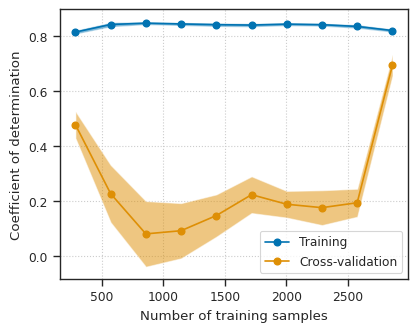

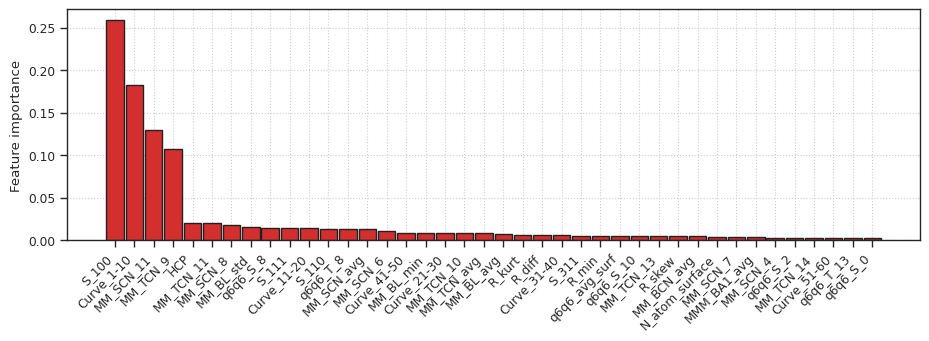

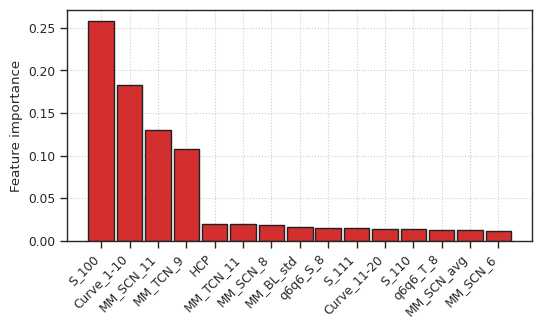

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.457
    Cross-validation score: 0.388 +/- 0.013
    Testing score:
      Mean absolute error: 0.017022
      Mean squared error: 0.000507
      Root mean squared error: 0.022510
      Coefficient of determination: 0.476


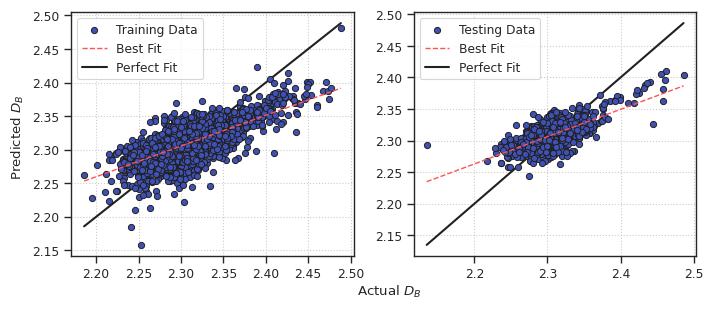

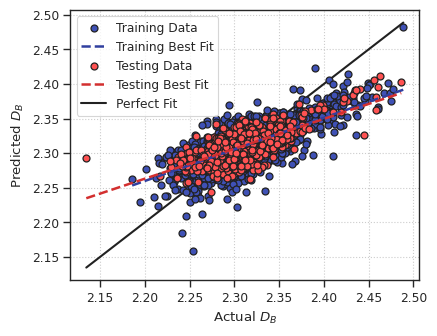

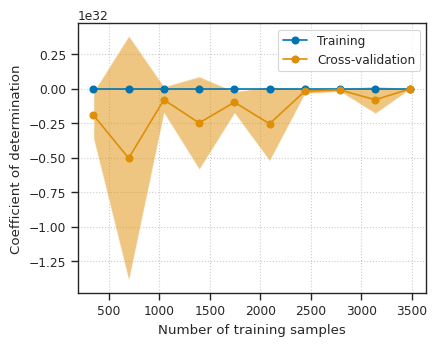

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.001
    N_atom_surface: 0.033
    R_diff: 0.057
    R_min: 0.033
    MM_TCN_avg: 0.155
    MM_BCN_avg: 0.004
    MM_BL_avg: 0.008
    MM_BL_min: 0.003
    ICOS: 0.004
    MM_SCN_2: 0.001
    MM_SCN_12: 0.001
    MM_SCN_13: 0.002
    MM_SCN_14: 0.008
    MM_TCN_16: 0.006
    q6q6_T_10: 0.229
    MM_BCN_7: 0.003
    MM_BCN_8: 0.005

Dataset: MNP
Best score: 0.710
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9274486641154054, 'max_leaf_nodes': 91, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.810
    Cross-validation score: 0.710 +/- 0.031
    Testing score:
      Mean absolute error: 0.011546
      Mean squared error: 0.000254
      Root mean squared error: 0.015941
      Coefficient of determination: 0.737


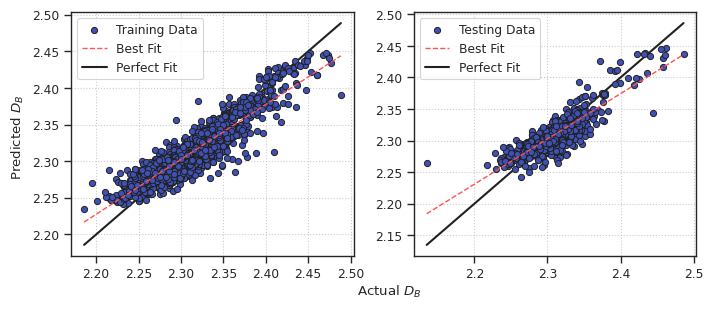

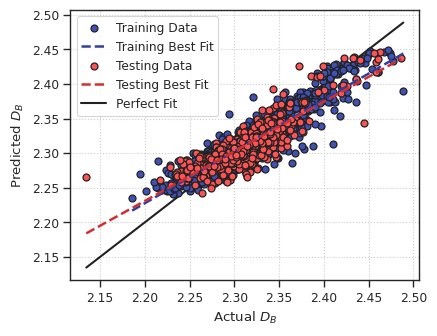

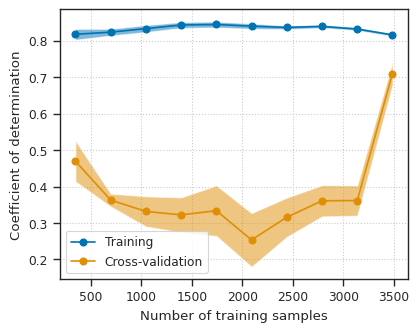

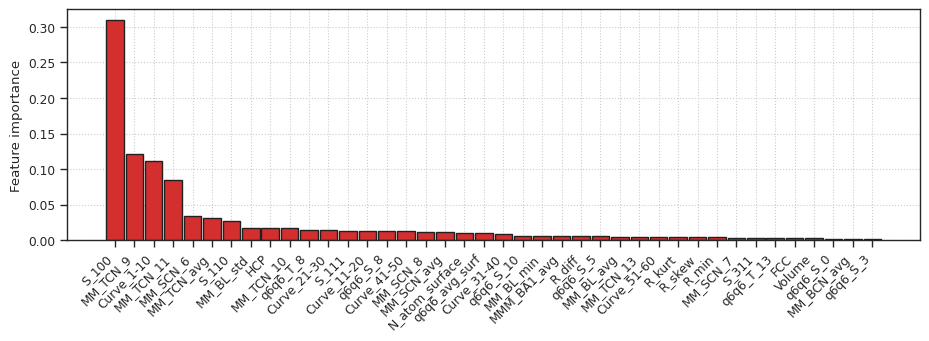

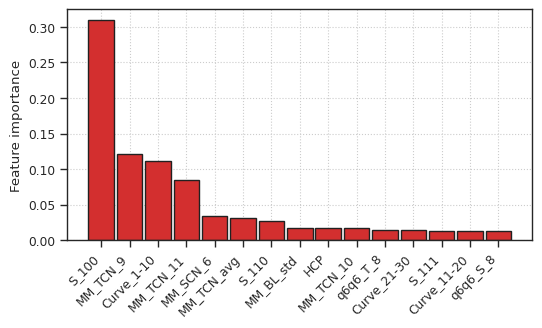

Removing the features with null values...
  Original number of features: 76
  Total number of features left: 76

Removing the features with null values...
  Original number of features: 76
  Total number of features left: 76

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.461
    Cross-validation score: 0.390 +/- 0.043
    Testing score:
      Mean absolute error: 0.017495
      Mean squared error: 0.000513
      Root mean squared error: 0.022650
      Coefficient of determination: 0.470


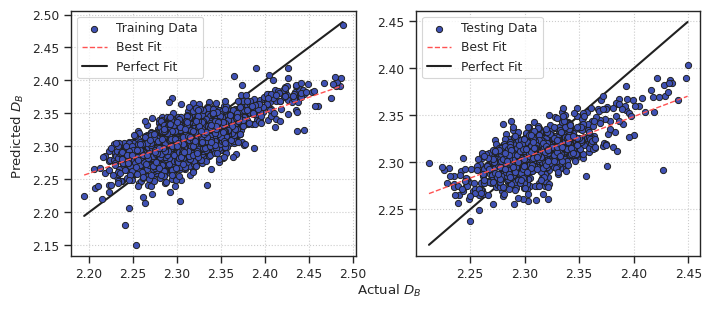

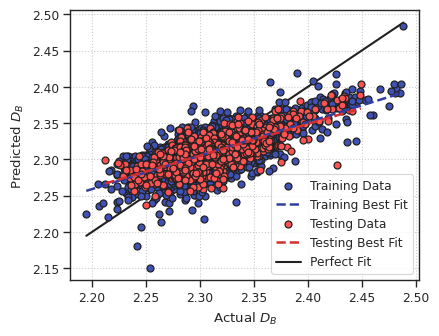

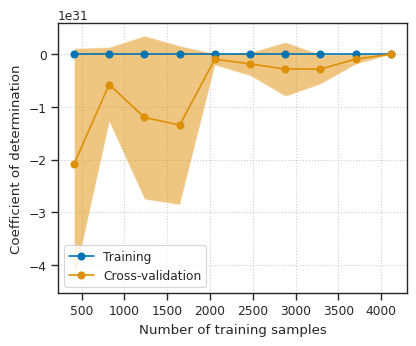

  Feature coefficients:
    time: 0.003
    q6q6_avg_surf: 0.001
    N_atom_surface: 0.035
    R_diff: 0.065
    R_min: 0.042
    MM_TCN_avg: 0.154
    MM_BCN_avg: 0.007
    MM_BL_avg: 0.006
    MM_BL_std: 0.002
    MM_BL_min: 0.003
    ICOS: 0.003
    MM_SCN_12: 0.001
    MM_SCN_13: 0.003
    MM_SCN_14: 0.006
    MM_SCN_15: 0.004
    MM_TCN_16: 0.006
    MM_TCN_17: 0.002
    q6q6_T_10: 0.131
    MM_BCN_7: 0.006
    MM_BCN_8: 0.006

Dataset: MNP
Best score: 0.710
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9463772865706722, 'max_leaf_nodes': 94, 'min_samples_leaf': 5, 'min_samples_split': 19, 'n_estimators': 79}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.806
    Cross-validation score: 0.710 +/- 0.022
    Testing score:
      Mean absolute error: 0.011731
      Mean squared error: 0.000262
      Root mean squared error: 0.016194
      Coefficient of determination: 0.729


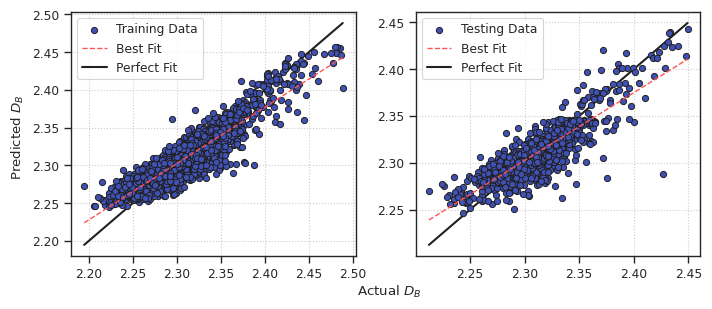

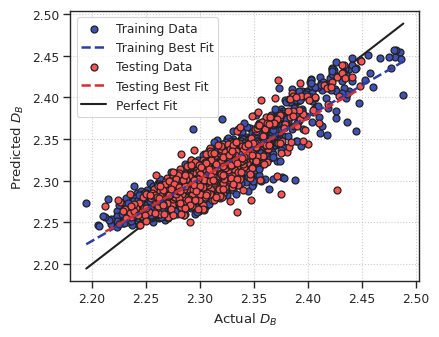

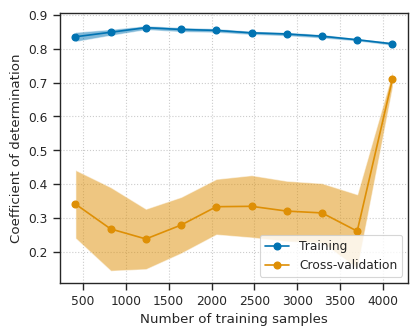

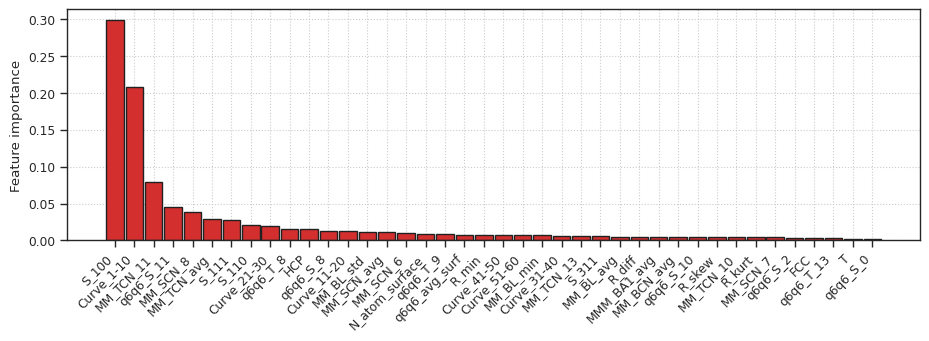

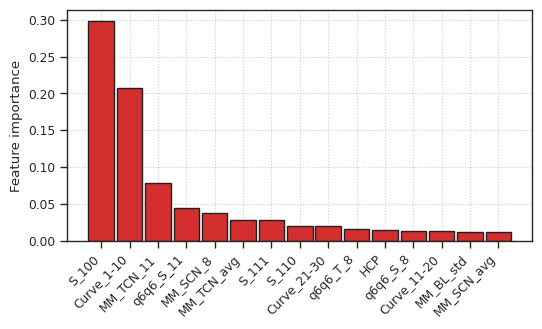

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.444
    Cross-validation score: 0.392 +/- 0.026
    Testing score:
      Mean absolute error: 0.017668
      Mean squared error: 0.000534
      Root mean squared error: 0.023103
      Coefficient of determination: 0.421


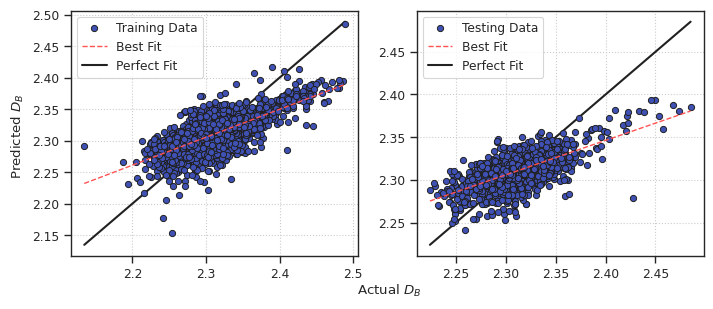

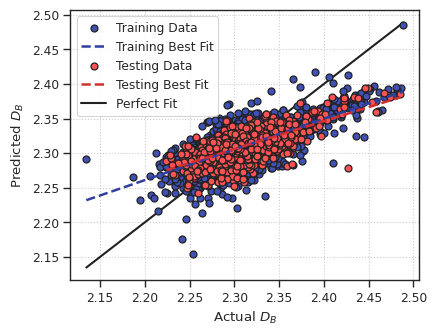

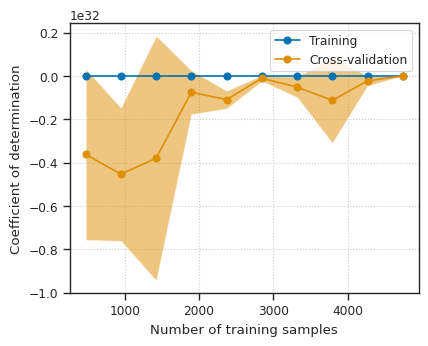

  Feature coefficients:
    time: 0.002
    N_atom_surface: 0.041
    R_diff: 0.059
    R_min: 0.020
    MM_TCN_avg: 0.164
    MM_BL_avg: 0.008
    MM_BL_min: 0.004
    ICOS: 0.006
    MM_SCN_2: 0.001
    MM_SCN_12: 0.001
    MM_SCN_13: 0.004
    MM_SCN_14: 0.007
    MM_TCN_16: 0.010
    MM_TCN_17: 0.001
    MM_BCN_6: 0.003
    MM_BCN_7: 0.001
    MM_BCN_8: 0.007

Dataset: MNP
Best score: 0.705
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9274486641154054, 'max_leaf_nodes': 91, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.793
    Cross-validation score: 0.705 +/- 0.018
    Testing score:
      Mean absolute error: 0.011835
      Mean squared error: 0.000263
      Root mean squared error: 0.016223
      Coefficient of determination: 0.715


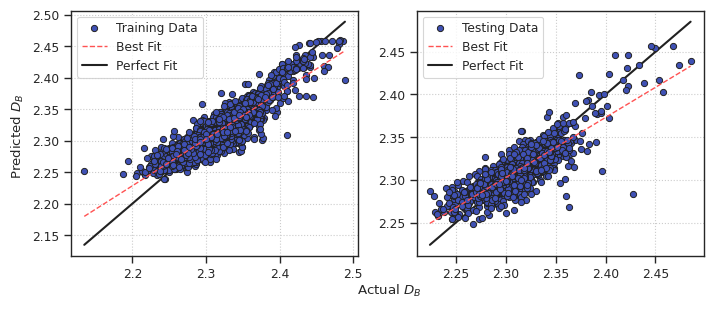

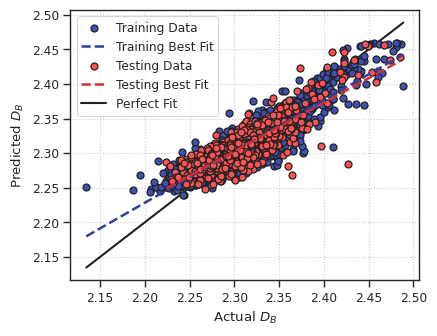

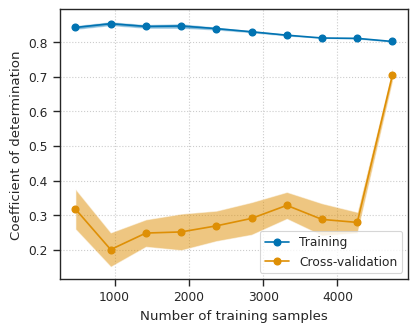

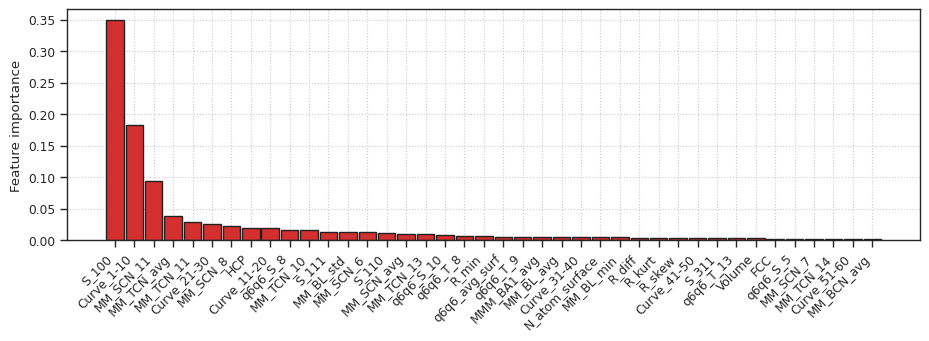

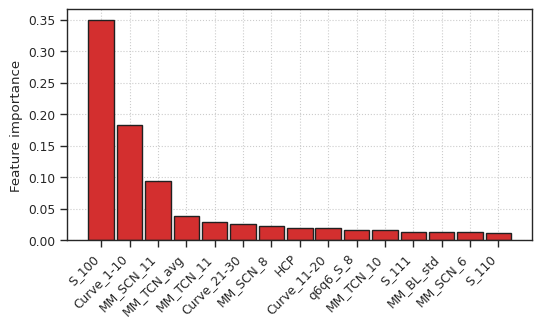

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.384
    Cross-validation score: 0.246 +/- 0.120
    Testing score:
      Mean absolute error: 0.017827
      Mean squared error: 0.000540
      Root mean squared error: 0.023228
      Coefficient of determination: 0.377


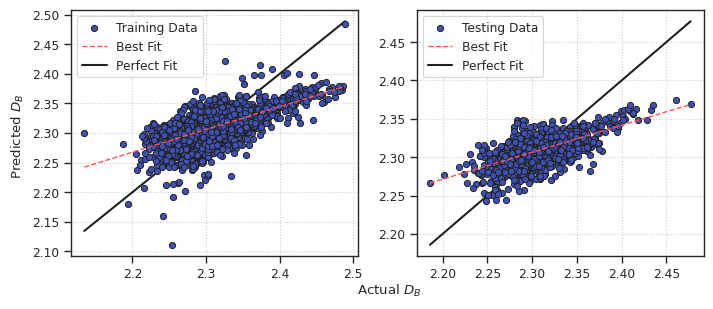

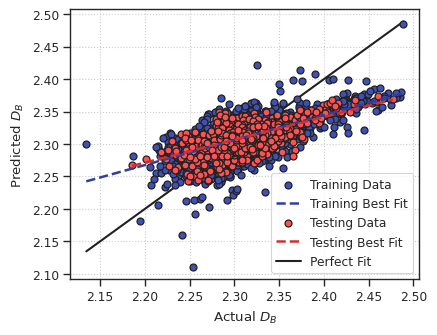

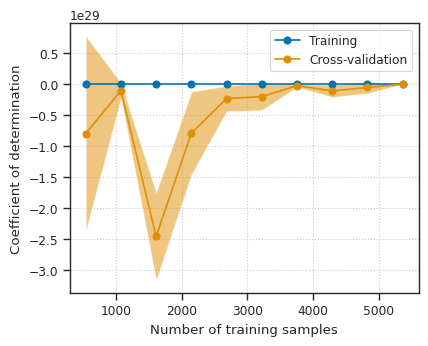

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.008
    N_atom_surface: 0.004
    Volume: 0.003
    R_diff: 0.026
    R_skew: 0.002
    MM_TCN_avg: 0.204
    MM_BCN_avg: 0.002
    MM_BL_avg: 0.010
    MM_BL_std: 0.004
    MM_BL_min: 0.012
    MM_SCN_13: 0.002
    MM_SCN_15: 0.010
    q6q6_S_3: 0.001
    MM_TCN_16: 0.004
    q6q6_T_10: 0.246
    MM_BCN_9: 0.002

Dataset: MNP


In [ ]:
reducedMNPFeatsDF = loadFeats(f"{DATA_DIR}/reducedMNP_nanoparticle_data.pkl")

CORR_THRESH = 0.8 

for i in range(NUM_RUNS):
    FIG_NAME_APPENDIX = f"minmax_{i}"
    # Data loading
    MNPDF = pd.read_pickle(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}NoArch.pickle")
    archMNPDF = MNPDF.loc[reducedMNPFeatsDF.index]
    MNPDF.drop(reducedMNPFeatsDF.index, inplace=True)
    
    # with open(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}.pickle", 'rb') as f:
    #     MNPDF = pickle.load(f)  # MNPDF1
    # with open(f"{DATA_DIR}/processedMNPEdataNoC{int(CORR_THRESH * 100)}.pickle", 'rb') as f:
    #     MNPDF2 = pickle.load(f)
    # Total Energy
    # MNPDF = MNPDF2.iloc[MNPDF1.index, :].iloc[:, :-1]
    # Formation Energy
    # MNPDF = MNPDF2.iloc[MNPDF1.index, :]
    # MNPDF = MNPDF.drop(['Total_E'], axis=1)
    
    MNPNoNullDF = rmNullFeats(featsDF=MNPDF, verbose=VERBOSE)
    archMNPNoNullDF = rmNullFeats(featsDF=archMNPDF, verbose=VERBOSE)
    
    XtrainMNP, XtestMNP, yTrainMNP, yTestMNP = splitScaleData(df=MNPDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNP = pd.concat([XtrainMNP, archMNPDF.iloc[:, :-1]], axis=0)
    yTrainMNP = pd.concat([yTrainMNP, archMNPDF.iloc[:, -1]], axis=0)
    
    XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull = splitScaleData(df=MNPNoNullDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNPNoNull = pd.concat([XtrainMNPNoNull, archMNPNoNullDF.iloc[:, :-1]], axis=0)
    yTrainMNPNoNull = pd.concat([yTrainMNPNoNull, archMNPNoNullDF.iloc[:, -1]], axis=0)
    
    X_Y_MNPS = {'WithNull': {'MNP': (XtrainMNP, XtestMNP, yTrainMNP, yTestMNP)}, 
                'NoNull': {'MNP': (XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull)}}

    # Linear Regression
    hasMissingVals, modelName = 'NoNull', 'LRR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
        
        linReg = LinearRegression(positive=False, fit_intercept=True, 
                                  copy_X=True, n_jobs=NUM_JOBS)  # No speedup from n_jobs here as n_target=1 and positive=False
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        yPredTrainLinR, yPredTestLinR, linReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                         model=linReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                         numFeat=20, isReg=True, showFeatCoef=True, plotFeatImp=False, verbose=True, showFig=True)

    # Random Forest
    hasMissingVals, modelName = 'WithNull', 'RFR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        # if exists(f"{DATA_DIR}/hpTune{mnp}{modelName}.pickle"):
        #     print('Already done, skipping...')
        #     continue
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
    
        rfReg = RandomForestRegressor(n_estimators=40, criterion='squared_error', max_depth=None, 
                                      max_features=1.0, max_leaf_nodes=None, min_samples_split=2, min_samples_leaf=1, 
                                      min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0, n_jobs=NUM_JOBS, random_state=RANDOM_SEED, verbose=0, 
                                      bootstrap=True, oob_score=False, warm_start=False, ccp_alpha=0.0, max_samples=None, monotonic_cst=None)
        paramGrid = {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'], 
                     'n_estimators': stats.randint(low=3, high=100), 
                     'max_depth' : stats.randint(low=1, high=10), 
                     'max_features': stats.uniform(loc=0.1, scale=0.9), 
                     'max_leaf_nodes': stats.randint(low=5, high=100),
                     'min_samples_split': stats.randint(low=2, high=20), 
                     'min_samples_leaf': stats.randint(low=1, high=10)}
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        searchResults = hyperparamTune(rfReg, paramGrid, Xtrain, yTrain, scoringMetric='r2', cv=cv, numIter=1000)
        with open(f"{DATA_DIR}/hpTune{mnp}{modelName}run{i}.pickle", 'wb') as f:
            pickle.dump(searchResults, f)
    
        rfReg = searchResults.best_estimator_
        yPredTrainRFR, yPredTestRFR, rfReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                      model=rfReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                      numFeat=15, showFeatCoef=False, plotFeatImp=True, verbose=True, showFig=True)
        # # Note: Set 'showFig' to False for cluster jobs!

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.384
    Cross-validation score: 0.246 +/- 0.120
    Testing score:
      Mean absolute error: 0.017827
      Mean squared error: 0.000540
      Root mean squared error: 0.023228
      Coefficient of determination: 0.377


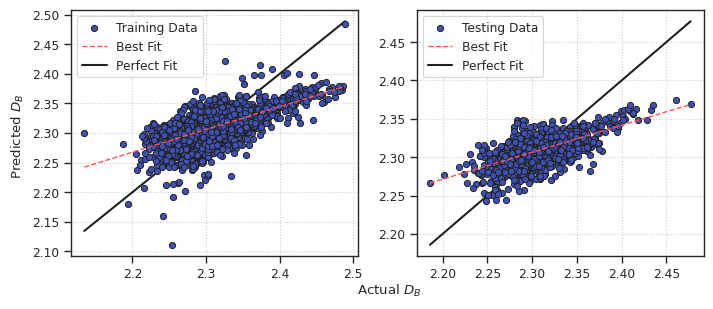

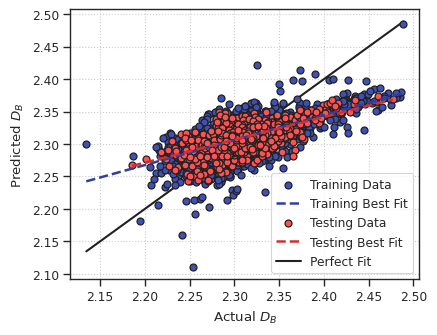

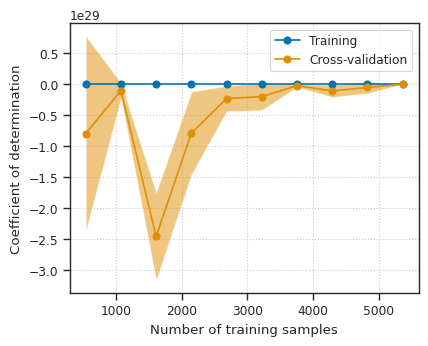

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.008
    N_atom_surface: 0.004
    Volume: 0.003
    R_diff: 0.026
    R_skew: 0.002
    MM_TCN_avg: 0.204
    MM_BCN_avg: 0.002
    MM_BL_avg: 0.010
    MM_BL_std: 0.004
    MM_BL_min: 0.012
    MM_SCN_13: 0.002
    MM_SCN_15: 0.010
    q6q6_S_3: 0.001
    MM_TCN_16: 0.004
    q6q6_T_10: 0.246
    MM_BCN_9: 0.002

Dataset: MNP
Best score: 0.718
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9274486641154054, 'max_leaf_nodes': 91, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.793
    Cross-validation score: 0.718 +/- 0.015
    Testing score:
      Mean absolute error: 0.011740
      Mean squared error: 0.000256
      Root mean squared error: 0.016008
      Coefficient of determination: 0.704


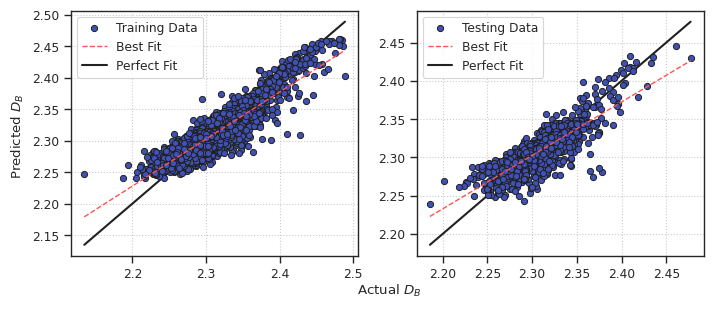

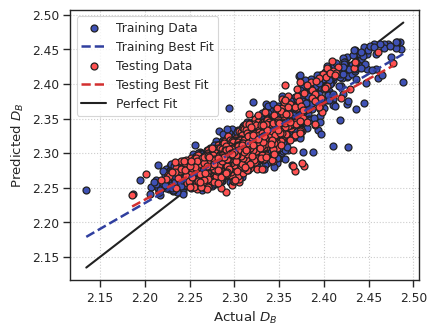

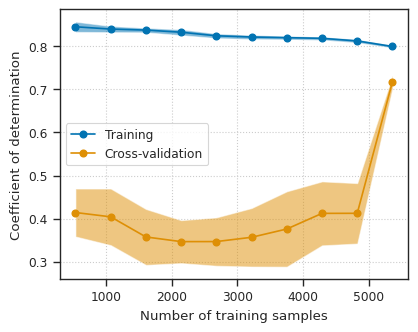

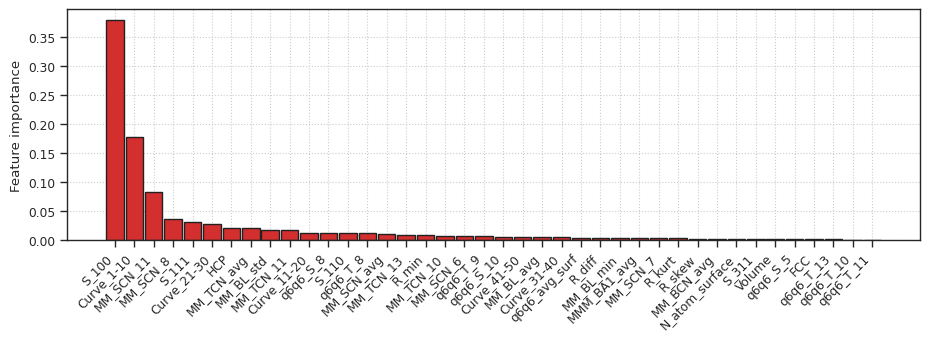

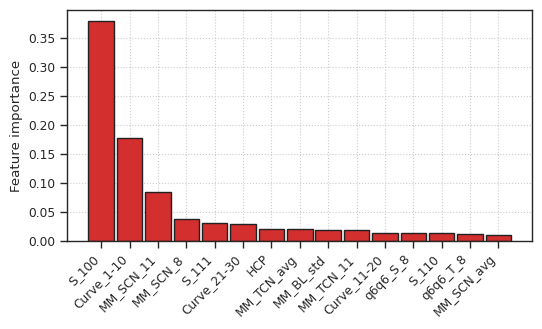

Removing the features with null values...
  Original number of features: 74
  Total number of features left: 74

Removing the features with null values...
  Original number of features: 74
  Total number of features left: 74

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.367
    Cross-validation score: 0.105 +/- 0.270
    Testing score:
      Mean absolute error: 0.018726
      Mean squared error: 0.000585
      Root mean squared error: 0.024184
      Coefficient of determination: 0.374


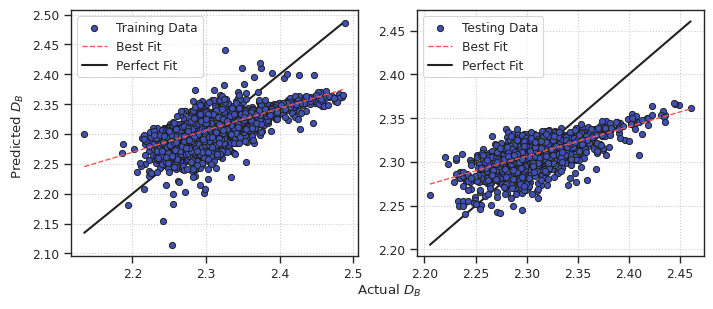

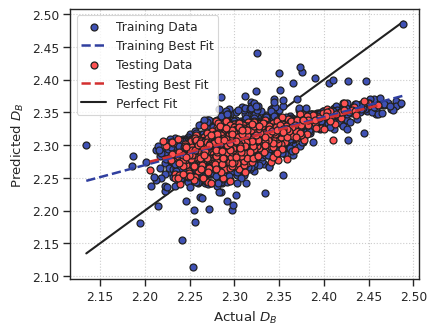

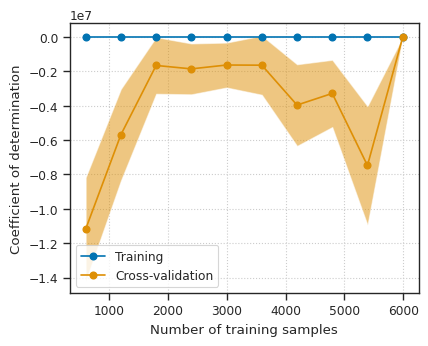

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.008
    N_atom_surface: 0.005
    Volume: 0.002
    R_diff: 0.013
    R_skew: 0.032
    MM_TCN_avg: 0.213
    MM_BL_avg: 0.009
    MM_BL_std: 0.005
    MM_BL_min: 0.012
    MM_SCN_13: 0.004
    MM_SCN_14: 0.007
    MM_SCN_15: 0.011
    MM_TCN_16: 0.011
    MM_TCN_17: 0.001
    MM_BCN_9: 0.002

Dataset: MNP
Best score: 0.721
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9463772865706722, 'max_leaf_nodes': 94, 'min_samples_leaf': 5, 'min_samples_split': 19, 'n_estimators': 79}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.793
    Cross-validation score: 0.721 +/- 0.017
    Testing score:
      Mean absolute error: 0.011738
      Mean squared error: 0.000257
      Root mean squared error: 0.016039
      Coefficient of determination: 0.725


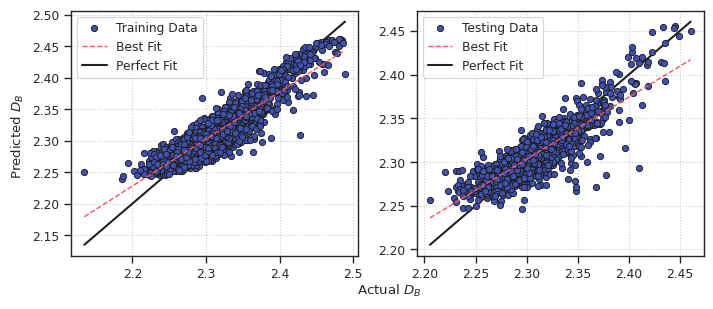

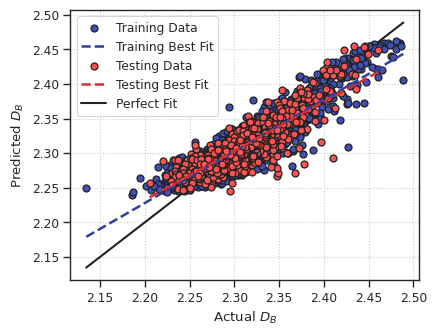

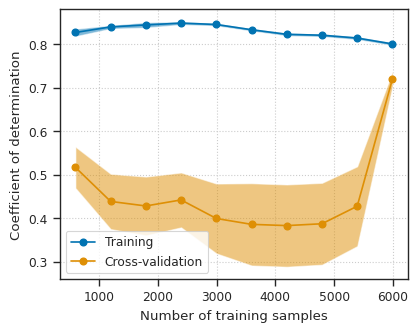

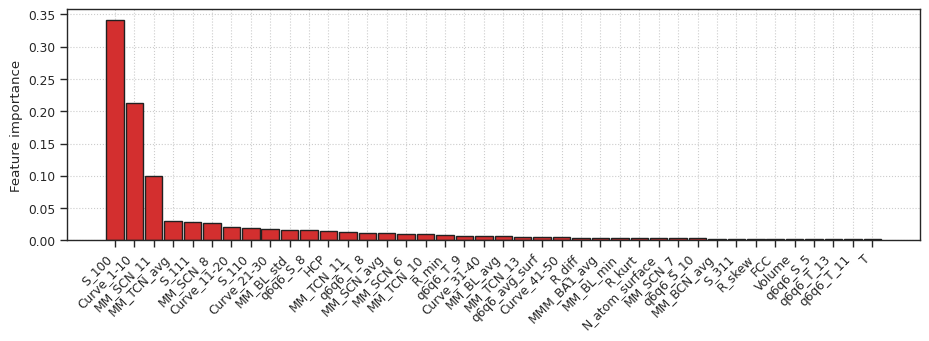

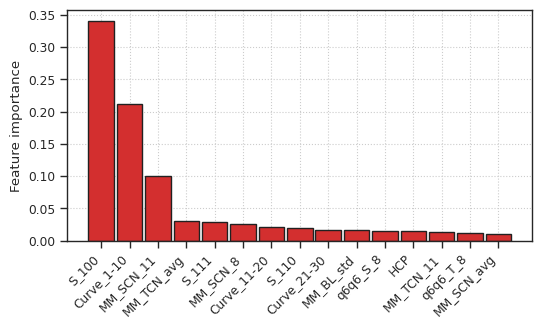

In [11]:
reducedMNPFeatsDF = loadFeats(f"{DATA_DIR}/reducedMNP_nanoparticle_data.pkl")

CORR_THRESH = 0.8

for i in range(NUM_RUNS):
    if i < 8: continue
    FIG_NAME_APPENDIX = f"minmax_{i}"
    # Data loading
    MNPDF = pd.read_pickle(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}NoArch.pickle")
    archMNPDF = MNPDF.loc[reducedMNPFeatsDF.index]
    MNPDF.drop(reducedMNPFeatsDF.index, inplace=True)
    
    # with open(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}.pickle", 'rb') as f:
    #     MNPDF = pickle.load(f)  # MNPDF1
    # with open(f"{DATA_DIR}/processedMNPEdataNoC{int(CORR_THRESH * 100)}.pickle", 'rb') as f:
    #     MNPDF2 = pickle.load(f)
    # Total Energy
    # MNPDF = MNPDF2.iloc[MNPDF1.index, :].iloc[:, :-1]
    # Formation Energy
    # MNPDF = MNPDF2.iloc[MNPDF1.index, :]
    # MNPDF = MNPDF.drop(['Total_E'], axis=1)
    
    MNPNoNullDF = rmNullFeats(featsDF=MNPDF, verbose=VERBOSE)
    archMNPNoNullDF = rmNullFeats(featsDF=archMNPDF, verbose=VERBOSE)
    
    XtrainMNP, XtestMNP, yTrainMNP, yTestMNP = splitScaleData(df=MNPDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNP = pd.concat([XtrainMNP, archMNPDF.iloc[:, :-1]], axis=0)
    yTrainMNP = pd.concat([yTrainMNP, archMNPDF.iloc[:, -1]], axis=0)
    
    XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull = splitScaleData(df=MNPNoNullDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNPNoNull = pd.concat([XtrainMNPNoNull, archMNPNoNullDF.iloc[:, :-1]], axis=0)
    yTrainMNPNoNull = pd.concat([yTrainMNPNoNull, archMNPNoNullDF.iloc[:, -1]], axis=0)
    
    X_Y_MNPS = {'WithNull': {'MNP': (XtrainMNP, XtestMNP, yTrainMNP, yTestMNP)}, 
                'NoNull': {'MNP': (XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull)}}

    # Linear Regression
    hasMissingVals, modelName = 'NoNull', 'LRR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
        
        linReg = LinearRegression(positive=False, fit_intercept=True, 
                                  copy_X=True, n_jobs=NUM_JOBS)  # No speedup from n_jobs here as n_target=1 and positive=False
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        yPredTrainLinR, yPredTestLinR, linReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                         model=linReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                         numFeat=20, isReg=True, showFeatCoef=True, plotFeatImp=False, verbose=True, showFig=True)

    # Random Forest
    hasMissingVals, modelName = 'WithNull', 'RFR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        # if exists(f"{DATA_DIR}/hpTune{mnp}{modelName}.pickle"):
        #     print('Already done, skipping...')
        #     continue
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
    
        rfReg = RandomForestRegressor(n_estimators=40, criterion='squared_error', max_depth=None, 
                                      max_features=1.0, max_leaf_nodes=None, min_samples_split=2, min_samples_leaf=1, 
                                      min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0, n_jobs=NUM_JOBS, random_state=RANDOM_SEED, verbose=0, 
                                      bootstrap=True, oob_score=False, warm_start=False, ccp_alpha=0.0, max_samples=None, monotonic_cst=None)
        paramGrid = {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'], 
                     'n_estimators': stats.randint(low=3, high=100), 
                     'max_depth' : stats.randint(low=1, high=10), 
                     'max_features': stats.uniform(loc=0.1, scale=0.9), 
                     'max_leaf_nodes': stats.randint(low=5, high=100),
                     'min_samples_split': stats.randint(low=2, high=20), 
                     'min_samples_leaf': stats.randint(low=1, high=10)}
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        searchResults = hyperparamTune(rfReg, paramGrid, Xtrain, yTrain, scoringMetric='r2', cv=cv, numIter=1000)
        with open(f"{DATA_DIR}/hpTune{mnp}{modelName}run{i}.pickle", 'wb') as f:
            pickle.dump(searchResults, f)
    
        rfReg = searchResults.best_estimator_
        yPredTrainRFR, yPredTestRFR, rfReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                      model=rfReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                      numFeat=15, showFeatCoef=False, plotFeatImp=True, verbose=True, showFig=True)
        # # Note: Set 'showFig' to False for cluster jobs!

# Model Performance Comparison

## Random 250 Instances

This table presents the performance metrics for Linear Regression and Random Forest models predicting $D_B$ across 10 runs, after fitting to randomly sampled 250 instances.

<table>
  <tr>
    <th rowspan="2">Run</th>
    <th rowspan="2">Number of Instances</th>
    <th rowspan="2">Number of Features</th>
    <th colspan="3">Linear Regression</th>
    <th colspan="3">Random Forest</th>
  </tr>
  <tr>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
  </tr>
  <tr>
    <td>1</td> <td>250</td> <td>46</td> <td>0.638</td> <td>0.356$\pm$0.180</td> <td>-0.510</td> <td>0.884</td> <td>0.594$\pm$0.098</td> <td>0.178</td>
  </tr>
  <tr>
    <td>2</td> <td>250</td> <td>49</td> <td>0.748</td> <td>0.348$\pm$0.242</td> <td>0.336</td> <td>0.932</td> <td>0.700$\pm$0.115</td> <td>0.658</td>
  </tr>
  <tr>
    <td>3</td> <td>250</td> <td>47</td> <td>0.625</td> <td>0.116$\pm$0.357</td> <td>0.334</td> <td>0.674</td> <td>0.378$\pm$0.055</td> <td>0.451</td>
  </tr>
  <tr>
    <td>4</td> <td>250</td> <td>46</td> <td>0.665</td> <td>-1.04$\pm$2.383</td> <td>0.319</td> <td>0.883</td> <td>0.514$\pm$0.089</td> <td>0.501</td>
  </tr>
  <tr>
    <td>5</td> <td>250</td> <td>47</td> <td>0.718</td> <td>0.384$\pm$0.170</td> <td>0.295</td> <td>0.871</td> <td>0.633$\pm$0.065</td> <td>0.610</td>
  </tr>
  <tr>
    <td>6</td> <td>250</td> <td>47</td> <td>0.612</td> <td>-0.603$\pm$1.360</td> <td>0.566</td> <td>0.900</td> <td>0.522$\pm$0.136</td> <td>0.620</td>
  </tr>
  <tr>
    <td>7</td> <td>250</td> <td>48</td> <td>0.649</td> <td>0.035$\pm$0.208</td> <td>0.575</td> <td>0.781</td> <td>0.483$\pm$0.126</td> <td>0.693</td>
  </tr>
  <tr>
    <td>8</td> <td>250</td> <td>52</td> <td>0.764</td> <td>0.327$\pm$0.305</td> <td>0.483</td> <td>0.887</td> <td>0.559$\pm$0.116</td> <td>0.740</td>
  </tr>
  <tr>
    <td>9</td> <td>250</td> <td>59</td> <td>0.693</td> <td>0.262$\pm$0.099</td> <td>0.460</td> <td>0.767</td> <td>0.482$\pm$0.158</td> <td>0.458</td>
  </tr>
  <tr>
    <td>10</td> <td>250</td> <td>46</td> <td>0.727</td> <td>-0.426$\pm$1.185</td> <td>-0.004</td> <td>0.863</td> <td>0.637$\pm$0.056</td> <td>0.542</td>
  </tr>
</table>


In [17]:
trainingScores = np.array([0.884, 0.932, 0.674, 0.883, 0.871, 0.900, 0.781, 0.887, 0.767, 0.863])
validationScores = np.array([0.594, 0.700, 0.378, 0.514, 0.633, 0.522, 0.483, 0.559, 0.482, 0.637])
validationErrors = np.array([0.098, 0.115, 0.055, 0.089, 0.065, 0.136, 0.126, 0.116, 0.158, 0.056])
testingScores = np.array([0.178, 0.658, 0.451, 0.501, 0.610, 0.620, 0.693, 0.740, 0.458, 0.542])
print(f"Average training score: {trainingScores.mean():.3f}")
print(f"Average validation score: {validationScores.mean():.3f}")
print(f"Averaged validation error: {validationErrors.mean():.3f}")
print(f"Average testing score: {testingScores.mean():.3f}")

Average training score: 0.844
Average validation score: 0.550
Averaged validation error: 0.101
Average testing score: 0.545


## Random 250 Instances

This table presents the performance metrics for Linear Regression and Random Forest models predicting total energy across 10 runs, after fitting to randomly sampled 250 instances.

<table>
  <tr>
    <th rowspan="2">Run</th>
    <th rowspan="2">Number of Instances</th>
    <th rowspan="2">Number of Features</th>
    <th colspan="3">Linear Regression</th>
    <th colspan="3">Random Forest</th>
  </tr>
  <tr>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
  </tr>
  <tr>
    <td>1</td> <td>250</td> <td>46</td> <td>0.987</td> <td>0.951$\pm$0.010</td> <td>0.959</td> <td>0.991</td> <td>0.960$\pm$0.010</td> <td>0.985</td>
  </tr>
  <tr>
    <td>2</td> <td>250</td> <td>49</td> <td>0.989</td> <td>0.941$\pm$0.020</td> <td>0.934</td> <td>0.989</td> <td>0.943$\pm$0.024</td> <td>0.956</td>
  </tr>
  <tr>
    <td>3</td> <td>250</td> <td>47</td> <td>0.991</td> <td>0.956$\pm$0.024</td> <td>0.945</td> <td>0.992</td> <td>0.961$\pm$0.013</td> <td>0.885</td>
  </tr>
  <tr>
    <td>4</td> <td>250</td> <td>46</td> <td>0.993</td> <td>0.954$\pm$0.028</td> <td>0.983</td> <td>0.992</td> <td>0.965$\pm$0.028</td> <td>0.980</td>
  </tr>
  <tr>
    <td>5</td> <td>250</td> <td>47</td> <td>0.989</td> <td>0.958$\pm$0.011</td> <td>0.971</td> <td>0.994</td> <td>0.971$\pm$0.008</td> <td>0.947</td>
  </tr>
  <tr>
    <td>6</td> <td>250</td> <td>47</td> <td>0.991</td> <td>0.966$\pm$0.012</td> <td>0.988</td> <td>0.992</td> <td>0.966$\pm$0.023</td> <td>0.985</td>
  </tr>
  <tr>
    <td>7</td> <td>250</td> <td>48</td> <td>0.989</td> <td>0.952$\pm$0.021</td> <td>0.868</td> <td>0.993</td> <td>0.963$\pm$0.009</td> <td>0.989</td>
  </tr>
  <tr>
    <td>8</td> <td>250</td> <td>52</td> <td>0.993</td> <td>0.967$\pm$0.021</td> <td>0.937</td> <td>0.990</td> <td>0.954$\pm$0.021</td> <td>0.904</td>
  </tr>
  <tr>
    <td>9</td> <td>250</td> <td>59</td> <td>0.982</td> <td>0.940$\pm$0.015</td> <td>0.969</td> <td>0.980</td> <td>0.938$\pm$0.022</td> <td>0.979</td>
  </tr>
  <tr>
    <td>10</td> <td>250</td> <td>46</td> <td>0.987</td> <td>0.926$\pm$0.042</td> <td>0.963</td> <td>0.991</td> <td>0.943$\pm$0.029</td> <td>0.956</td>
  </tr>
</table>


In [4]:
trainingScores = np.array([0.991, 0.989, 0.992, 0.992, 0.994, 0.992, 0.993, 0.990, 0.980, 0.991])
validationScores = np.array([0.960, 0.943, 0.961, 0.965, 0.971, 0.966, 0.963, 0.954, 0.938, 0.943])
validationErrors = np.array([0.010, 0.024, 0.013, 0.028, 0.008, 0.023, 0.009, 0.021, 0.022, 0.029])
testingScores = np.array([0.985, 0.956, 0.885, 0.980, 0.947, 0.985, 0.989, 0.904, 0.979, 0.956])
print(f"Average training score: {trainingScores.mean():.3f}")
print(f"Average validation score: {validationScores.mean():.3f}")
print(f"Averaged validation error: {validationErrors.mean():.3f}")
print(f"Average testing score: {testingScores.mean():.3f}")

Average training score: 0.990
Average validation score: 0.956
Averaged validation error: 0.019
Average testing score: 0.957


## Random Instances

This table presents the performance metrics for Linear Regression and Random Forest models across 10 runs, after fitting to randomly sampled instances.

<table>
  <tr>
    <th rowspan="2">Run</th>
    <th rowspan="2">Number of Instances</th>
    <th rowspan="2">Number of Features</th>
    <th colspan="3">Linear Regression</th>
    <th colspan="3">Random Forest</th>
  </tr>
  <tr>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
  </tr>
  <tr>
    <td>1</td> <td>500</td> <td>69</td> <td>0.704</td> <td>-2e15$\pm$4e15</td> <td>0.698</td> <td>0.869</td> <td>0.619$\pm$0.049</td> <td>0.729</td>
  </tr>
  <tr>
    <td>2</td> <td>1477</td> <td>72</td> <td>0.671</td> <td>-2e15$\pm$3e15</td> <td>0.680</td> <td>0.844</td> <td>0.697$\pm$0.047</td> <td>0.683</td>
  </tr>
  <tr>
    <td>3</td> <td>2455</td> <td>72</td> <td>0.727</td> <td>0.702$\pm$0.028</td> <td>0.655</td> <td>0.858</td> <td>0.746$\pm$0.043</td> <td>0.705</td>
  </tr>
  <tr>
    <td>4</td> <td>3433</td> <td>71</td> <td>0.697</td> <td>0.670$\pm$0.048</td> <td>0.674</td> <td>0.829</td> <td>0.721$\pm$0.049</td> <td>0.702</td>
  </tr>
  <tr>
    <td>5</td> <td>4411</td> <td>73</td> <td>0.693</td> <td>-9e18$\pm$2e19</td> <td>0.675</td> <td>0.823</td> <td>0.734$\pm$0.017</td> <td>0.730</td>
  </tr>
  <tr>
    <td>6</td> <td>5388</td> <td>72</td> <td>0.697</td> <td>0.684$\pm$0.026</td> <td>0.678</td> <td>0.815</td> <td>0.728$\pm$0.025</td> <td>0.741</td>
  </tr>
  <tr>
    <td>7</td> <td>6366</td> <td>73</td> <td>0.680</td> <td>0.663$\pm$0.036</td> <td>0.705</td> <td>0.798</td> <td>0.719$\pm$0.035</td> <td>0.757</td>
  </tr>
  <tr>
    <td>8</td> <td>7344</td> <td>73</td> <td>0.689</td> <td>0.679$\pm$0.018</td> <td>0.628</td> <td>0.803</td> <td>0.734$\pm$0.027</td> <td>0.692</td>
  </tr>
  <tr>
    <td>9</td> <td>8322</td> <td>74</td> <td>0.688</td> <td>0.680$\pm$0.023</td> <td>0.682</td> <td>0.XXX</td> <td>0.XXX$\pm$0.XXX</td> <td>0.XXX</td>
  </tr>
  <tr>
    <td>10</td> <td>9300</td> <td>73</td> <td>0.XXX</td> <td>0.XXX$\pm$0.XXX</td> <td>0.XXX</td> <td>0.XXX</td> <td>0.XXX$\pm$0.XXX</td> <td>0.XXX</td>
  </tr>
</table>


## Extra Instances

This table presents the performance metrics for Linear Regression and Random Forest models across 10 runs, after fitting to datasets consisting of most archetypal 250 instances and randomly sampled instances.

<table>
  <tr>
    <th rowspan="2">Run</th>
    <th rowspan="2">Number of Instances</th>
    <th rowspan="2">Number of Features</th>
    <th colspan="3">Linear Regression</th>
    <th colspan="3">Random Forest</th>
  </tr>
  <tr>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
  </tr>
  <tr>
    <td>1</td> <td>500</td> <td>76</td> <td>0.531</td> <td>0.223$\pm$0.210</td> <td>0.344</td> <td>0.826</td> <td>0.500$\pm$0.052</td> <td>0.225</td>
  </tr>
  <tr>
    <td>2</td> <td>1477</td> <td>74</td> <td>0.406</td> <td>0.290$\pm$0.078</td> <td>0.295</td> <td>0.834</td> <td>0.633$\pm$0.026</td> <td>0.646</td>
  </tr>
  <tr>
    <td>3</td> <td>2455</td> <td>74</td> <td>0.446</td> <td>0.366$\pm$0.056</td> <td>0.431</td> <td>0.824</td> <td>0.631$\pm$0.029</td> <td>0.658</td>
  </tr>
  <tr>
    <td>4</td> <td>3433</td> <td>75</td> <td>0.449</td> <td>0.348$\pm$0.075</td> <td>0.461</td> <td>0.813</td> <td>0.660$\pm$0.036</td> <td>0.717</td>
  </tr>
  <tr>
    <td>5</td> <td>4411</td> <td>74</td> <td>0.453</td> <td>0.361$\pm$0.071</td> <td>0.421</td> <td>0.813</td> <td>0.695$\pm$0.038</td> <td>0.722</td>
  </tr>
  <tr>
    <td>6</td> <td>5388</td> <td>74</td> <td>0.457</td> <td>0.388$\pm$0.013</td> <td>0.476</td> <td>0.810</td> <td>0.710$\pm$0.031</td> <td>0.737</td>
  </tr>
  <tr>
    <td>7</td> <td>6366</td> <td>75</td> <td>0.461</td> <td>0.390$\pm$0.043</td> <td>0.470</td> <td>0.806</td> <td>0.710$\pm$0.022</td> <td>0.729</td>
  </tr>
  <tr>
    <td>8</td> <td>7344</td> <td>74</td> <td>0.444</td> <td>0.392$\pm$0.026</td> <td>0.421</td> <td>0.793</td> <td>0.705$\pm$0.018</td> <td>0.715</td>
  </tr>
  <tr>
    <td>9</td> <td>8322</td> <td>74</td> <td>0.384</td> <td>0.246$\pm$0.120</td> <td>0.377</td> <td>0.793</td> <td>0.718$\pm$0.015</td> <td>0.704</td>
  </tr>
  <tr>
    <td>10</td> <td>9300</td> <td>73</td> <td>0.367</td> <td>0.105$\pm$0.270</td> <td>0.374</td> <td>0.793</td> <td>0.721$\pm$0.017</td> <td>0.725</td>
  </tr>
</table>
